In [10]:
def algoritmo(df2, fecha, show, parcela):
    diasTotales = 365 + 31
    #from IPython.core.display import display, HTML
    #display(HTML("<style>div.output_scroll { height: 90em; }</style>"))

    import pandas as pd
    import matplotlib.pyplot as plt
    import numpy as np
    import datetime

    import warnings
    warnings.filterwarnings("ignore")
    
    borrarDebajo = 0.15
    
    fechas = list()
    fechas2 = list()
    valores = list()
    valores2= list()
    N = int(df2.size / 3) #numero de valores que tenemos para esta parcela

    #Almacenamos los datos originales de la parcela en 'fechas' y 'valores'
    #En 'fechas2' y 'valores2' almacenamos los datos cuyo ndvi esté por encima de 'borrarDebajo'
    for i in range(N):
        data = df2.iloc[i].fecha
        data = str(data)
        #Esto convierte la cadena YYYYMMDD en un tipo de dato fecha
        dt = datetime.datetime.strptime(data, "%Y%m%d")
        dtInt = int(dt.strftime("%j"))
        if int(data) >= 20220000:
            dtInt = dtInt +365
        #Convierto ese tipo de dato fecha en un entero, el dia del año de esa fecha
        #Ej. 20210202 es el 2 de febrero y es el dia 33 del año
        fechas.append(dtInt)
        ndvi = df2.iloc[i].ndvi
        valores.append(ndvi)
        #Solo añado si el valor está por encima de la variable "borrarDebajo"
        if ndvi >= borrarDebajo:
            valores2.append(ndvi)
            fechas2.append(dtInt)

    #Borramos de 'valores2' y 'fechas2' los datos cuyos ndvi sean menores que el dato anterior y al siguiente (valores valle)
    #Ejemplo: si tenemos los valores [3,1,2,4], borramos los valores 1 y 2
    #Si tenemos los valores [3,1,4], borramos el valor 1
    #Borramos los valores valle
    for i in range(len(valores2)-1):
        if i > 0 and i < len(valores2)-1:
            #Si hay 2 valores juntos menores que el anterior y el siguiente, se borran ambos
            if i < (len(valores2) - 2) and valores2[i-1] > valores2[i] and valores2[i-1] > valores2[i+1] and valores2[i+2] > valores2[i] and valores2[i+2] > valores2[i+1]:
                del valores2[i]
                del fechas2[i]
                del valores2[i]
                del fechas2[i]
            #En el caso de que solo haya un minimo entre 2 puntos
            elif valores2[i-1] > valores2[i] and valores2[i+1] > valores2[i]:
                del valores2[i]
                del fechas2[i]        






    #Variables:
    saltoFechas = 10
    saltoFechas2 = 20
    saltoFechas3 = 30
    añadirPorDebajo = 0.4 #antes se llamaba maximoMinimo
    añadirPorEncima = 0.2

    #Añado informacion al principio y final de año si no habia
    if fechas2[0] > 0:
        fechas2.insert(0, 0)
        valores2.insert(0, valores2[0])
    if fechas2[len(fechas2) -1] < diasTotales:
        fechas2.insert(len(fechas2), diasTotales)
        valores2.insert(len(valores2), valores2[len(valores2)-1])


    #Si hay saltos muy grandes sin informacion se trata:
    i = 0
    while i < len(fechas2) - 1: 
        encontrado = False
        #Si el salto es muy grande
        if (fechas2[i+1]-fechas2[i]) >= saltoFechas3 and i+1 != (len(fechas2) -1) and i != 0:
            #buscar maximos locales entre los dos puntos y
            aux1 = 0
            aux2 = 0
            for j in range(len(fechas) - 1):
                if fechas[j] <= fechas2[i] and fechas[j+1] >= fechas2[i]:
                    aux1 = j
                elif fechas[j] <= fechas2[i]  and fechas[j+1] >= fechas2[i]   :
                    aux2 = j
                    break
            j = aux1 + 1
            auxSum = 0
            while (j < aux2):
                if valores[j] > valores[j-1] and valores[j] > valores[j+1]:
                    # y volverlos a añadir segun su valor
                    if (valores2[i] <= 0.6 and valores2[i+1] <=0.6 and valores[j] <= añadirPorDebajo and valores[j] >= añadirPorEncima):
                        fechas2.insert(i+1+ auxSum, fechas[j])
                        valores2.insert(i+1+ auxSum, valores[j])
                        auxSum = auxSum + 1
                        encontrado = True
                j = j + 1



        if encontrado == False:    
            #Si el salto es intermedio
            if (fechas2[i+1]-fechas2[i]) >= saltoFechas2:
                if valores2[i+1] > valores2[i]: #va hacia arriba
                    fechas2.insert(i+1, fechas2[i] + ((fechas2[i+1] - fechas2[i]) / 3)*2)
                    valores2.insert(i+1, valores2[i] + ((valores2[i+1] - valores2[i]) / 3))
                else: #va hacia abajo
                    fechas2.insert(i+1, fechas2[i] + ((fechas2[i+1] - fechas2[i]) / 3))
                    valores2.insert(i+1,  valores2[i+1] + ((valores2[i] - valores2[i+1]) / 3))
            #Si el salto es pequeño
            elif (fechas2[i+1]-fechas2[i]) >= saltoFechas:
                fechas2.insert(i+1, (fechas2[i+1]+fechas2[i])/2)
                valores2.insert(i+1, (valores2[i+1]+valores2[i])/2)
        i = i+1


    #Plot    
    from scipy.interpolate import make_interp_spline
    from scipy.interpolate import interp1d

    #Esto crea una linea de <diasTotales> puntos que pasa por todos los puntos que teniamos
    X_Y_Spline = make_interp_spline(fechas2,valores2)        
    X = np.linspace(0, diasTotales, diasTotales)
    Y = X_Y_Spline(X)

    dt = datetime.datetime.strptime(fecha, "%Y%m%d")
    aux = int(dt.strftime("%j"))
    
    if (show):
        plt.figure(figsize=(17,5))
        plt.title('parcela: '+ parcela)
        plt.plot(fechas, valores,'r-')

        plt.xticks(np.arange(0, diasTotales,10))

        plt.plot(X, Y, 'b-')
        plt.scatter(fechas, valores, c=valores, cmap='Set2')

        #Dibujar las lineas verticales asociadas a las fechas de recepcion
        #for recepcion in recepciones:
        #    if recepcion[0] == parcela:
        #        for aux in recepcion[1]:
        #            dt = datetime.datetime.strptime(aux, "%Y%m%d")
        #            aux2 = int(dt.strftime("%j"))
        #            plt.axvline(x=(aux2))  
        #        break

        #dt = datetime.datetime.strptime(fecha, "%Y%m%d")
        #aux = int(dt.strftime("%j"))
        plt.axvline(x=(aux))  



        plt.xlabel("X")
        plt.ylabel("Y")
        plt.ylim([0, 1])
        plt.legend(["puntos originales","puntos modificados"])
        plt.show()
        
    return [Y, aux]

def obtenerColumnas():
    columnas = list()
    columnas.append('parcela')
    columnas.append('dia')
    columnas.append('pendiente dia -15')
    columnas.append('pendiente dia -10')
    columnas.append('pendiente dia -5')
    columnas.append('ndvi')
    columnas.append('recogido')
    
    return columnas

def inicializarDataframeIA(columnas):
    import pandas as pd
    df_ia = pd.DataFrame(columns=columnas())
    
    return df_ia

def obtenerParcelasConUnaRecepcion(PARCELASMAIZ20212022CONFECHAS):
    import pandas as pd

    dfFechas = pd.read_csv(PARCELASMAIZ20212022CONFECHAS)
    
    freq = dfFechas['PAC'].value_counts()
    items = freq[freq==1].index
    only_1_reception = dfFechas[dfFechas['PAC'].isin(items)]

    newPac = only_1_reception["PAC"].str.replace(":", "_")
    newDate = only_1_reception["Fecha de carga"].str.replace("-", "")

    only_1_reception["PAC"] = newPac
    only_1_reception["Fecha de carga"] = newDate
    only_1_reception['Fecha de carga'] = only_1_reception['Fecha de carga'].apply(str)
    
    return only_1_reception

def añadirADataframe(parcela, diaDeCarga, valoresDias, columnas, df,diasPendiente, diasMargen):
    import pandas as pd
    for i in range(len(valoresDias)):
        if ((i - (diasPendiente[0])) >= 0 and (i+1) - diaDeCarga > -15 and (i+1) - diaDeCarga <= 5  ):
            
            lista = list()
            lista.append(parcela)
            lista.append(i + 1)
            for j in diasPendiente:
                lista.append((valoresDias[i - j] - valoresDias[i])/j)
                
            lista.append(valoresDias[i])
            if ((diaDeCarga - (i + 1)) <= diasMargen and (diaDeCarga - (i + 1)) >= 0):
                lista.append(1)
            else:
                lista.append(0)

            dfAux = pd.DataFrame([lista], columns=columnas(), index=[len(df)])
            df = df.append(dfAux)
    
    
    return df


def obtenerDatosEntrenables(datosNoEntrenables2122, PARCELASMAIZ20212022CONFECHAS):
    import pandas as pd
    dfFechas = obtenerParcelasConUnaRecepcion(PARCELASMAIZ20212022CONFECHAS)
    
    
    dfDatos = pd.read_csv(datosNoEntrenables2122)
    dfDatos = dfDatos.sort_values(by=["fecha","parcela"], ascending=True)
    
    parcelasQueTengo = dfDatos["parcela"].unique()
    parcelasConUnaRecepcion = dfFechas["PAC"].unique()

    df_ndvi_of_only_1_reception = dfDatos[dfDatos.parcela.isin(dfFechas["PAC"].unique())]
    parcelas = df_ndvi_of_only_1_reception['parcela'].unique()
    
    
    df = inicializarDataframeIA(obtenerColumnas)
    i = 0
    j = len(parcelas)
    diaPrimeraRecepcion = [15,10,5]
    diaMargen = 4
    
    
    for parcela in parcelas:

        df2 = df_ndvi_of_only_1_reception.loc[df_ndvi_of_only_1_reception['parcela'] == parcela]
        df2 = df2.drop_duplicates()
        if (not df2.empty):
            fecha_df = dfFechas.loc[dfFechas["PAC"] == parcela] 
            fecha = fecha_df.iloc[0]["Fecha de carga"]
            X, dia_recepcion = algoritmo(df2, fecha, True, parcela)
            if (dia_recepcion > diaPrimeraRecepcion[0]):
                df = añadirADataframe(parcela, dia_recepcion, X, obtenerColumnas, df, diaPrimeraRecepcion, diaMargen)
            i = i + 1
            print(str(i) + "/" + str(j)) 
        else:
            j = j - 1
        

    return df

def separarTrainTest(dataframe):
    parcelas = dataframe['parcela'].unique()
    N = len(parcelas)

    #si hay 2 recintos de la misma zona uno lo meto a test
    test= list()
    train = list(parcelas)
    contador = 1
    for i in range(N):
        parcelaAnterior = parcelas[i - 1].split('_')
        aux = ''
        for j in range(5):
            aux = aux + parcelaAnterior[j] + '_'


        if parcelas[i].startswith(aux):
            test.append(parcelas[i])
            train.remove(parcelas[i])
            if len(test) >= N * 0.1:
                break

    dataframeTrain = dataframe[dataframe['parcela'].isin(train)]
    dataframeTest =  dataframe[dataframe['parcela'].isin(test)]
    
    return [dataframeTrain, dataframeTest]

def obtenerModelo(dataframeTrain, regularizacion=1):
    # Perceptron de un solo nivel
    from keras.layers import Dense
    from keras.regularizers import l2
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers

    
    X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    
    normalizer = layers.Normalization()
    normalizer.adapt(X)
    
    n = dataframeTrain.drop(columns=['parcela','dia','recogido']).shape[1]

    model = Sequential()
    
    model.add(normalizer)
    #,kernel_initializer=initializer
    #model.add(Dense(n**3, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    #añadir capa
    model.add(Dense(n**2, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    model.add(Dense(n, activation='relu', kernel_regularizer=l2(regularizacion)))
    model.add(Dense(1, activation='sigmoid', kernel_regularizer=l2(regularizacion)))
    #
    model.compile(loss='binary_crossentropy', optimizer=Adam(),  metrics=[tf.keras.metrics.BinaryAccuracy(name='binary_accuracy', threshold=0.6), keras.metrics.Recall(name='recall', threshold = 0.6)])
    model.summary()
    
    return model

def obtenerModelo3(dataframeTrain, regularizacion=1):
    # Perceptron de un solo nivel
    from keras.layers import Dense
    from keras.regularizers import l2
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers

    
    X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    
    normalizer = layers.Normalization()
    normalizer.adapt(X)
    
    n = dataframeTrain.drop(columns=['parcela','dia','recogido']).shape[1]

    model = Sequential()
    
    model.add(normalizer)
    #,kernel_initializer=initializer
    #model.add(Dense(n**3, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    #añadir capa
    #model.add(Dense(n**2, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    model.add(Dense(n, activation='relu',input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    model.add(Dense(1, activation='sigmoid', kernel_regularizer=l2(regularizacion)))
    #
    model.compile(loss='binary_crossentropy', optimizer=Adam(),  metrics=[tf.keras.metrics.BinaryAccuracy(name='binary_accuracy', threshold=0.6), keras.metrics.Recall(name='recall')])
    model.summary()
    
    return model

def obtenerModelo4(dataframeTrain, regularizacion=1):
    # Perceptron de un solo nivel
    from keras.layers import Dense
    from keras.regularizers import l2
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers

    
    X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    
    normalizer = layers.Normalization()
    normalizer.adapt(X)
    
    n = dataframeTrain.drop(columns=['parcela','dia','recogido']).shape[1]

    model = Sequential()
    
    model.add(normalizer)
    #,kernel_initializer=initializer
    model.add(Dense(n**3, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    #añadir capa
    model.add(Dense(n**2, activation='relu',  kernel_regularizer=l2(regularizacion)))
    model.add(Dense(n, activation='relu', kernel_regularizer=l2(regularizacion)))
    model.add(Dense(1, activation='sigmoid', kernel_regularizer=l2(regularizacion)))
    #
    model.compile(loss='binary_crossentropy', optimizer=Adam(),  metrics=[tf.keras.metrics.BinaryAccuracy(name='binary_accuracy', threshold=0.6), keras.metrics.Recall(name='recall', threshold = 0.6)])
    model.summary()
    
    return model

def obtenerModelo5(dataframeTrain, regularizacion=1):
    # Perceptron de un solo nivel
    from keras.layers import Dense
    from keras.regularizers import l2
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    from tensorflow.keras.layers import Dropout
    from tensorflow.keras.constraints import MaxNorm
    from tensorflow.keras.optimizers import SGD
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers

    
    X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    
    normalizer = layers.Normalization()
    normalizer.adapt(X)
    
    n = dataframeTrain.drop(columns=['parcela','dia','recogido']).shape[1]

    model = Sequential()
    
    model.add(normalizer)
    #,kernel_initializer=initializer
    # Compile model
    #añadir capa
    model.add(Dense(n, activation='relu', input_shape=(n,), kernel_constraint=MaxNorm(3)))
    model.add(Dropout(0.2))
    model.add(Dense(4, activation='relu', kernel_constraint=MaxNorm(3)))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='sigmoid'))
    #
    sgd = SGD(learning_rate=0.1, momentum=0.9)
    model.compile(loss='binary_crossentropy', optimizer=sgd,  metrics=[tf.keras.metrics.BinaryAccuracy(name='binary_accuracy', threshold=0.6), keras.metrics.Recall(name='recall')])
    model.summary()
    
    return model

def obtenerModelo2(dataframeTrain):
    # Perceptron de un solo nivel
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers

    X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    normalizer = layers.Normalization()
    normalizer.adapt(X) 
    
    model = Sequential()
    
    #model.add(normalizer)
    
    model.add(Dense(4096, kernel_initializer='normal',input_dim = dataframeTrain.drop(columns=['parcela','dia','recogido']).shape[1], activation='sigmoid'))

    # The Hidden Layers :
    model.add(Dense(2048 ,activation='softmax'))
    model.add(Dense(1024 ,activation='sigmoid'))
    model.add(Dense(512,activation='relu'))
    model.add(Dense(256,activation='softmax'))
    model.add(Dense(128,activation='sigmoid'))
    model.add(Dense(64,activation='relu'))
    model.add(Dense(32,activation='softmax'))
    model.add(Dense(16,activation='sigmoid'))
    model.add(Dense(8,activation='relu'))
    model.add(Dense(4,activation='softmax'))
    
    model.add(Dense(2, activation='softmax'))
    #
    model.compile(loss='categorical_crossentropy', optimizer=Adam(),  metrics=['accuracy'])
    model.summary()
    
    return model

def plot_history(history):
    loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' not in s]
    val_loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' in s]
    acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' not in s]
    val_acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' in s]
    
    if len(loss_list) == 0:
        print('Loss is missing in history')
        return 
    
    ## As loss always exists
    epochs = range(1,len(history.history[loss_list[0]]) + 1)
    
    ## Loss
    fig, axs = plt.subplots(1, 2,  figsize=(12, 6))
    for l in loss_list:
        axs[0].plot(epochs, history.history[l], 'b', label='Training loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))
    for l in val_loss_list:
        axs[0].plot(epochs, history.history[l], 'g', label='Validation loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))
    
    axs[0].set(title='Loss', xlabel='Epochs', ylabel='Loss')
    axs[0].grid()
    axs[0].legend()
    
    ## Accuracy
    for l in acc_list:
        axs[1].plot(epochs, history.history[l], 'b', label='Training accuracy (' + str(format(history.history[l][-1],'.5f'))+')')
    for l in val_acc_list:    
        axs[1].plot(epochs, history.history[l], 'g', label='Validation accuracy (' + str(format(history.history[l][-1],'.5f'))+')')

    axs[1].set(title='Accuracy', xlabel='Epochs', ylabel='Accuracy')
    axs[1].grid()
    axs[1].legend()
    plt.show()
    
def anyadirUnos(df):
    df['unos'] = [1]*len(df)
    
def RecepcionToBool(recogido):
    aux = np.zeros(2)
    aux[recogido] = 1
    return aux
            
import matplotlib.pyplot as plt

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()
    #plt.tight_layout()

def plot_mnist_confusion_matrix(y_test, y_pred, normalize=False):
    from sklearn.metrics import confusion_matrix
    
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers
    umbral = 0.01
    
    y_tst = np.zeros(len(y_test))
    for i in range(len(y_test) - 1):
        #if y_test[i][1] >= umbral:
        #    y_tst[i] = 1
        y_tst[i] = np.argmax(y_test[i])
    #y_tst = [np.argmax(y) for y in y_test]
    
    y_prd = np.zeros(len(y_pred))
    for i in range(len(y_pred) - 1):
        #if y_pred[i][1] >= umbral:
        #    y_prd[i] = 1
        y_prd[i] = np.argmax(y_pred[i])
    #y_prd = [np.argmax(y) for y in y_pred]

    cnf_matrix = confusion_matrix(y_tst, y_prd)
    
    yprueba = list()
    for y in y_tst:
        yprueba.append(y)
    for y in y_prd:
        yprueba.append(y)
    class_names=np.unique(yprueba)
    print(class_names)
    plt.figure(figsize=(20,20))
    plot_confusion_matrix(cnf_matrix, classes=class_names,
                          normalize=normalize)
    
def quitarDatosMalos(df):
    #QUITA LAS PARCELAS QUE NO TENGAN 20 DIAS DE DATOS
    parcelasAQuitar = list()
    parcelas = df['parcela'].unique()
    for parcela in parcelas:
        if len(df.loc[df['parcela'] == parcela]) != 20:
            parcelasAQuitar.append(parcela)
    
    df = df[~df['parcela'].isin(parcelasAQuitar)]
    return df
    
def anyadirRelacionesParametros2(df):
    columnas = df.shape[1]
    for i in range(columnas):
        for j in range(columnas):
            if i < j:
                nombreColumna = 'col ' + str(i+1) + ' * col ' + str(j+1)
                df[nombreColumna] = df.iloc[:,i] * df.iloc[:,j]
                
    return df
    
def anyadirRelacionesParametros(df, listaColumnas = ['parcela','dia','recogido','ndvi']):
    aux = pd.DataFrame()
    for i in listaColumnas:
        aux[i] = df[i]
        df = df.drop(columns=[i])
        
    df = anyadirRelacionesParametros2(df)
    for i in listaColumnas:
        df[i] = aux[i]
    return df
    
def entrenarModelo(model, dataframeTrain, dataframeTest, batch_size, epochs, callbacks_list):
    def RecepcionToBool(recogido):
        aux = np.zeros(2)
        aux[recogido] = 1
        return aux

    #DATA TRAINING   
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers
    N = len(dataframeTrain)


    verbose = True
    t0 = time.perf_counter()
    X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    y = np.asarray(dataframeTrain[["recogido"]]).astype(np.float32)
    
    #DATA TESTING
    N = len(dataframeTest)

    Xtest = np.asarray(dataframeTest.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    ytest = np.asarray(dataframeTest[["recogido"]]).astype(np.float32)
    


    history = model.fit(X, y,
                        batch_size=batch_size,
                        epochs=epochs,
                        verbose=False, 
                        callbacks=callbacks_list,
                       validation_data=(Xtest,ytest))

    #model.predict(X_cv)

    train_time = time.perf_counter() - t0
    print('%s %.3f%s' %  ('Training time: ', train_time, 's') )
    plot_history(history)
    
def predecirYMostrarMatrizConfusion(df,model,pesos, umbral = 0.6):
    df = df.reset_index()
    df = df.drop(columns=['index'])
    X = df.drop(columns=['parcela','dia','recogido'])
    y = df['recogido']
    
    X=np.asarray(X).astype(np.float)

    y=np.asarray(y).astype(np.float)
    
    model.load_weights(pesos)
    
    
    
    y_pred = model.predict(X, verbose=True)
    
    tp = 0
    tn = 0
    fp = 0
    fn = 0

    for i in range(len(y_pred)):
        if y_pred[i] >= umbral and y[i] == 1:
            tp = tp + 1
        elif y_pred[i] >= umbral and y[i] == 0:
            fp = fp + 1
        elif y_pred[i] < umbral and y[i] == 1:
            fn = fn + 1
        else:
            tn = tn + 1


    test_score = (tp + tn)/ len(X)
    print('%s %2.2f%s' % ('Accuracy test:  ', 100*test_score, '%'))

    import seaborn as sn
    import pandas as pd
    import matplotlib.pyplot as plt
    ind = np.asarray([0.0,1.0]).astype(np.float32)
    mat = np.asarray([[tn, fp], [fn, tp]]).astype(np.int32)
    plt.figure(figsize=(20,20))
    plot_confusion_matrix(mat, classes=ind,
                              normalize=False)



# Define la función de poda
def prune_low_weights(model, pruning_threshold):
    from keras import backend as K
    for layer in model.layers:
        if hasattr(layer, 'kernel_regularizer'):
            weights = layer.get_weights()[0]  # Obtiene los pesos de la capa
            mask = K.abs(weights) > pruning_threshold  # Aplica el umbral
            weights *= mask  # Poda los pesos por debajo del umbral
            layer.set_weights([weights])  # Establece los pesos podados en la capa
            
def parcelasConAciertos(dataframe,model,  umbral = 0.6):
    dataframeRecogidoUno = dataframe.loc[dataframe['recogido'] == 1]
    parcelasAObservar = dataframe['parcela'].unique()
    parcelasSinResultado = list(dataframe['parcela'].unique())
    print(len(parcelasSinResultado))
    print("hay ", str(len(parcelasAObservar)), " parcelas a observar")
    print('------------------')
    cantidad = 0
    for parcela in parcelasAObservar:
        unoAcertado = False
        datos = dataframe.loc[dataframe['parcela'] == parcela]
        dias = dataframeRecogidoUno.loc[dataframeRecogidoUno['parcela'] == parcela]['dia']
        print(parcela, 'dias que deberia dar 1 la prediccion:')
        print(dias)
        Xtest = np.asarray(dataframe.loc[dataframe['parcela'] == parcela].drop(columns=['parcela','dia','recogido'])).astype(np.float32)
        ytest = np.asarray(dataframe.loc[dataframe['parcela'] == parcela][["recogido"]]).astype(np.float32)
        ypred = model.predict(Xtest, verbose=0)
        print("dias que ha dado 1 la prediccion: ")
        for i in range(len(ypred)):
            if ypred[i] >= umbral:
                print('dia: ', datos.iloc[i]['dia'])
                if ytest[i] == 1 and unoAcertado == False:
                    cantidad = cantidad + 1
                    unoAcertado = True
                    
                    
        if (unoAcertado == True):
            print("ha acertado por lo menos un 1 de los que deberia")
            parcelasSinResultado.remove(parcela)

        print('------------------')

    print('Parcelas con acierto: ',cantidad, "de", str(len(parcelasAObservar)))
    return [parcelasAObservar, parcelasSinResultado]
    
def obtenerMejorModelo(directory_init = ''):
    import os
    import ipynbname
    if directory_init == '':
        directory = ipynbname.name()
    else:
        directory = directory_init
    baccuracyMax = 0
    baccuracyMaxFile = ''
    val_baccuracyMax = 0
    val_baccuracyMaxFile = ''
    recallMax = 0
    recallMaxFile = ''
    val_recallMax = 0
    val_recallMaxFile = ''
    # iterate over files in
    # that directory
    for subdirectory in os.listdir(directory):
        f = os.path.join(directory, subdirectory)
        # checking if it is a file
        for filename in os.listdir(f):
            campos = filename.split('-')
            f1 = os.path.join(f, filename)
            if (len(campos)) == 5:
                if (campos[3] == 'binary_accuracy' and float(campos[4][:len(campos[4])-5]) > float(baccuracyMax)):
                    baccuracyMax = float(campos[4][:len(campos[4])-5])
                    baccuracyMaxFile = f1
                if (campos[3] == 'val_binary_accuracy' and float(campos[4][:len(campos[4])-5]) > float(val_baccuracyMax)):
                    val_baccuracyMax = float(campos[4][:len(campos[4])-5])
                    val_baccuracyMaxFile = f1
                if (campos[3] == 'recall' and float(campos[4][:len(campos[4])-5]) > float(recallMax)):
                    recallMax = float(campos[4][:len(campos[4])-5])
                    recallMaxFile = f1
                if (campos[3] == 'val_recall' and float(campos[4][:len(campos[4])-5]) > float(val_recallMax)):
                    val_recallMax = float(campos[4][:len(campos[4])-5])
                    val_recallMaxFile = f1

    print("Mejor binary_accuracy: ", baccuracyMax)
    print(baccuracyMaxFile)
    print("Mejor val_binary_accuracy: ", val_baccuracyMax)
    print(val_baccuracyMaxFile)
    print("Mejor recall: ", recallMax)
    print(recallMaxFile)
    print("Mejor val_recall: ", val_recallMax)
    print(val_recallMaxFile)



In [11]:
def mostrarParcelasSinAciertos(parcelasAObservar):

    def algoritmo(df2, fecha, show, tp, fp):

        #from IPython.core.display import display, HTML
        #display(HTML("<style>div.output_scroll { height: 90em; }</style>"))

        import pandas as pd
        import matplotlib.pyplot as plt
        import numpy as np
        import datetime

        import warnings
        warnings.filterwarnings("ignore")

        borrarDebajo = 0.15

        fechas = list()
        fechas2 = list()
        valores = list()
        valores2= list()
        N = int(df2.size / 3) #numero de valores que tenemos para esta parcela

        #Almacenamos los datos originales de la parcela en 'fechas' y 'valores'
        #En 'fechas2' y 'valores2' almacenamos los datos cuyo ndvi esté por encima de 'borrarDebajo'
        for i in range(N):
            data = df2.iloc[i].fecha
            data = str(data)
            #Esto convierte la cadena YYYYMMDD en un tipo de dato fecha
            dt = datetime.datetime.strptime(data, "%Y%m%d")
            #Convierto ese tipo de dato fecha en un entero, el dia del año de esa fecha
            #Ej. 20210202 es el 2 de febrero y es el dia 33 del año
            fechas.append(int(dt.strftime("%j")))
            ndvi = df2.iloc[i].ndvi
            valores.append(ndvi)
            #Solo añado si el valor está por encima de la variable "borrarDebajo"
            if ndvi >= borrarDebajo:
                valores2.append(ndvi)
                fechas2.append(int(dt.strftime("%j")))

        #Borramos de 'valores2' y 'fechas2' los datos cuyos ndvi sean menores que el dato anterior y al siguiente (valores valle)
        #Ejemplo: si tenemos los valores [3,1,2,4], borramos los valores 1 y 2
        #Si tenemos los valores [3,1,4], borramos el valor 1
        #Borramos los valores valle
        for i in range(len(valores2)-1):
            if i > 0 and i < len(valores2)-1:
                #Si hay 2 valores juntos menores que el anterior y el siguiente, se borran ambos
                if i < (len(valores2) - 2) and valores2[i-1] > valores2[i] and valores2[i-1] > valores2[i+1] and valores2[i+2] > valores2[i] and valores2[i+2] > valores2[i+1]:
                    del valores2[i]
                    del fechas2[i]
                    del valores2[i]
                    del fechas2[i]
                #En el caso de que solo haya un minimo entre 2 puntos
                elif valores2[i-1] > valores2[i] and valores2[i+1] > valores2[i]:
                    del valores2[i]
                    del fechas2[i]        






        #Variables:
        saltoFechas = 10
        saltoFechas2 = 20
        saltoFechas3 = 30
        añadirPorDebajo = 0.4 #antes se llamaba maximoMinimo
        añadirPorEncima = 0.2

        #Añado informacion al principio y final de año si no habia
        if fechas2[0] > 0:
            fechas2.insert(0, 0)
            valores2.insert(0, valores2[0])
        if fechas2[len(fechas2) -1] < 365:
            fechas2.insert(len(fechas2), 365)
            valores2.insert(len(valores2), valores2[len(valores2)-1])


        #Si hay saltos muy grandes sin informacion se trata:
        i = 0
        while i < len(fechas2) - 1: 
            encontrado = False
            #Si el salto es muy grande
            if (fechas2[i+1]-fechas2[i]) >= saltoFechas3 and i+1 != (len(fechas2) -1) and i != 0:
                #buscar maximos locales entre los dos puntos y
                aux1 = 0
                aux2 = 0
                for j in range(len(fechas) - 1):
                    if fechas[j] <= fechas2[i] and fechas[j+1] >= fechas2[i]:
                        aux1 = j
                    elif fechas[j] <= fechas2[i]  and fechas[j+1] >= fechas2[i]   :
                        aux2 = j
                        break
                j = aux1 + 1
                auxSum = 0
                while (j < aux2):
                    if valores[j] > valores[j-1] and valores[j] > valores[j+1]:
                        # y volverlos a añadir segun su valor
                        if (valores2[i] <= 0.6 and valores2[i+1] <=0.6 and valores[j] <= añadirPorDebajo and valores[j] >= añadirPorEncima):
                            fechas2.insert(i+1+ auxSum, fechas[j])
                            valores2.insert(i+1+ auxSum, valores[j])
                            auxSum = auxSum + 1
                            encontrado = True
                    j = j + 1



            if encontrado == False:    
                #Si el salto es intermedio
                if (fechas2[i+1]-fechas2[i]) >= saltoFechas2:
                    if valores2[i+1] > valores2[i]: #va hacia arriba
                        fechas2.insert(i+1, fechas2[i] + ((fechas2[i+1] - fechas2[i]) / 3)*2)
                        valores2.insert(i+1, valores2[i] + ((valores2[i+1] - valores2[i]) / 3))
                    else: #va hacia abajo
                        fechas2.insert(i+1, fechas2[i] + ((fechas2[i+1] - fechas2[i]) / 3))
                        valores2.insert(i+1,  valores2[i+1] + ((valores2[i] - valores2[i+1]) / 3))
                #Si el salto es pequeño
                elif (fechas2[i+1]-fechas2[i]) >= saltoFechas:
                    fechas2.insert(i+1, (fechas2[i+1]+fechas2[i])/2)
                    valores2.insert(i+1, (valores2[i+1]+valores2[i])/2)
            i = i+1


        #Plot    
        from scipy.interpolate import make_interp_spline
        from scipy.interpolate import interp1d

        #Esto crea una linea de 365 puntos que pasa por todos los puntos que teniamos
        X_Y_Spline = make_interp_spline(fechas2,valores2)        
        X = np.linspace(0, 365, 365)
        Y = X_Y_Spline(X)

        dt = datetime.datetime.strptime(fecha, "%Y%m%d")
        aux = int(dt.strftime("%j"))

        if (show):
            plt.figure(figsize=(17,5))
            plt.title('parcela: '+ parcela)
            plt.plot(fechas, valores,'r-')

            plt.xticks(np.arange(0, 365,10))

            plt.plot(X, Y, 'b-')
            plt.scatter(fechas, valores, c=valores, cmap='Set2')

            #Dibujar las lineas verticales asociadas a las fechas de recepcion
            #for recepcion in recepciones:
            #    if recepcion[0] == parcela:
            #        for aux in recepcion[1]:
            #            dt = datetime.datetime.strptime(aux, "%Y%m%d")
            #            aux2 = int(dt.strftime("%j"))
            #            plt.axvline(x=(aux2))  
            #        break

            #dt = datetime.datetime.strptime(fecha, "%Y%m%d")
            #aux = int(dt.strftime("%j"))
            plt.axvline(x=(aux), linewidth=2, color='black') 
            [plt.axvline(_x, linewidth=1, color='r') for _x in fp]
            [plt.axvline(_x, linewidth=1, color='g') for _x in tp]







            plt.xlabel("X")
            plt.ylabel("Y")
            plt.ylim([0, 1])
            plt.legend(["puntos originales","puntos modificados","recepcion", "falsos positivo"])
            plt.show()

        return [Y, aux]

    import pandas as pd
    import numpy as np

    dfFechas = pd.read_csv('PARCELAS-MAIZ-2021-2022-CON-FECHAS.csv')

    freq = dfFechas['PAC'].value_counts()
    items = freq[freq==1].index
    only_1_reception = dfFechas[dfFechas['PAC'].isin(items)]

    newPac = only_1_reception["PAC"].str.replace(":", "_")
    newDate = only_1_reception["Fecha de carga"].str.replace("-", "")

    only_1_reception["PAC"] = newPac
    only_1_reception["Fecha de carga"] = newDate
    only_1_reception['Fecha de carga'] = only_1_reception['Fecha de carga'].apply(str)

    df = pd.read_csv('TODOSLOSRECINTOS.csv')

    #Ordeno por fecha y parcela
    sorted_df = df.sort_values(by=["fecha","parcela"], ascending=True)
    sorted_df = sorted_df.drop(columns=['Unnamed: 0'])
    parcelasQueTengo = sorted_df["parcela"].unique()
    parcelasConUnaRecepcion = only_1_reception["PAC"].unique()

    df_ndvi_of_only_1_reception = sorted_df[sorted_df.parcela.isin(only_1_reception["PAC"].unique())]

    dias1 = 7
    dias2 = 180


    i = 0
    #parcelas = df_ndvi_of_only_1_reception['parcela'].unique()
    parcelas = parcelasAObservar
    for parcela in parcelas:
        df2 = df_ndvi_of_only_1_reception.loc[df_ndvi_of_only_1_reception['parcela'] == parcela]
        df2 = df2.drop_duplicates()
        if (not df2.empty):
            fecha_df = only_1_reception.loc[only_1_reception["PAC"] == parcela] 
            fecha = fecha_df.iloc[0]["Fecha de carga"]

            datos = dataframeAux.loc[dataframeAux['parcela'] == parcela]
            dias = dataframeDias.loc[dataframeDias['parcela'] == parcela]['dia']
            #print('------------------')
            #print(parcela, 'dias:')
            tp = list(dias)
            #print(dias)
            Xtest = np.asarray(dataframeAux.loc[dataframeAux['parcela'] == parcela].drop(columns=['parcela','dia','recogido'])).astype(np.float32)
            ytest = np.asarray(dataframeAux.loc[dataframeAux['parcela'] == parcela][["recogido"]]).astype(np.float32)
            ypred = model.predict(Xtest, verbose=0)
            fp = list()
            for i in range(len(ypred)):
                if ypred[i] >= 0.6:
                    fp.append(datos.iloc[i]['dia'])


            X, dia_recepcion = algoritmo(df2, fecha, True, tp, fp)

            i = i + 1





def mostrarParcelasConAciertos(parcelasAObservar):
    def intersection(lst1, lst2):
                lst3 = [value for value in lst1 if value in lst2]
                return lst3
    def algoritmo(df2, fecha, show, tp, fp):

        #from IPython.core.display import display, HTML
        #display(HTML("<style>div.output_scroll { height: 90em; }</style>"))

        import pandas as pd
        import matplotlib.pyplot as plt
        import numpy as np
        import datetime

        import warnings
        warnings.filterwarnings("ignore")

        borrarDebajo = 0.15

        fechas = list()
        fechas2 = list()
        valores = list()
        valores2= list()
        N = int(df2.size / 3) #numero de valores que tenemos para esta parcela

        #Almacenamos los datos originales de la parcela en 'fechas' y 'valores'
        #En 'fechas2' y 'valores2' almacenamos los datos cuyo ndvi esté por encima de 'borrarDebajo'
        for i in range(N):
            data = df2.iloc[i].fecha
            data = str(data)
            #Esto convierte la cadena YYYYMMDD en un tipo de dato fecha
            dt = datetime.datetime.strptime(data, "%Y%m%d")
            #Convierto ese tipo de dato fecha en un entero, el dia del año de esa fecha
            #Ej. 20210202 es el 2 de febrero y es el dia 33 del año
            fechas.append(int(dt.strftime("%j")))
            ndvi = df2.iloc[i].ndvi
            valores.append(ndvi)
            #Solo añado si el valor está por encima de la variable "borrarDebajo"
            if ndvi >= borrarDebajo:
                valores2.append(ndvi)
                fechas2.append(int(dt.strftime("%j")))

        #Borramos de 'valores2' y 'fechas2' los datos cuyos ndvi sean menores que el dato anterior y al siguiente (valores valle)
        #Ejemplo: si tenemos los valores [3,1,2,4], borramos los valores 1 y 2
        #Si tenemos los valores [3,1,4], borramos el valor 1
        #Borramos los valores valle
        for i in range(len(valores2)-1):
            if i > 0 and i < len(valores2)-1:
                #Si hay 2 valores juntos menores que el anterior y el siguiente, se borran ambos
                if i < (len(valores2) - 2) and valores2[i-1] > valores2[i] and valores2[i-1] > valores2[i+1] and valores2[i+2] > valores2[i] and valores2[i+2] > valores2[i+1]:
                    del valores2[i]
                    del fechas2[i]
                    del valores2[i]
                    del fechas2[i]
                #En el caso de que solo haya un minimo entre 2 puntos
                elif valores2[i-1] > valores2[i] and valores2[i+1] > valores2[i]:
                    del valores2[i]
                    del fechas2[i]        






        #Variables:
        saltoFechas = 10
        saltoFechas2 = 20
        saltoFechas3 = 30
        añadirPorDebajo = 0.4 #antes se llamaba maximoMinimo
        añadirPorEncima = 0.2

        #Añado informacion al principio y final de año si no habia
        if fechas2[0] > 0:
            fechas2.insert(0, 0)
            valores2.insert(0, valores2[0])
        if fechas2[len(fechas2) -1] < 365:
            fechas2.insert(len(fechas2), 365)
            valores2.insert(len(valores2), valores2[len(valores2)-1])


        #Si hay saltos muy grandes sin informacion se trata:
        i = 0
        while i < len(fechas2) - 1: 
            encontrado = False
            #Si el salto es muy grande
            if (fechas2[i+1]-fechas2[i]) >= saltoFechas3 and i+1 != (len(fechas2) -1) and i != 0:
                #buscar maximos locales entre los dos puntos y
                aux1 = 0
                aux2 = 0
                for j in range(len(fechas) - 1):
                    if fechas[j] <= fechas2[i] and fechas[j+1] >= fechas2[i]:
                        aux1 = j
                    elif fechas[j] <= fechas2[i]  and fechas[j+1] >= fechas2[i]   :
                        aux2 = j
                        break
                j = aux1 + 1
                auxSum = 0
                while (j < aux2):
                    if valores[j] > valores[j-1] and valores[j] > valores[j+1]:
                        # y volverlos a añadir segun su valor
                        if (valores2[i] <= 0.6 and valores2[i+1] <=0.6 and valores[j] <= añadirPorDebajo and valores[j] >= añadirPorEncima):
                            fechas2.insert(i+1+ auxSum, fechas[j])
                            valores2.insert(i+1+ auxSum, valores[j])
                            auxSum = auxSum + 1
                            encontrado = True
                    j = j + 1



            if encontrado == False:    
                #Si el salto es intermedio
                if (fechas2[i+1]-fechas2[i]) >= saltoFechas2:
                    if valores2[i+1] > valores2[i]: #va hacia arriba
                        fechas2.insert(i+1, fechas2[i] + ((fechas2[i+1] - fechas2[i]) / 3)*2)
                        valores2.insert(i+1, valores2[i] + ((valores2[i+1] - valores2[i]) / 3))
                    else: #va hacia abajo
                        fechas2.insert(i+1, fechas2[i] + ((fechas2[i+1] - fechas2[i]) / 3))
                        valores2.insert(i+1,  valores2[i+1] + ((valores2[i] - valores2[i+1]) / 3))
                #Si el salto es pequeño
                elif (fechas2[i+1]-fechas2[i]) >= saltoFechas:
                    fechas2.insert(i+1, (fechas2[i+1]+fechas2[i])/2)
                    valores2.insert(i+1, (valores2[i+1]+valores2[i])/2)
            i = i+1


        #Plot    
        from scipy.interpolate import make_interp_spline
        from scipy.interpolate import interp1d

        #Esto crea una linea de 365 puntos que pasa por todos los puntos que teniamos
        X_Y_Spline = make_interp_spline(fechas2,valores2)        
        X = np.linspace(0, 365, 365)
        Y = X_Y_Spline(X)

        dt = datetime.datetime.strptime(fecha, "%Y%m%d")
        aux = int(dt.strftime("%j"))

        if (show):
            plt.figure(figsize=(17,5))
            plt.title('parcela: '+ parcela)
            plt.plot(fechas, valores,'r-')

            plt.xticks(np.arange(0, 365,10))

            plt.plot(X, Y, 'b-')
            plt.scatter(fechas, valores, c=valores, cmap='Set2')

            #Dibujar las lineas verticales asociadas a las fechas de recepcion
            #for recepcion in recepciones:
            #    if recepcion[0] == parcela:
            #        for aux in recepcion[1]:
            #            dt = datetime.datetime.strptime(aux, "%Y%m%d")
            #            aux2 = int(dt.strftime("%j"))
            #            plt.axvline(x=(aux2))  
            #        break

            #dt = datetime.datetime.strptime(fecha, "%Y%m%d")
            #aux = int(dt.strftime("%j"))
            plt.axvline(x=(aux), linewidth=2, color='black') 
            print('dia de recepcion: ',aux)
            interseccion = intersection(tp,fp)
            print('true positives: ', interseccion)


            [plt.axvline(_x, linewidth=1, color='orange') for _x in interseccion]

            if len(interseccion) > 0:
                for i in interseccion:
                    tp.remove(i)
                    fp.remove(i)
            [plt.axvline(_x, linewidth=1, color='g') for _x in tp]
            [plt.axvline(_x, linewidth=1, color='r') for _x in fp]





            plt.xlabel("X")
            plt.ylabel("Y")
            plt.ylim([0, 1])
            plt.legend(["puntos originales","puntos modificados","recepcion"])
            plt.show()

        return [Y, aux]

    import pandas as pd
    import numpy as np

    dfFechas = pd.read_csv('PARCELAS-MAIZ-2021-2022-CON-FECHAS.csv')

    freq = dfFechas['PAC'].value_counts()
    items = freq[freq==1].index
    only_1_reception = dfFechas[dfFechas['PAC'].isin(items)]

    newPac = only_1_reception["PAC"].str.replace(":", "_")
    newDate = only_1_reception["Fecha de carga"].str.replace("-", "")

    only_1_reception["PAC"] = newPac
    only_1_reception["Fecha de carga"] = newDate
    only_1_reception['Fecha de carga'] = only_1_reception['Fecha de carga'].apply(str)

    df = pd.read_csv('TODOSLOSRECINTOS.csv')

    #Ordeno por fecha y parcela
    sorted_df = df.sort_values(by=["fecha","parcela"], ascending=True)
    sorted_df = sorted_df.drop(columns=['Unnamed: 0'])
    parcelasQueTengo = sorted_df["parcela"].unique()
    parcelasConUnaRecepcion = only_1_reception["PAC"].unique()

    df_ndvi_of_only_1_reception = sorted_df[sorted_df.parcela.isin(only_1_reception["PAC"].unique())]

    dias1 = 7
    dias2 = 180


    i = 0
    #parcelas = df_ndvi_of_only_1_reception['parcela'].unique()
    dataframeAux = dataframeTest
    parcelas = dataframeAux['parcela'].unique()
    for parcela in parcelas:
        df2 = df_ndvi_of_only_1_reception.loc[df_ndvi_of_only_1_reception['parcela'] == parcela]
        df2 = df2.drop_duplicates()
        if (not df2.empty):
            fecha_df = only_1_reception.loc[only_1_reception["PAC"] == parcela] 
            fecha = fecha_df.iloc[0]["Fecha de carga"]

            datos = dataframeAux.loc[dataframeAux['parcela'] == parcela]
            dias = dataframeDias.loc[dataframeDias['parcela'] == parcela]['dia']
            #print('------------------')
            #print(parcela, 'dias:')
            tp = list(dias)
            #print(dias)
            Xtest = np.asarray(dataframeAux.loc[dataframeAux['parcela'] == parcela].drop(columns=['parcela','dia','recogido'])).astype(np.float32)
            ytest = np.asarray(dataframeAux.loc[dataframeAux['parcela'] == parcela][["recogido"]]).astype(np.float32)
            ypred = model.predict(Xtest, verbose=0)
            fp = list()
            #print(len(ypred))
            for i in range(len(ypred)):
                if ypred[i] >= 0.6:
                    fp.append(datos.iloc[i]['dia'])

            #print(tp, fp)
            if len(intersection(tp, fp)) > 0:
                X, dia_recepcion = algoritmo(df2, fecha, True, tp, fp)


            i = i + 1




In [166]:
import pandas as pd
import numpy as np

datosEntrenables20230110 = pd.read_csv('datosEntrenables20221128.csv')
datosEntrenables20230110 = datosEntrenables20230110.drop(columns=['Unnamed: 0'])
datosEntrenables20230110['tmed'] = np.zeros(len(datosEntrenables20230110))
datosEntrenables20230110['prec'] = np.zeros(len(datosEntrenables20230110))

AQUI RECOPILAMOS LA INFORMACION DE LA TEMPERATURA MEDIA Y PRECIPITACIONES DE CADA DIA EN LOS DATOS. HAY PARCELAS QUE NO TIENEN ESTA INFORMACION ASI QUE SE QUITAN

In [218]:
API_ENDPOINT3 = "http://maps.agroslab.com/AgroslabHttpServlet/AgroslabHttpServlet"
HEADERS = {'Content-Type': 'application/json'}
AUTH=('agroslabsecure','5rp6aLvVb6HU')
parcelasSinInformacion = list()
for parcela in datosEntrenables20230110['parcela'].unique():
    
    datosParcela = datosEntrenables20230110.loc[datosEntrenables20230110['parcela'] == parcela]
    diasQueTardanEnSubirInfo = 1
    diaMin = str(datosParcela['dia'].iloc[0]-diasQueTardanEnSubirInfo) + "-01-2021"
    diaMax = str(datosParcela['dia'].iloc[len(datosParcela)-1]-diasQueTardanEnSubirInfo) + "-01-2021"
    
    recinto = parcela.replace("_","-")
    PARAMS = {"operation" : "aemetestacionesdwithin",
        "id": recinto,
        "distanceinkilometers": 100}
    
    r = requests.post(url = API_ENDPOINT3, headers=HEADERS, json= PARAMS, auth=AUTH, verify=False)
    
    cogerEstacion = 0
    hayInformacionEnParcela = True
    while True:
        #print(cogerEstacion)
        if cogerEstacion >= len(r.json()['aemet_estaciones']):
            parcelasSinInformacion.append(recinto.replace('-','_'))
            hayInformacionEnParcela = False
            break
        else:
            estacion = r.json()['aemet_estaciones'][cogerEstacion]['id']

            PARAMS2 = {"operation" : "aemetclimatologiadiaria",
              "initdate":diaMin,
              "enddate":diaMax,
              "idema" : estacion}

            r2 = requests.post(url = API_ENDPOINT3, headers=HEADERS, json= PARAMS2, auth=AUTH, verify=False)
            if "error" in r2.json():
                cogerEstacion = cogerEstacion + 1
            else:
                break
    
    if hayInformacionEnParcela:
        #print(recinto)
        #print(diaMin)
        #print(diaMax)
        #print(r.json())
        #print('-------------------------------------------------------------------------------------------')
        listaTmed = list()
        listaPrec = list()
        for info in r2.json():
            if "tmed" in info:
                listaTmed.append(info['tmed'])
            else:
                print("tmed")
                print(info)
                
            if "prec" in info:
                 listaPrec.append(info['prec'])
            else:
                print("prec")
                print(info)
                

        indices = datosParcela.index
        pos = 0
        for i in indices:
            datosEntrenables20230110.at[i,'tmed'] = float(listaTmed[pos].replace(',','.'))
            if (listaPrec[pos] == 'Ip'):
                datosEntrenables20230110.at[i,'prec'] = float(0)
            else:
                datosEntrenables20230110.at[i,'prec'] = float(listaPrec[pos].replace(',','.'))
            pos = pos + 1

datosEntrenables20230110 = datosEntrenables20230110[~datosEntrenables20230110['parcela'].isin(parcelasSinInformacion)]

In [ ]:
datosEntrenables20230110.to_csv('datosEntrenables20230110.csv')

HEMOS GUARDADO ESTOS NUEVOS DATOS EN 'datosEntrenables20230110.csv'

AHORA PREPARAMOS LOS DATOS PARA EL ENTRENAMIENTO Y TEST

INFORMACION GUARDADA EN 'datosEntrenables20230110.csv'

In [203]:
datosEntrenables20230110

,parcela,dia,pendiente dia -15,pendiente dia -10,pendiente dia -5,ndvi,recogido,tmed,prec
0,22_27_0_1_503_5017_1,292,0.013078,0.008582,-0.002236,0.456587,0,17.4,0.0
1,22_27_0_1_503_5017_1,293,0.011039,0.005081,-0.006042,0.467762,0,18.0,0.0
2,22_27_0_1_503_5017_1,294,0.008906,0.001723,-0.008617,0.478748,0,17.6,0.0
3,22_27_0_1_503_5017_1,295,0.006757,-0.001304,-0.009899,0.488632,0,15.5,0.0
4,22_27_0_1_503_5017_1,296,0.004652,-0.003832,-0.010032,0.496736,0,13.7,0.0
...,...,...,...,...,...,...,...,...,...
8155,50_224_0_2_18_50_1,289,0.005049,0.004059,0.004025,0.414865,0,16.8,0.0
8156,50_224_0_2_18_50_1,290,0.005029,0.004006,0.004614,0.409131,0,16.4,0.0
8157,50_224_0_2_18_50_1,291,0.004980,0.004131,0.005174,0.402966,0,17.8,0.2
8158,50_224_0_2_18_50_1,292,0.004917,0.004413,0.005670,0.396435,0,18.8,0.0


INFORMACION CON LA QUE SE VA A ENTRENAR:

In [217]:
df

,pendiente dia -15,pendiente dia -10,pendiente dia -5,ndvi,col 1 * col 2,col 1 * col 3,col 1 * col 4,col 2 * col 3,col 2 * col 4,col 3 * col 4,parcela,dia,recogido,tmed,prec,unos
0,0.013078,0.008582,-0.002236,0.456587,0.000112,-0.000029,0.005971,-0.000019,0.003919,-0.001021,22_27_0_1_503_5017_1,292,0,17.4,0.0,1
1,0.011039,0.005081,-0.006042,0.467762,0.000056,-0.000067,0.005164,-0.000031,0.002377,-0.002826,22_27_0_1_503_5017_1,293,0,18.0,0.0,1
2,0.008906,0.001723,-0.008617,0.478748,0.000015,-0.000077,0.004264,-0.000015,0.000825,-0.004126,22_27_0_1_503_5017_1,294,0,17.6,0.0,1
3,0.006757,-0.001304,-0.009899,0.488632,-0.000009,-0.000067,0.003301,0.000013,-0.000637,-0.004837,22_27_0_1_503_5017_1,295,0,15.5,0.0,1
4,0.004652,-0.003832,-0.010032,0.496736,-0.000018,-0.000047,0.002311,0.000038,-0.001903,-0.004983,22_27_0_1_503_5017_1,296,0,13.7,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4367,0.005049,0.004059,0.004025,0.414865,0.000020,0.000020,0.002094,0.000016,0.001684,0.001670,50_224_0_2_18_50_1,289,0,16.8,0.0,1
4368,0.005029,0.004006,0.004614,0.409131,0.000020,0.000023,0.002057,0.000018,0.001639,0.001888,50_224_0_2_18_50_1,290,0,16.4,0.0,1
4369,0.004980,0.004131,0.005174,0.402966,0.000021,0.000026,0.002007,0.000021,0.001665,0.002085,50_224_0_2_18_50_1,291,0,17.8,0.2,1
4370,0.004917,0.004413,0.005670,0.396435,0.000022,0.000028,0.001949,0.000025,0.001750,0.002248,50_224_0_2_18_50_1,292,0,18.8,0.0,1


In [5]:
import pandas as pd
import numpy as np
        
df = pd.read_csv('datosEntrenables20230110.csv')
df = df.drop(columns=['Unnamed: 0'])
df = quitarDatosMalos(df )
df = anyadirRelacionesParametros(df, ['parcela','dia','recogido','tmed','prec'])
anyadirUnos(df)
[dataframeTrain, dataframeTest] = separarTrainTest(df)

Defino la red neuronal con 3 capas y regularizacion de 0.0001

In [3]:
def obtenerModelo20230110(dataframeTrain, regularizacion=1):
    # Perceptron de un solo nivel
    from keras.layers import Dense
    from keras.regularizers import l2
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers

    
    #X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    
    #normalizer = layers.Normalization()
    #normalizer.adapt(X)
    
    n = dataframeTrain.drop(columns=['parcela','dia','recogido']).shape[1]

    model = Sequential()
    
    #model.add(normalizer)
    #,kernel_initializer=initializer
    #model.add(Dense(n**3, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    #añadir capa
    model.add(Dense(n**2, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    model.add(Dense(n, activation='relu', kernel_regularizer=l2(regularizacion)))
    model.add(Dense(1, activation='sigmoid', kernel_regularizer=l2(regularizacion)))
    #
    model.compile(loss='binary_crossentropy', optimizer=Adam(),  metrics=[tf.keras.metrics.BinaryAccuracy(name='binary_accuracy', threshold=0.6), keras.metrics.Recall(name='recall')])
    model.summary()
    
    return model

In [5]:
regularizacion = 0.0001
model = obtenerModelo20230110(dataframeTrain, regularizacion)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 169)               2366      
                                                                 
 dense_1 (Dense)             (None, 13)                2210      
                                                                 
 dense_2 (Dense)             (None, 1)                 14        
                                                                 
Total params: 4,590
Trainable params: 4,590
Non-trainable params: 0
_________________________________________________________________


Prueba con regularizacion de 0.0001:

Training time:  755.755s


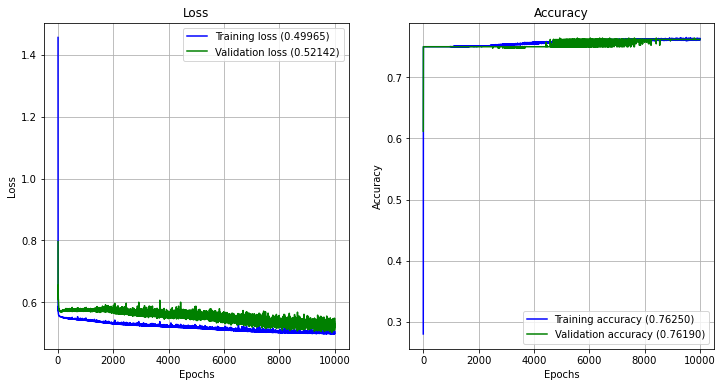

Training time:  811.355s


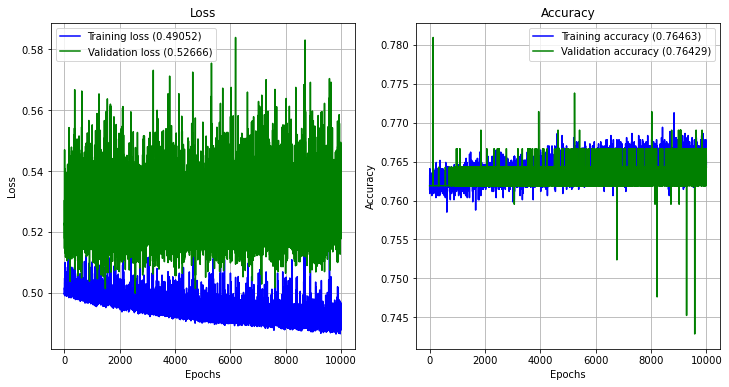

Training time:  1085.584s


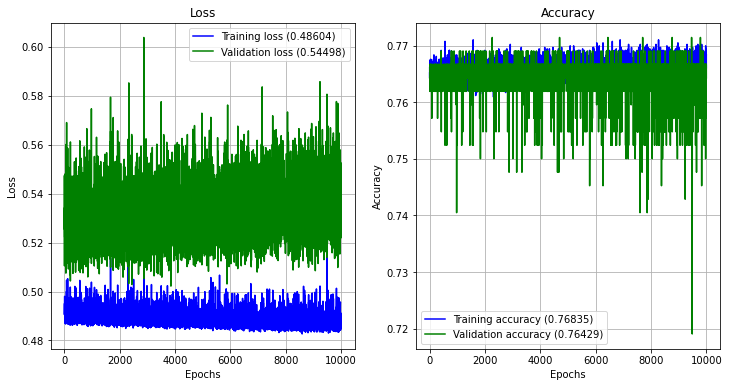

Training time:  1205.499s


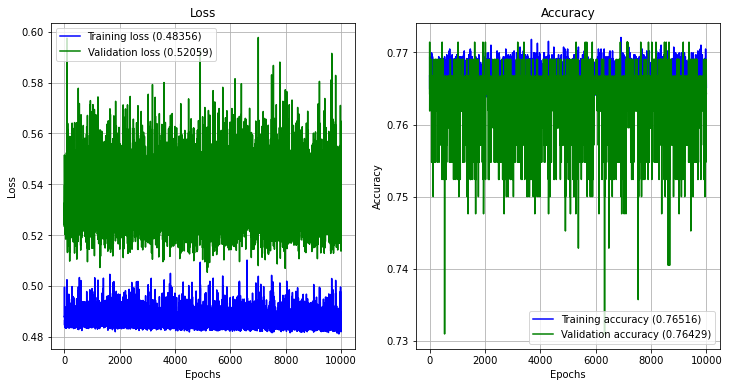

Training time:  1081.059s


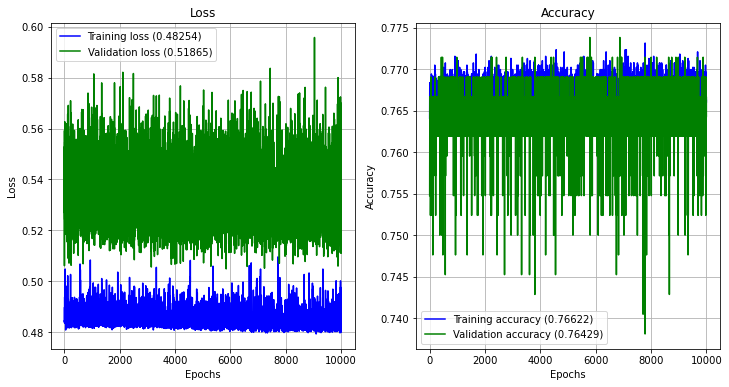

Training time:  612.830s


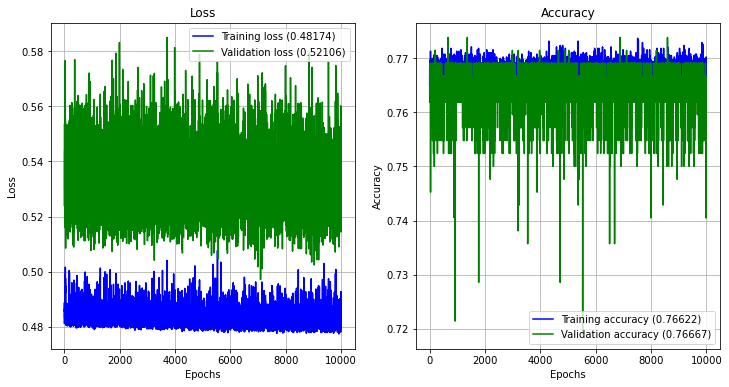

Training time:  477.481s


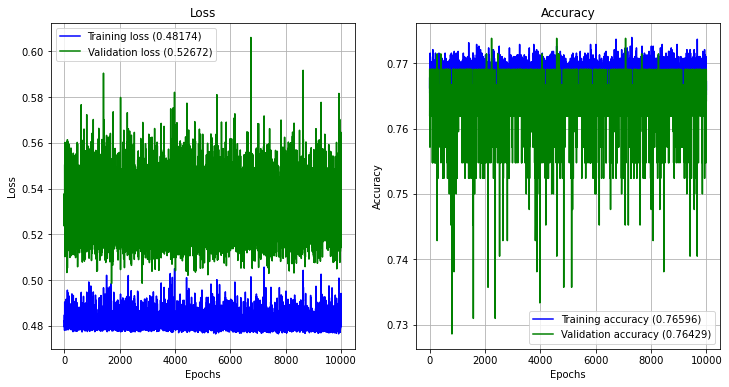

Training time:  756.456s


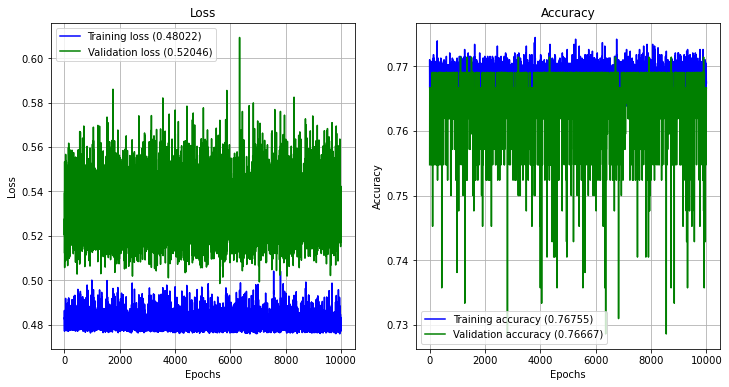

Training time:  783.840s


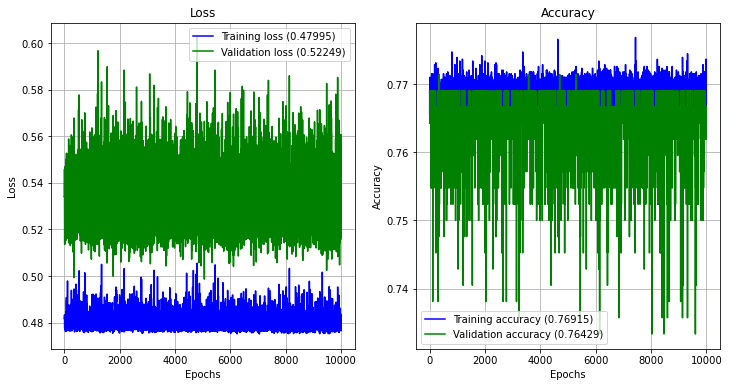

Training time:  771.040s


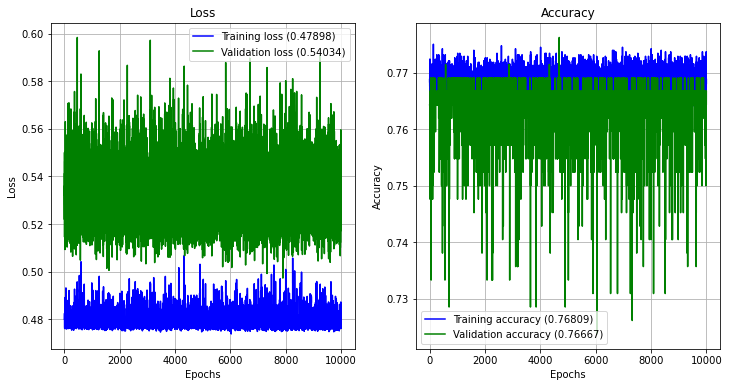

Training time:  787.057s


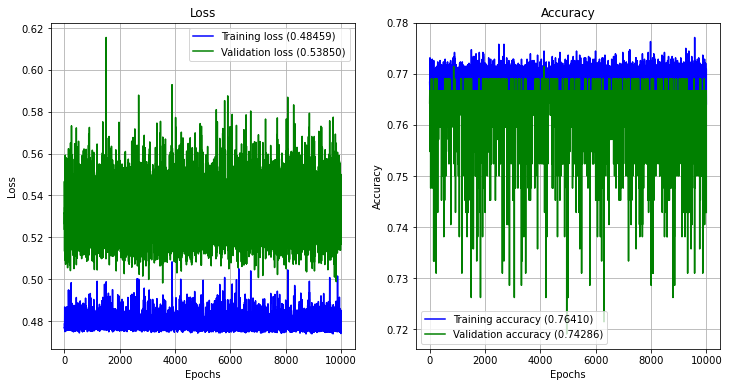

Training time:  966.172s


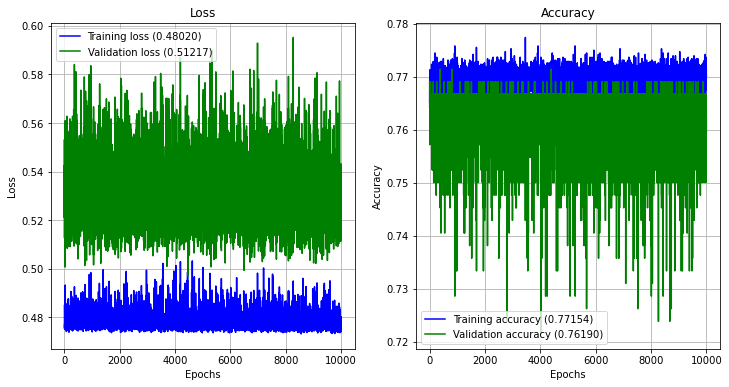

Training time:  967.282s


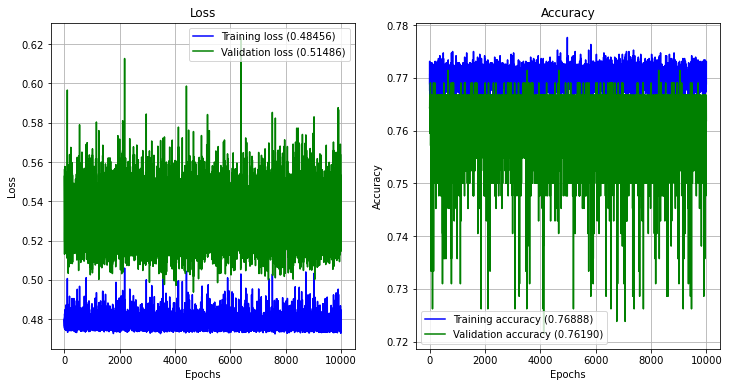

In [ ]:
iteraciones = 1000
epochs = 10000
from keras.callbacks import ModelCheckpoint
for i in range(iteraciones):
    fecha = str(20230110)
    carpeta = 'TemperaturaPrecipitacionRegularizacion-' + fecha + '/Pesos-1-reg-' +str(regularizacion) + '-' + str(i+1)
    checkpoint_name =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-binary_accuracy-{binary_accuracy:.5f}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name2 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-recall-{recall:.5f}.hdf5' 
    checkpoint2 = ModelCheckpoint(checkpoint_name2, monitor='recall', verbose = 0, save_best_only = True, mode ='max')
    checkpoint_name3 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_binary_accuracy-{val_binary_accuracy:.5f}.hdf5' 
    checkpoint3 = ModelCheckpoint(checkpoint_name3, monitor='val_binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name4 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_recall-{val_recall:.5f}.hdf5' 
    checkpoint4 = ModelCheckpoint(checkpoint_name4, monitor='val_recall', verbose = 0, save_best_only = True, mode ='max')
    
    callbacks_list = [ checkpoint, checkpoint2, checkpoint3, checkpoint4]
    
    entrenarModelo(model, dataframeTrain, dataframeTest, 800, epochs, callbacks_list)
    model.save_weights(carpeta+ '/my_weights-' + str((i+1) * epochs) + '.h5')

Parece que no sigue bajando, voy a probar un poco mas y sino lo especializaré mas con una regularizacion menor:

In [8]:
model.load_weights('TemperaturaPrecipitacionRegularizacion-20230110\Pesos-1-reg-0.0001-13/my_weights-130000.h5')

Training time:  529.440s


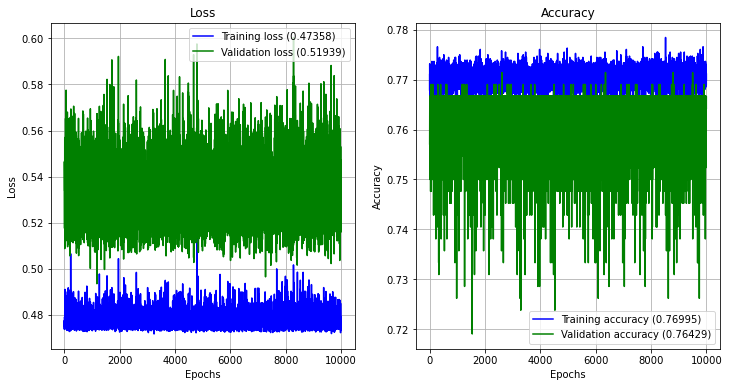

Training time:  524.172s


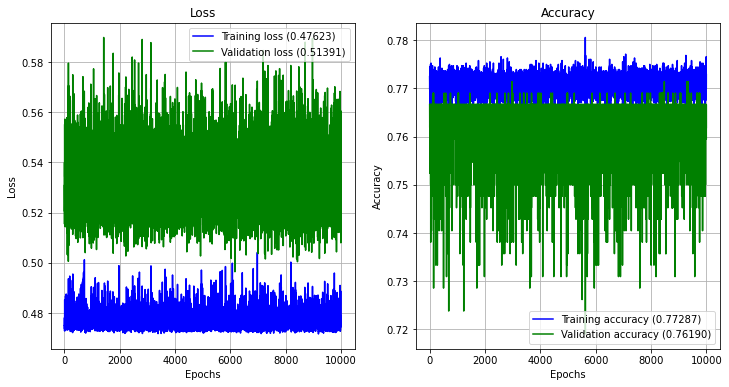

Training time:  534.439s


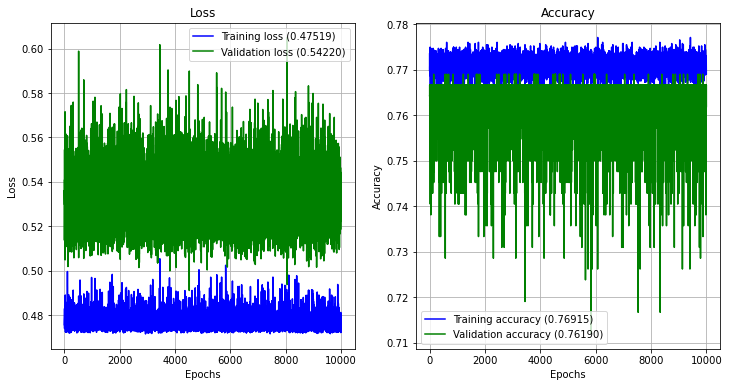

Training time:  533.909s


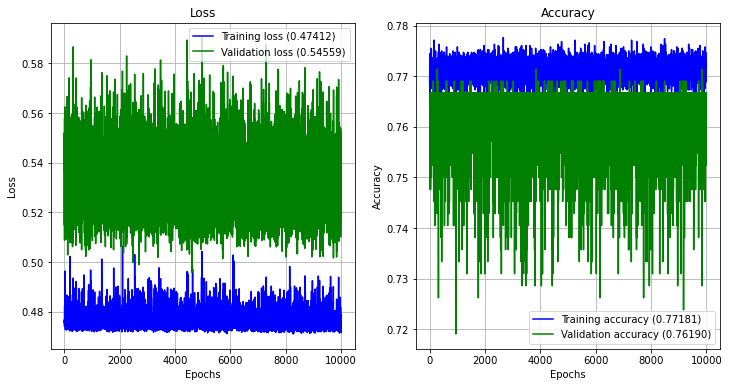

Training time:  568.168s


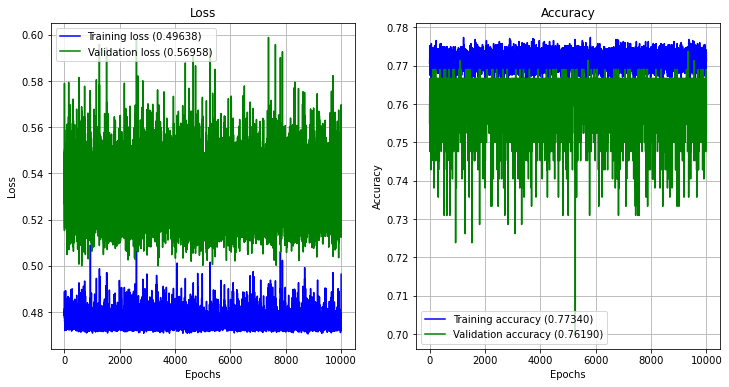

Training time:  544.506s


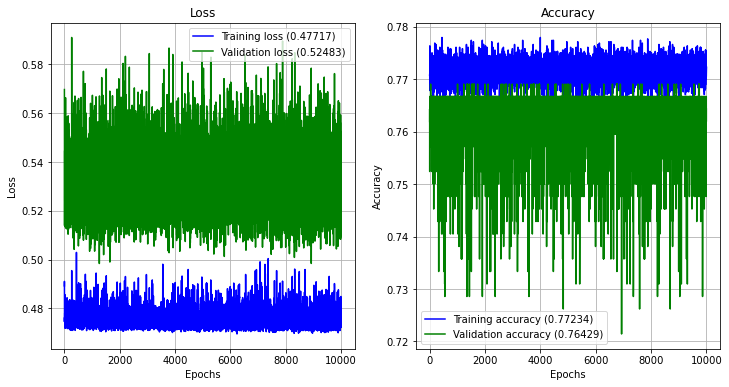

Training time:  598.208s


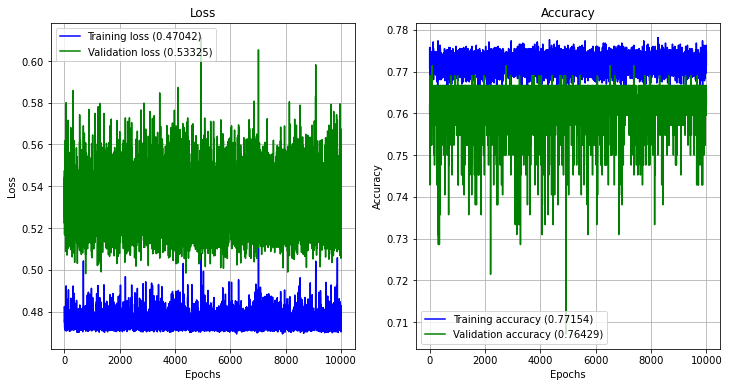

Training time:  523.068s


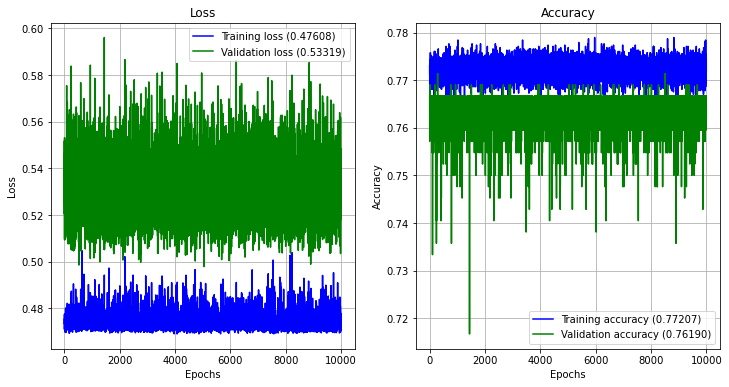

Training time:  497.239s


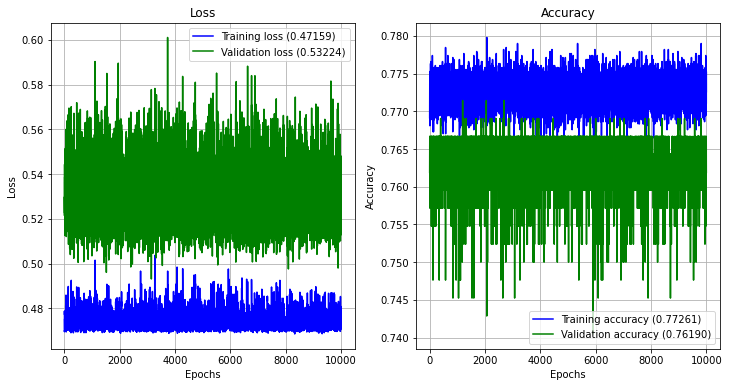

Training time:  507.309s


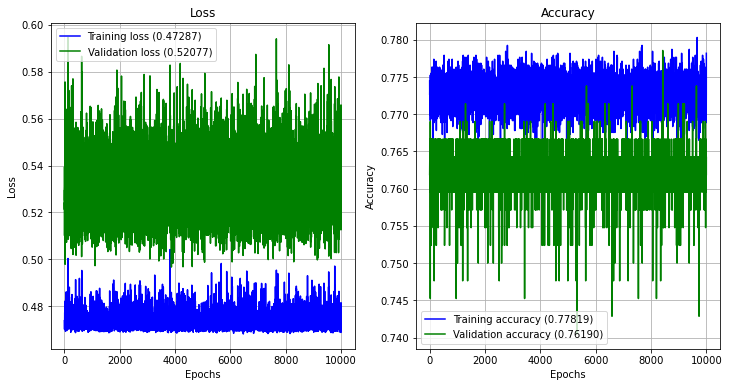

Training time:  548.188s


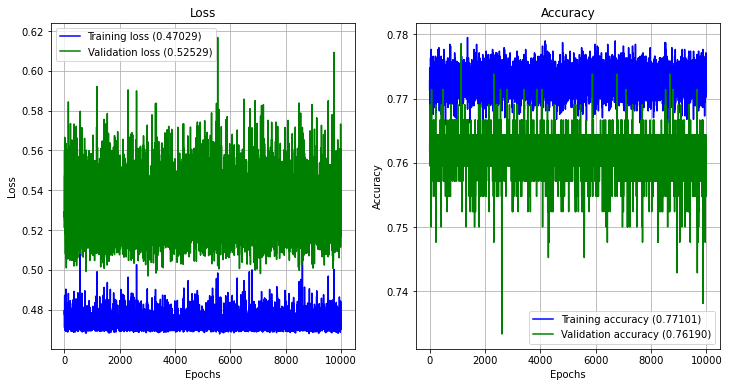

Training time:  653.433s


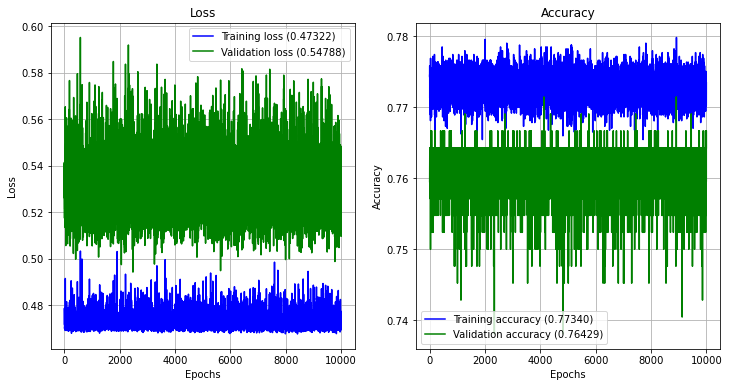

Training time:  1020.370s


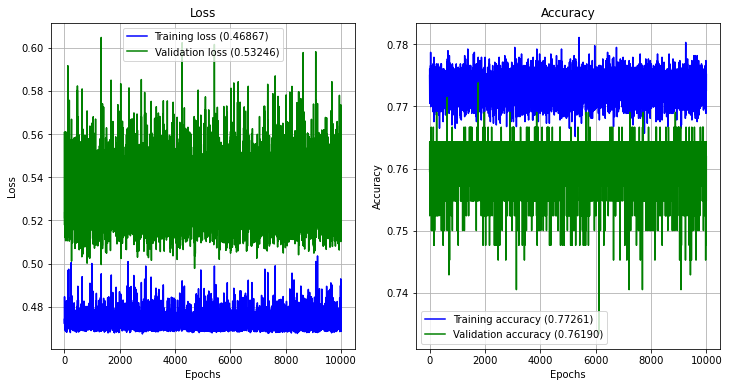

Training time:  1173.571s


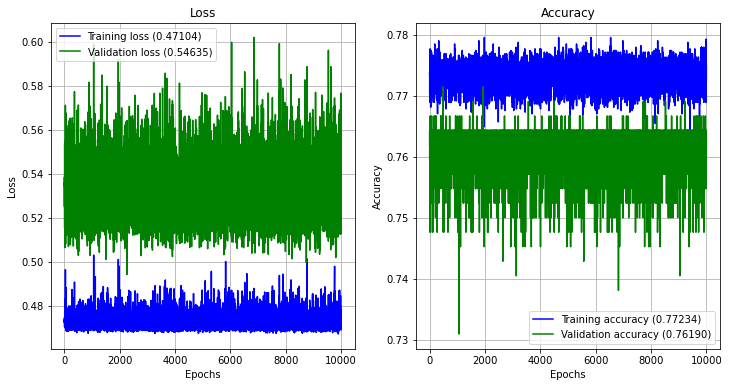

Training time:  982.695s


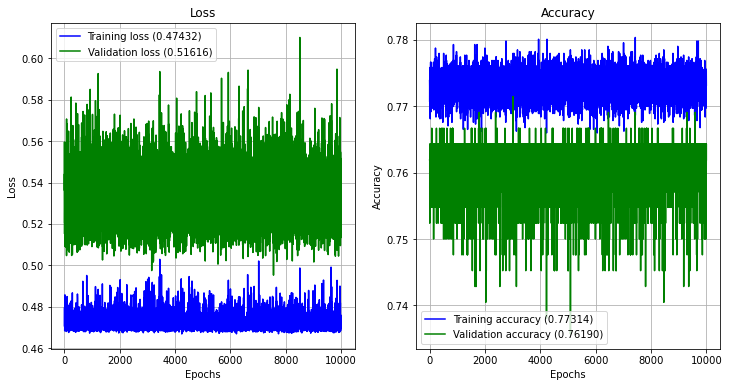

KeyboardInterrupt: 

In [10]:
iteraciones = 1000
epochs = 10000
offset = 15
from keras.callbacks import ModelCheckpoint
for i in range(iteraciones):
    fecha = str(20230110)
    carpeta = 'TemperaturaPrecipitacionRegularizacion-' + fecha + '/Pesos-1-reg-' +str(regularizacion) + '-' + str(i+offset)
    checkpoint_name =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-binary_accuracy-{binary_accuracy:.5f}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name2 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-recall-{recall:.5f}.hdf5' 
    checkpoint2 = ModelCheckpoint(checkpoint_name2, monitor='recall', verbose = 0, save_best_only = True, mode ='max')
    checkpoint_name3 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_binary_accuracy-{val_binary_accuracy:.5f}.hdf5' 
    checkpoint3 = ModelCheckpoint(checkpoint_name3, monitor='val_binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name4 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_recall-{val_recall:.5f}.hdf5' 
    checkpoint4 = ModelCheckpoint(checkpoint_name4, monitor='val_recall', verbose = 0, save_best_only = True, mode ='max')
    
    callbacks_list = [ checkpoint, checkpoint2, checkpoint3, checkpoint4]
    
    entrenarModelo(model, dataframeTrain, dataframeTest, 800, epochs, callbacks_list)
    model.save_weights(carpeta+ '/my_weights-' + str((i+offset) * epochs) + '.h5')

Parece que no mejora mucho, asi que probaré con regularizacion de 0.00001:

In [8]:
regularizacion = 0.00001
model = obtenerModelo20230110(dataframeTrain, regularizacion)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 169)               2366      
                                                                 
 dense_7 (Dense)             (None, 13)                2210      
                                                                 
 dense_8 (Dense)             (None, 1)                 14        
                                                                 
Total params: 4,590
Trainable params: 4,590
Non-trainable params: 0
_________________________________________________________________


Training time:  746.569s


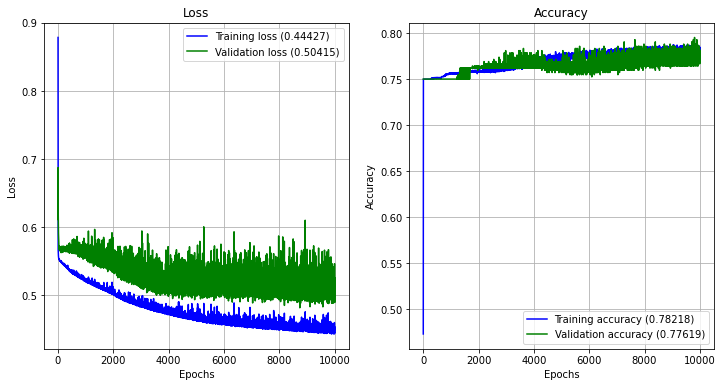

Training time:  677.600s


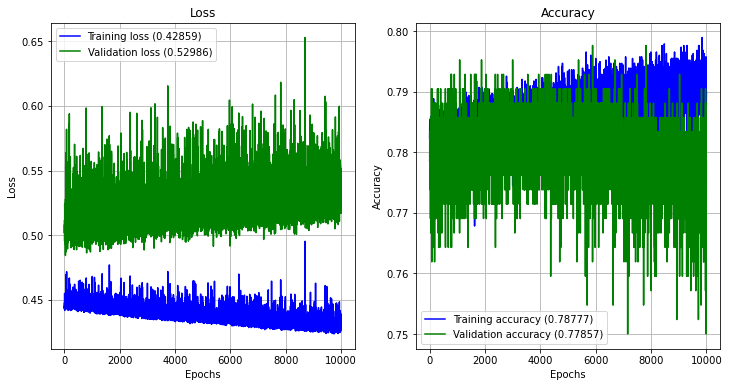

Training time:  675.102s


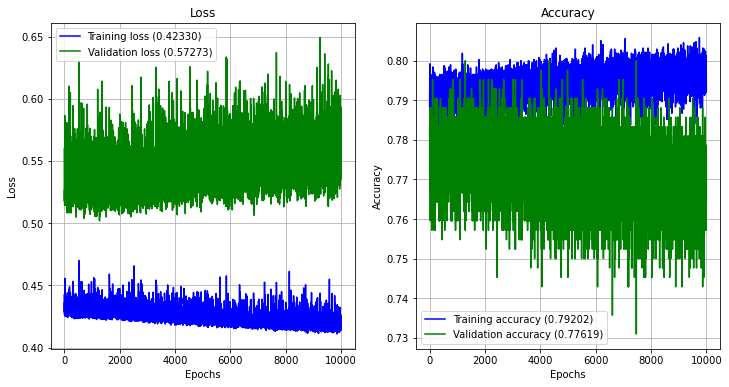

Training time:  686.970s


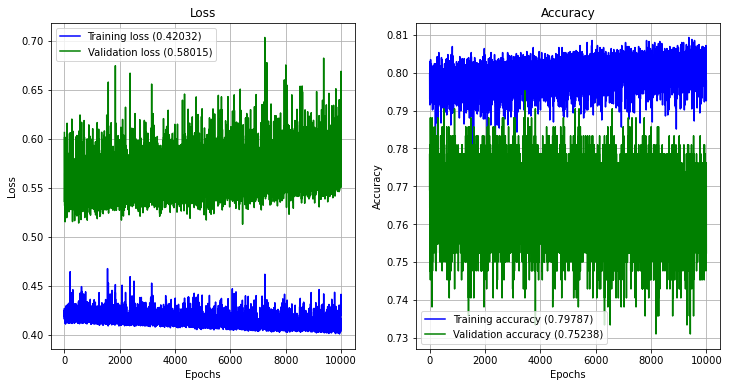

Training time:  708.067s


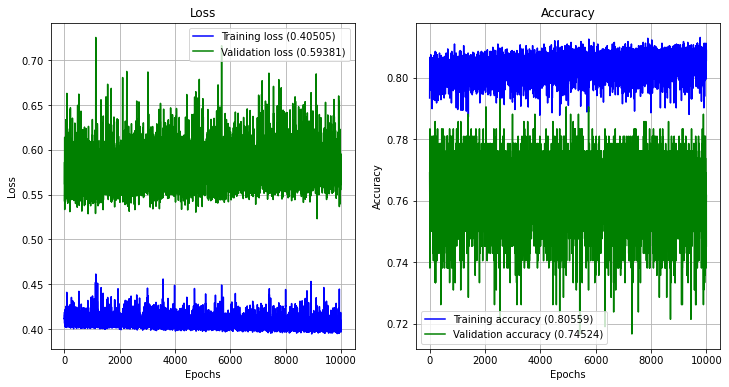

Training time:  681.203s


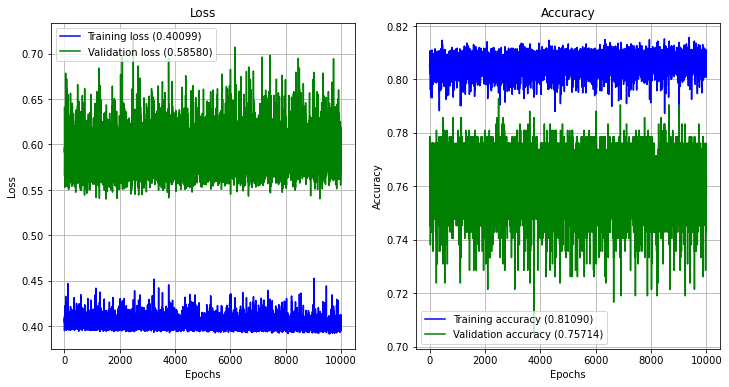

Training time:  713.527s


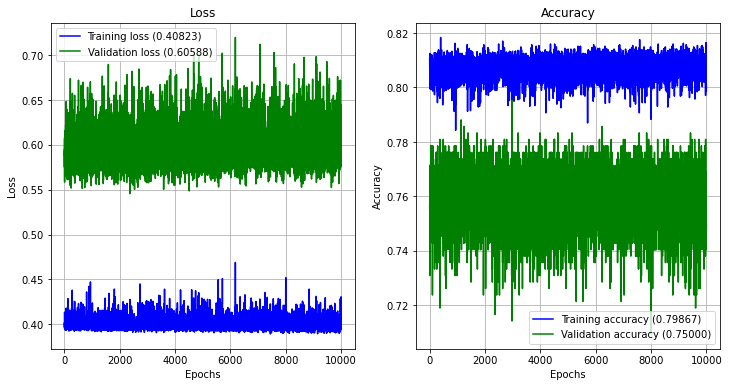

Training time:  758.441s


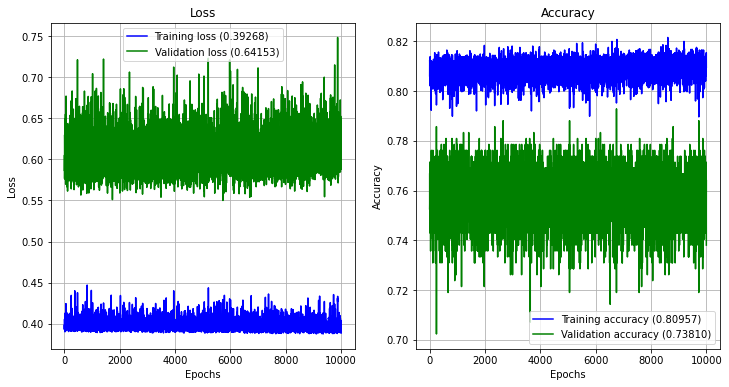

Training time:  799.137s


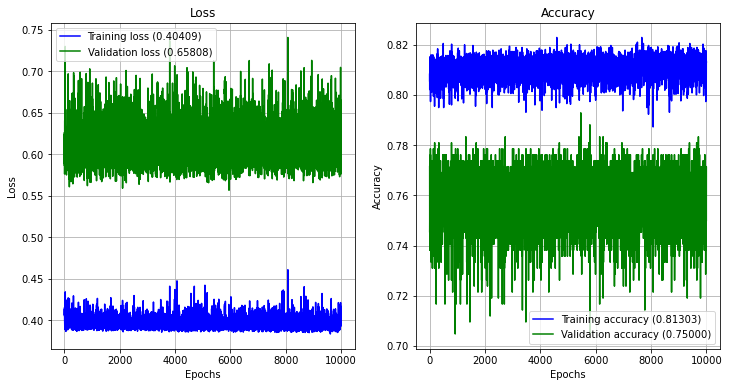

Training time:  802.805s


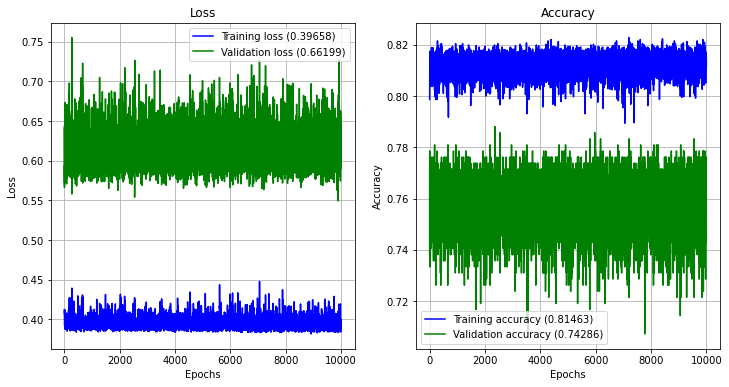

Training time:  702.383s


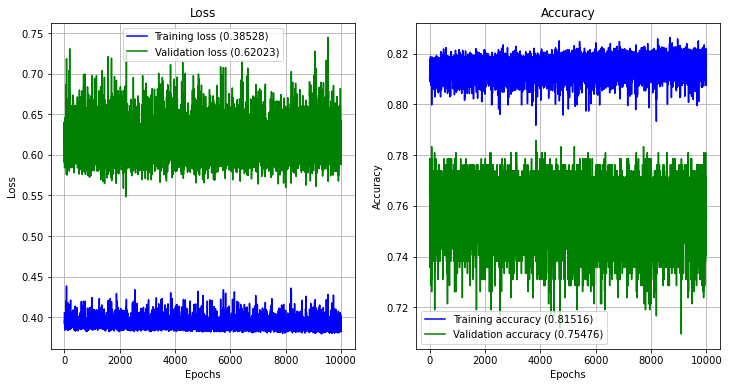

Training time:  708.308s


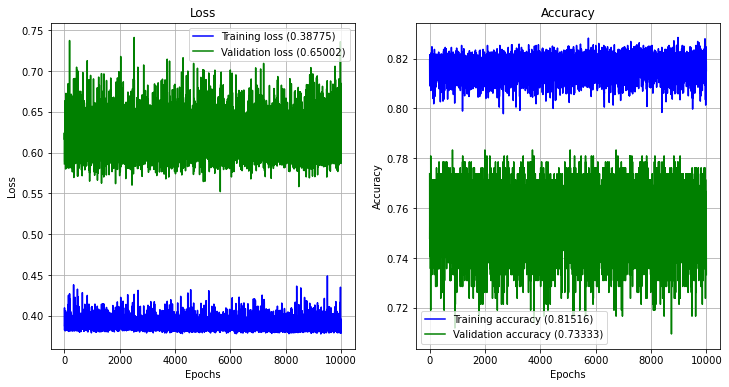

Training time:  777.848s


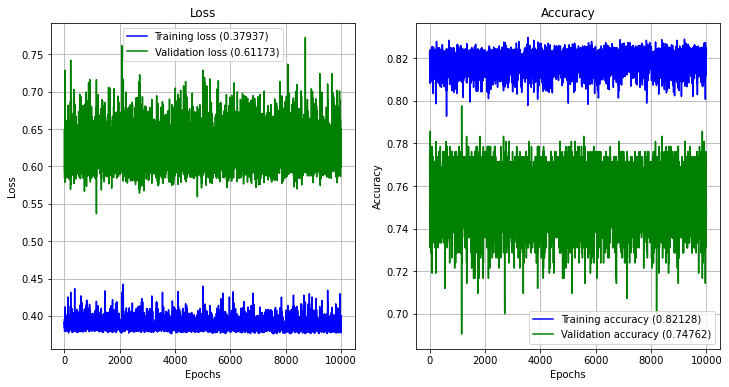

Training time:  823.490s


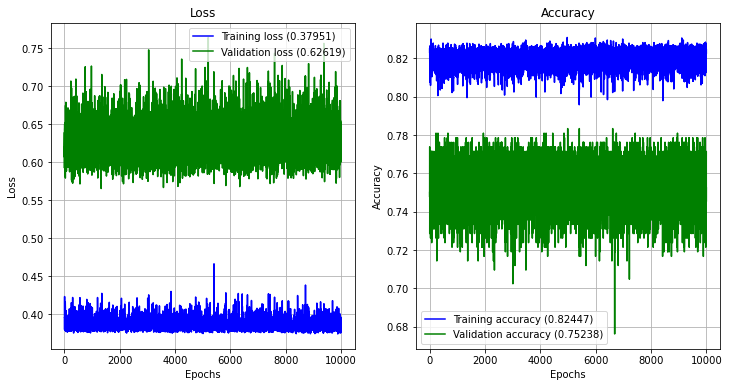

Training time:  764.744s


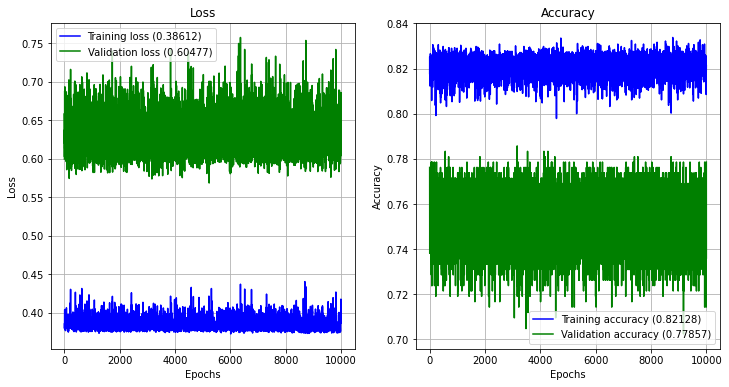

Training time:  837.902s


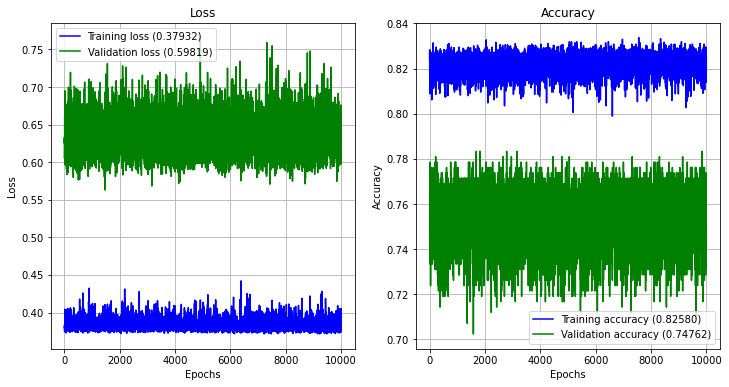

Training time:  1028.724s


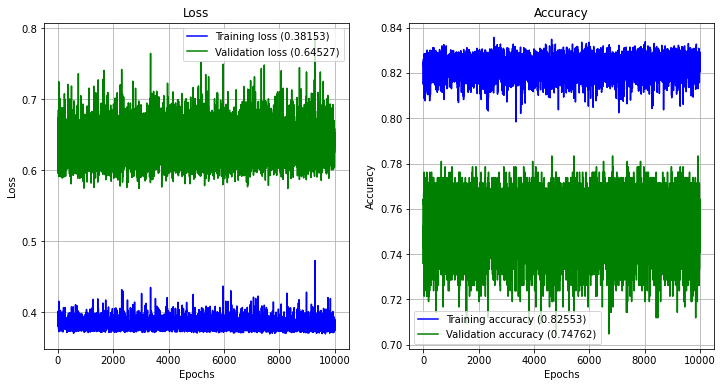

Training time:  1224.991s


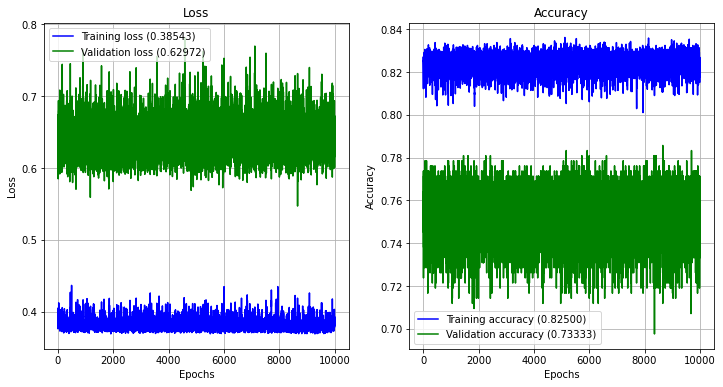

Training time:  982.377s


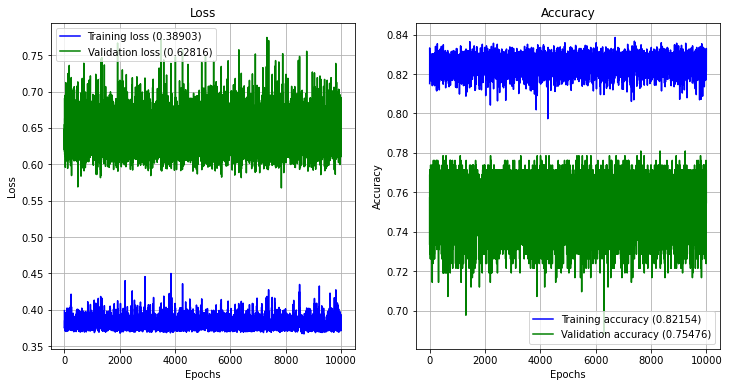

Training time:  1007.478s


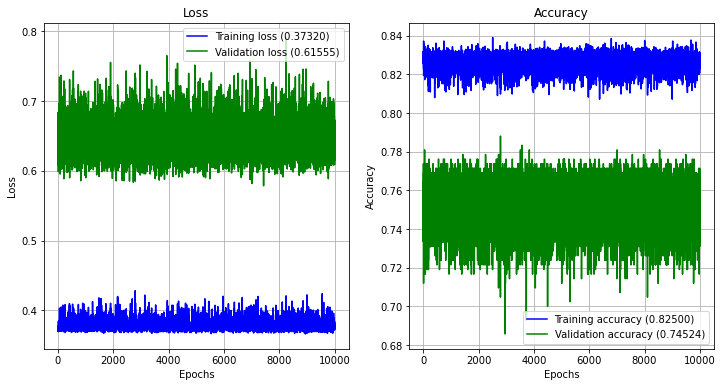

Training time:  703.327s


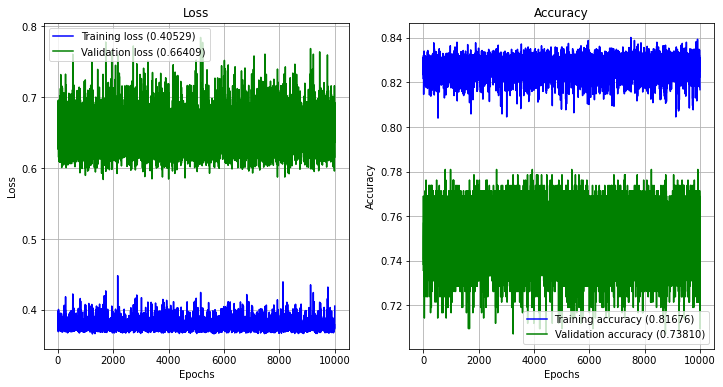

Training time:  550.327s


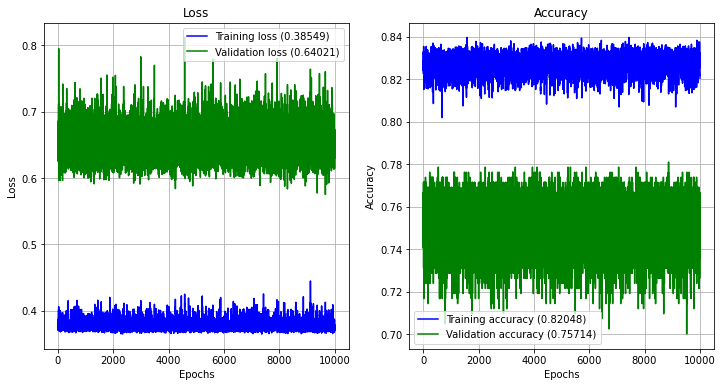

Training time:  660.955s


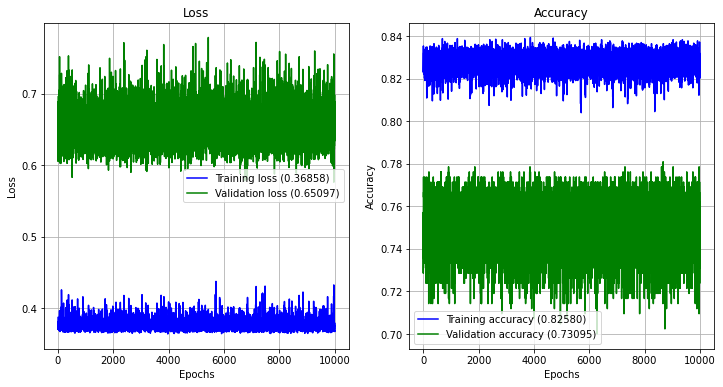

Training time:  836.835s


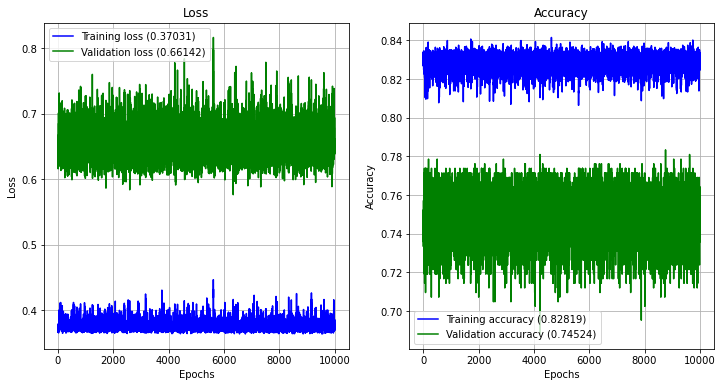

Training time:  777.099s


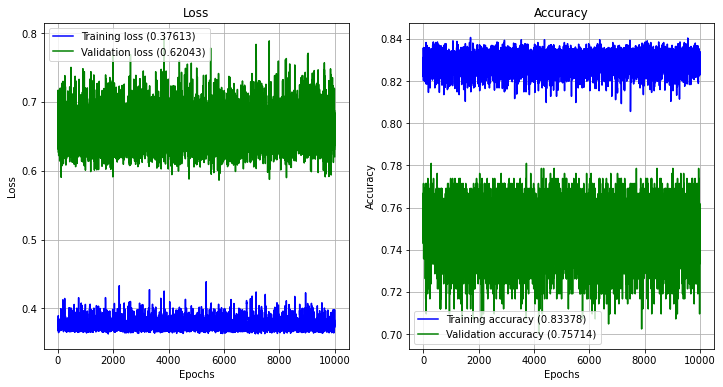

Training time:  695.488s


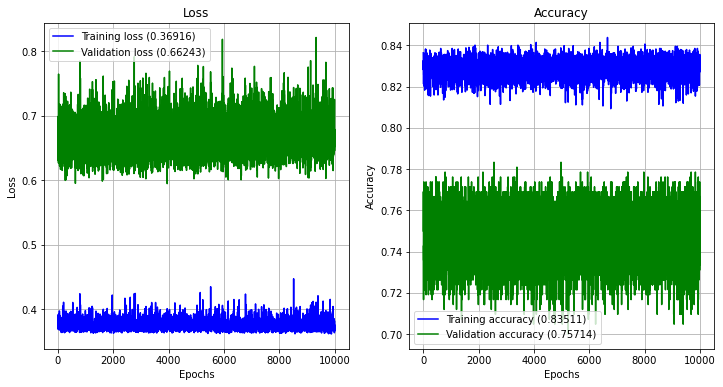

KeyboardInterrupt: 

In [9]:
iteraciones = 1000
epochs = 10000
from keras.callbacks import ModelCheckpoint
for i in range(iteraciones):
    fecha = str(20230110)
    carpeta = 'TemperaturaPrecipitacionRegularizacion-' + fecha + '/Pesos-1-reg-' +str(regularizacion) + '-' + str(i+1)
    checkpoint_name =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-binary_accuracy-{binary_accuracy:.5f}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name2 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-recall-{recall:.5f}.hdf5' 
    checkpoint2 = ModelCheckpoint(checkpoint_name2, monitor='recall', verbose = 0, save_best_only = True, mode ='max')
    checkpoint_name3 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_binary_accuracy-{val_binary_accuracy:.5f}.hdf5' 
    checkpoint3 = ModelCheckpoint(checkpoint_name3, monitor='val_binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name4 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_recall-{val_recall:.5f}.hdf5' 
    checkpoint4 = ModelCheckpoint(checkpoint_name4, monitor='val_recall', verbose = 0, save_best_only = True, mode ='max')
    
    callbacks_list = [ checkpoint, checkpoint2, checkpoint3, checkpoint4]
    
    entrenarModelo(model, dataframeTrain, dataframeTest, 800, epochs, callbacks_list)
    model.save_weights(carpeta+ '/my_weights-' + str((i+1) * epochs) + '.h5')

In [10]:
obtenerMejorModelo()

Mejor binary_accuracy:  0.84388
TemperaturaPrecipitacionRegularizacion-20230110\Pesos-1-reg-1e-05-26\Pesos-20230110-6658-binary_accuracy-0.84388.hdf5
Mejor val_binary_accuracy:  0.8
TemperaturaPrecipitacionRegularizacion-20230110\Pesos-1-reg-1e-05-3\Pesos-20230110-1289-val_binary_accuracy-0.80000.hdf5
Mejor recall:  0.98404
TemperaturaPrecipitacionRegularizacion-20230110\Pesos-1-reg-0.0001-1\Pesos-20230110-001-recall-0.98404.hdf5
Mejor val_recall:  0.93333
TemperaturaPrecipitacionRegularizacion-20230110\Pesos-1-reg-0.0001-1\Pesos-20230110-001-val_recall-0.93333.hdf5


In [8]:
regularizacion = 0.00001
model = obtenerModelo20230110(dataframeTrain, regularizacion)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 169)               2366      
                                                                 
 dense_1 (Dense)             (None, 13)                2210      
                                                                 
 dense_2 (Dense)             (None, 1)                 14        
                                                                 
Total params: 4,590
Trainable params: 4,590
Non-trainable params: 0
_________________________________________________________________


14/14 [==============================] - 0s 1ms/step
Accuracy test:   80.00%
Confusion matrix, without normalization


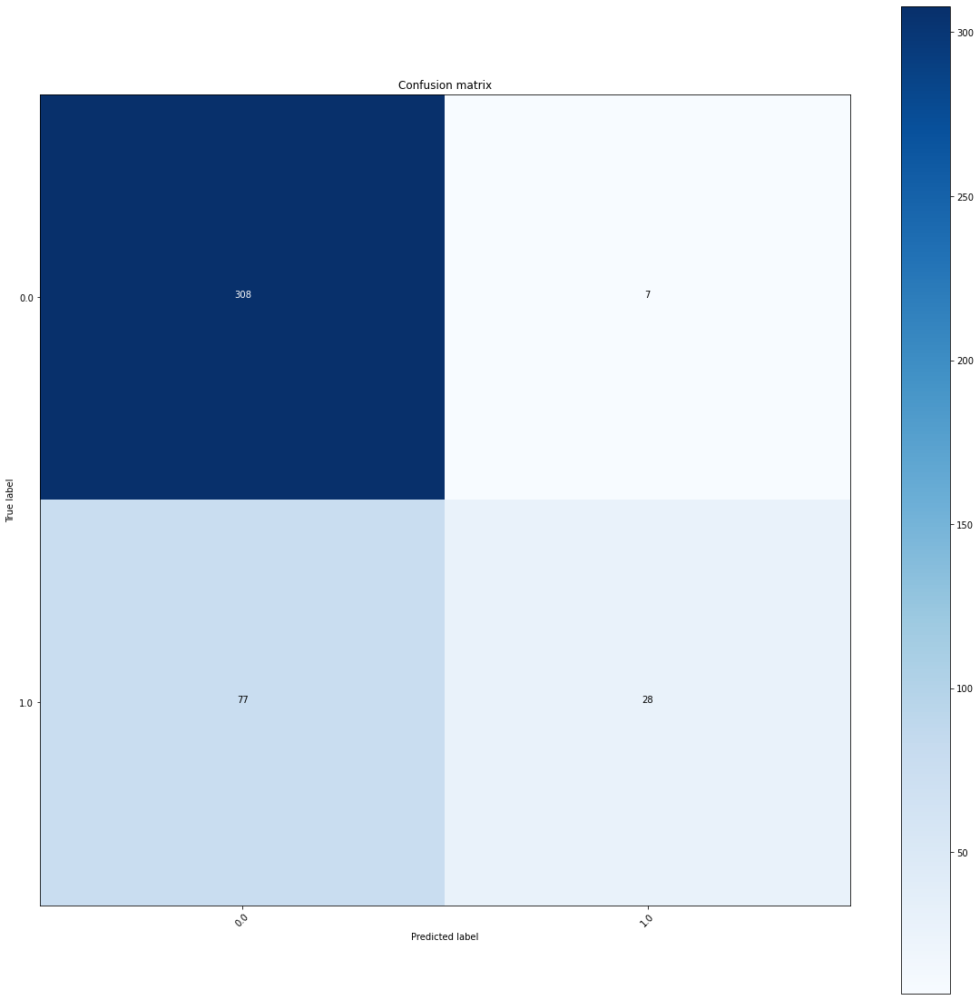

In [9]:
predecirYMostrarMatrizConfusion(dataframeTest,model,
                                "TemperaturaPrecipitacionRegularizacion-20230110\Pesos-1-reg-1e-05-3\Pesos-20230110-1289-val_binary_accuracy-0.80000.hdf5", 0.6)

In [10]:
parcelasAObservar = parcelasConAciertos(dataframeTest, model, 0.6)
dataframeAux = dataframeTest
dataframeDias = dataframeTest.loc[dataframeTest["recogido"] == 1]

hay  21  parcelas a observar
------------------
22_27_0_1_503_5019_1 dias que deberia dar 1 la prediccion:
30    302
31    303
32    304
33    305
34    306
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
22_27_0_1_503_5560_8 dias que deberia dar 1 la prediccion:
50    302
51    303
52    304
53    305
54    306
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
dia:  303
ha acertado por lo menos un 1 de los que deberia
------------------
50_108_0_0_11_75 dias que deberia dar 1 la prediccion:
110    317
111    318
112    319
113    320
114    321
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
50_108_0_0_2_176 dias que deberia dar 1 la prediccion:
190    317
191    318
192    319
193    320
194    321
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
dia:  313
------------------
50_108_0_0_2_250 dias que deberia dar 1 la prediccion:
210    317
211    318
212    319
213    320
214    321
Name: dia, dtype: int64

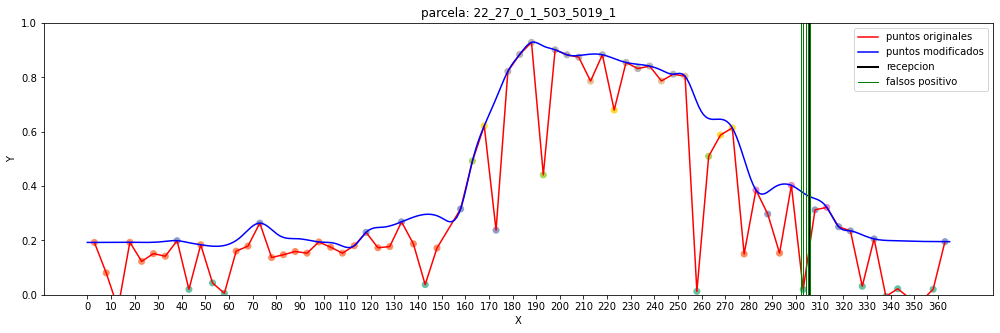

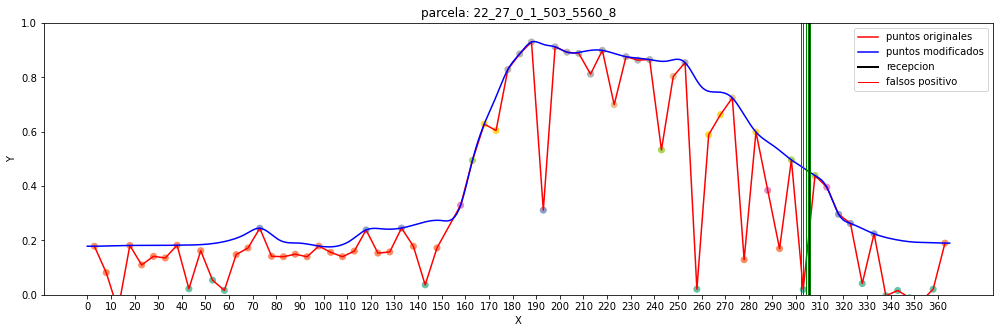

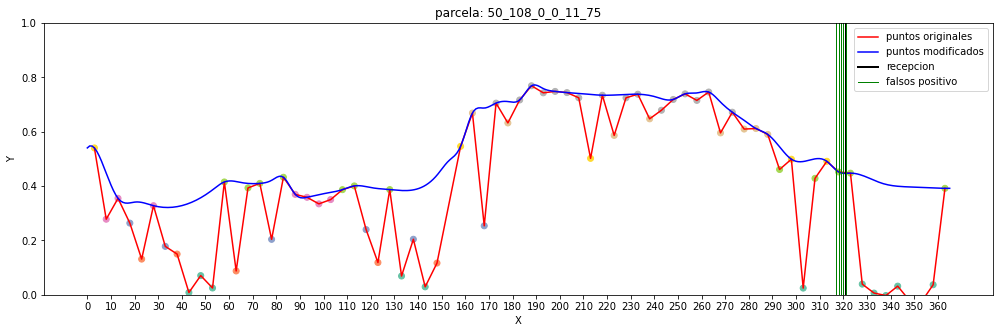

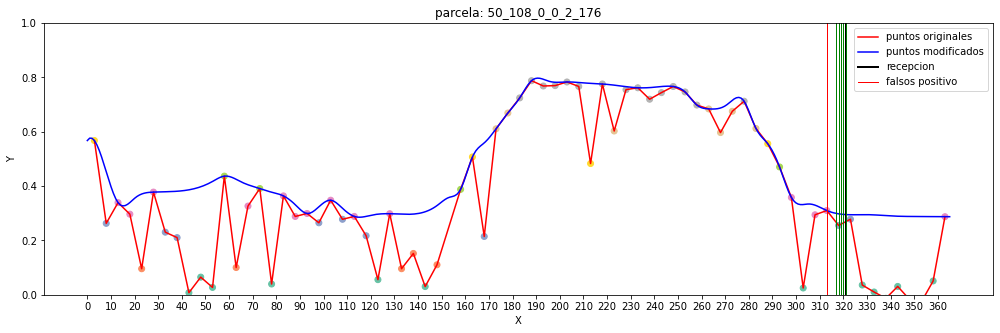

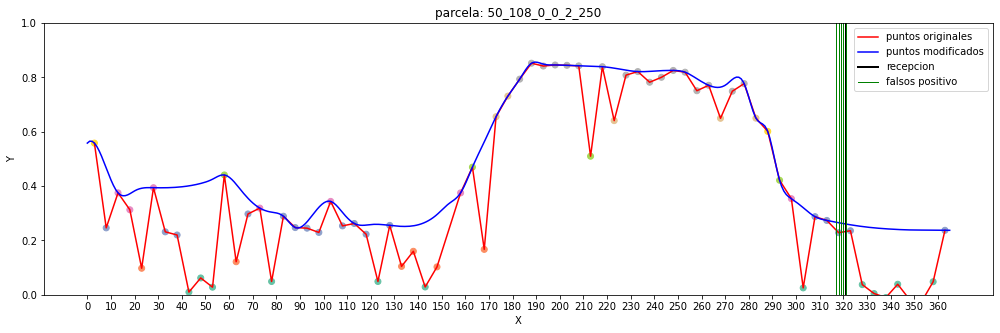

...

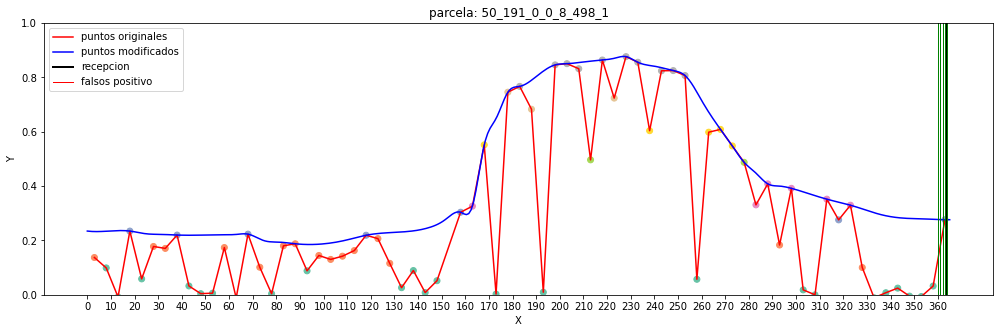

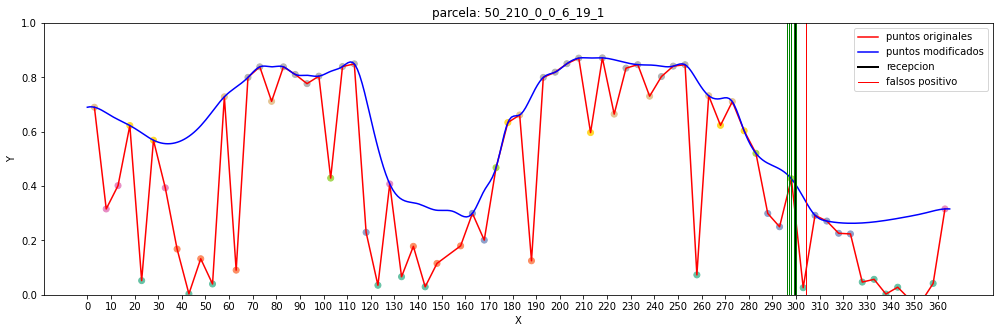

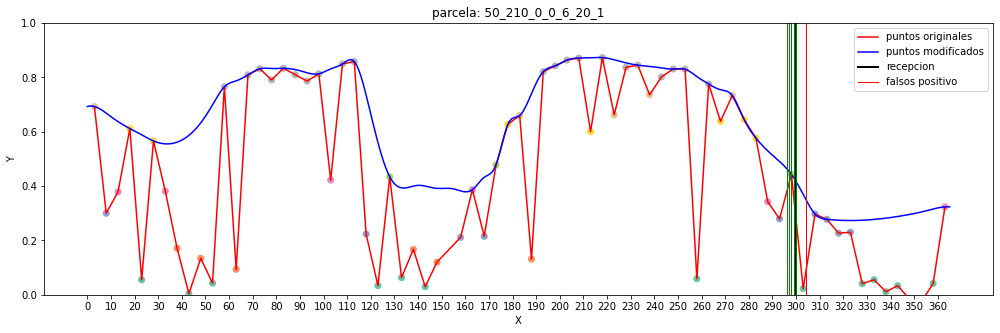

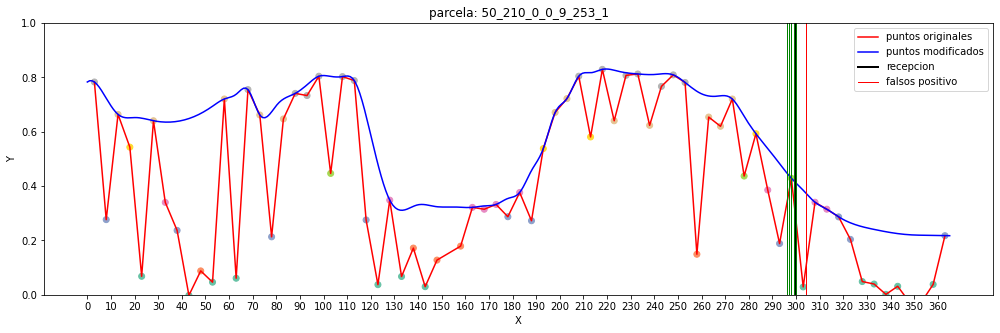

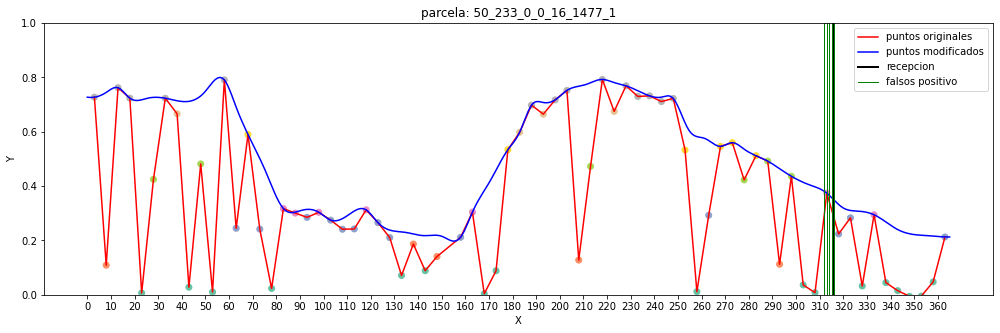

In [27]:
mostrarParcelasSinAciertos()

dia de recepcion:  306
true positives:  [303]


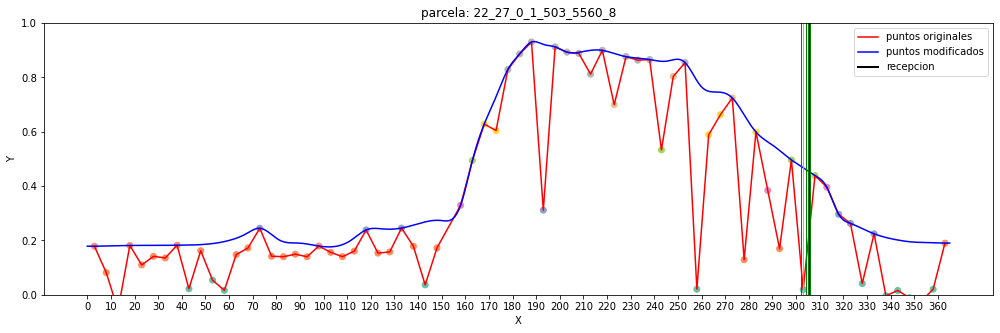

dia de recepcion:  321
true positives:  [318]


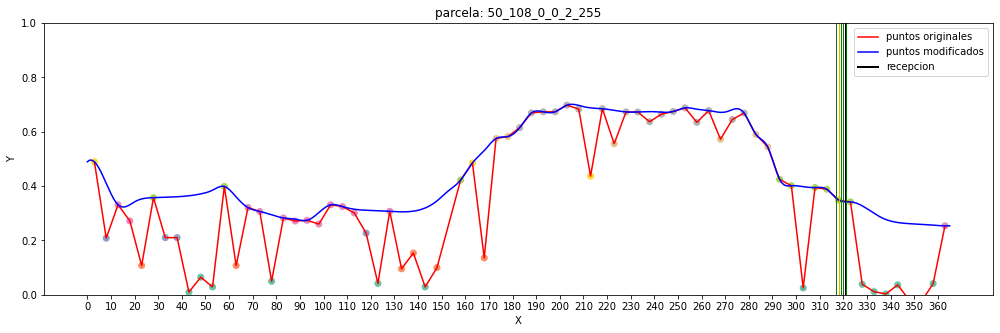

dia de recepcion:  321
true positives:  [319]


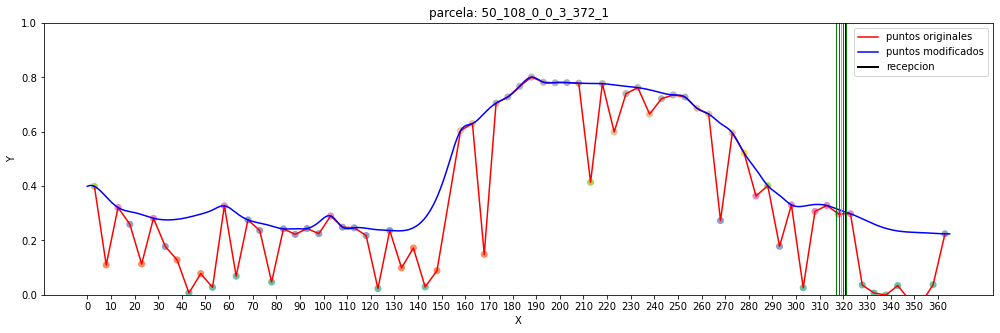

dia de recepcion:  321
true positives:  [319]


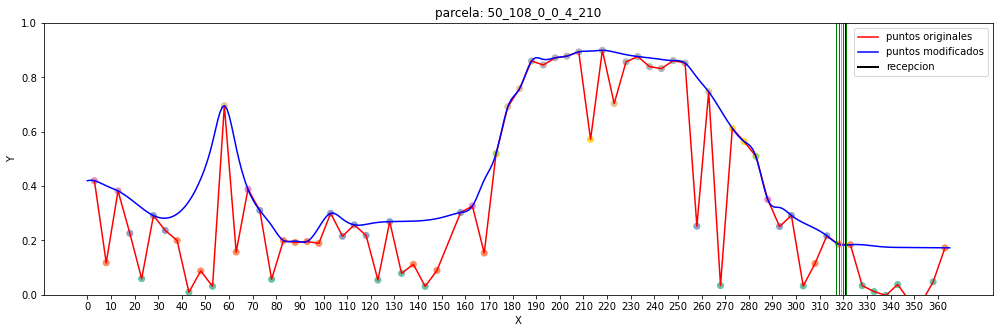

dia de recepcion:  295
true positives:  [292, 293, 295]


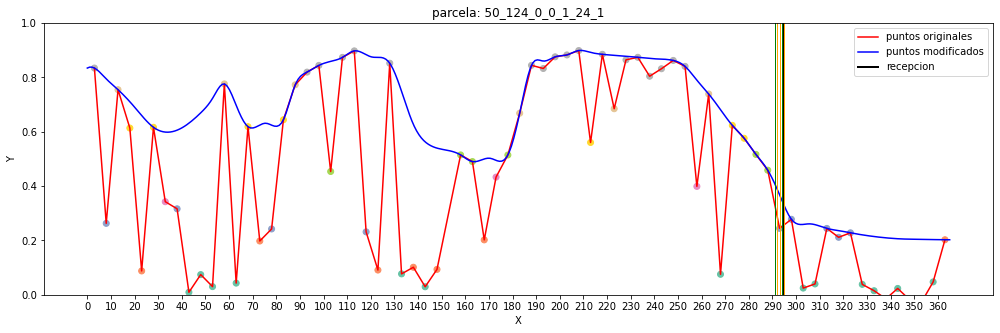

dia de recepcion:  295
true positives:  [293, 294, 295]


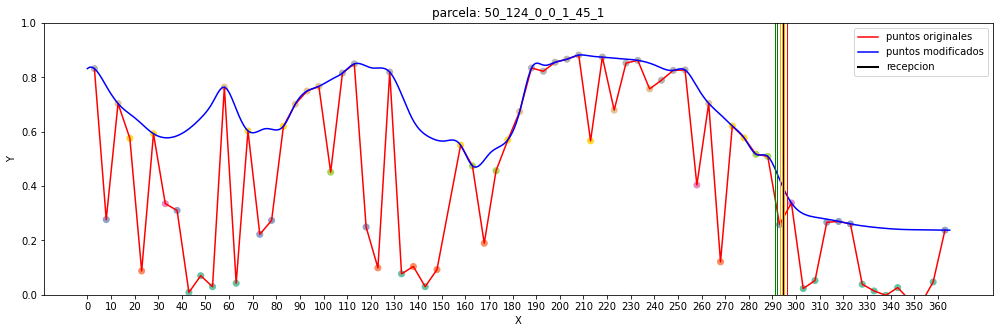

dia de recepcion:  295
true positives:  [293, 294, 295]


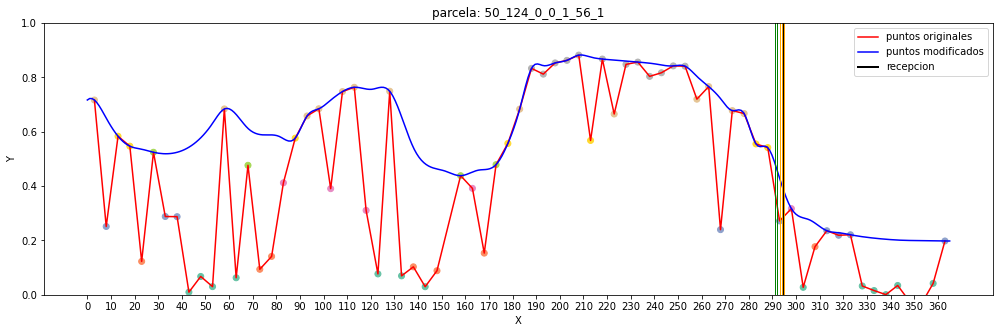

dia de recepcion:  295
true positives:  [294]


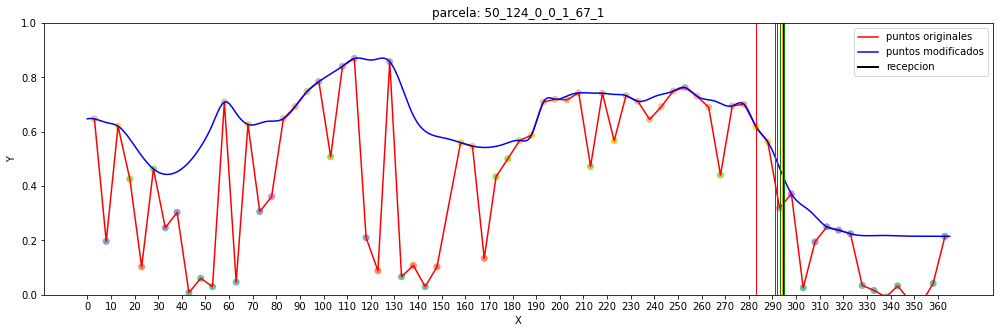

dia de recepcion:  364
true positives:  [361, 362, 363]


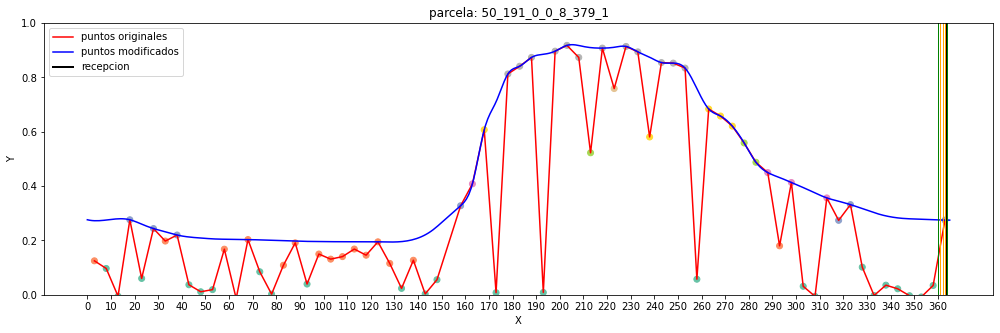

dia de recepcion:  364
true positives:  [361, 362, 363]


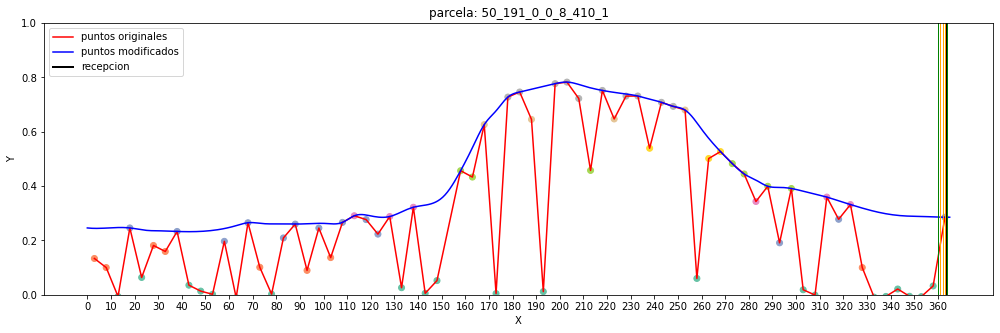

dia de recepcion:  364
true positives:  [361, 362]


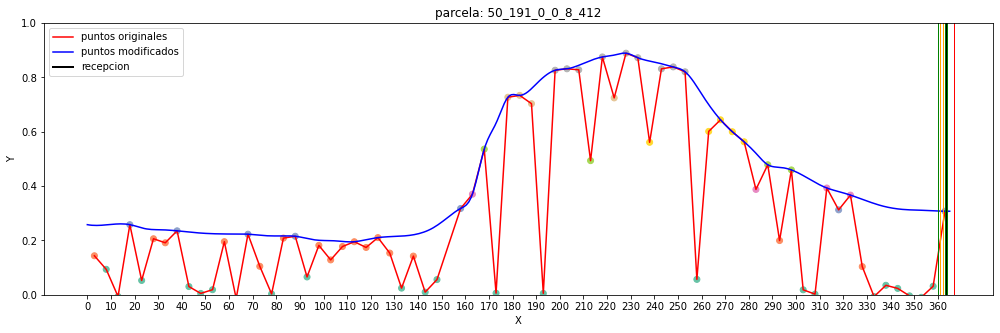

dia de recepcion:  364
true positives:  [361, 362, 363]


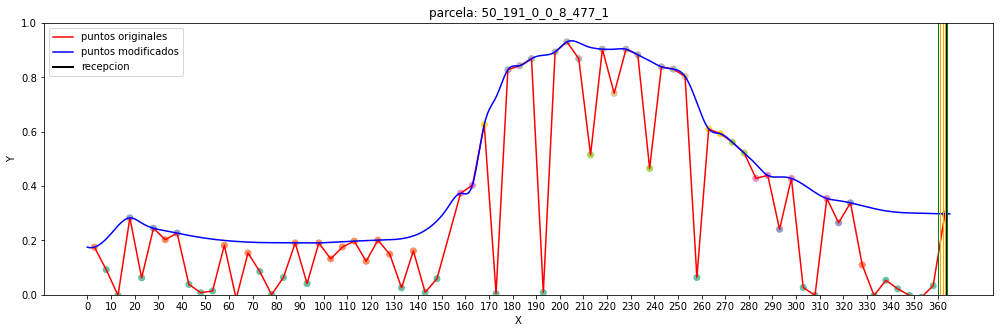

dia de recepcion:  364
true positives:  [361, 362, 363]


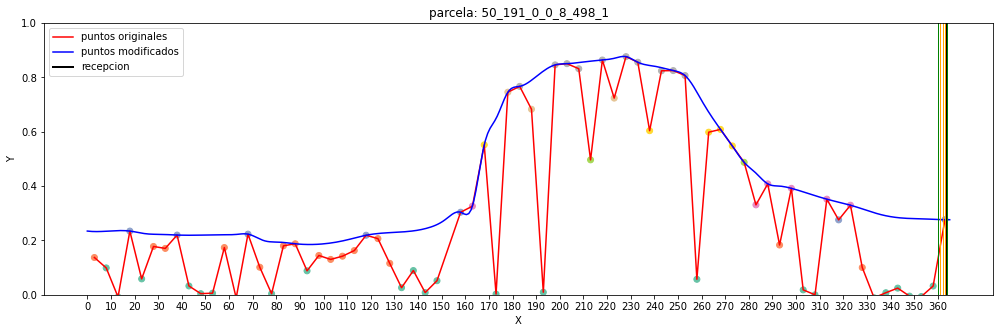

In [28]:
mostrarParcelasConAciertos()

Los resultados son mejorables pero hay algo que no es como antes; ahora no se ven parcelas en las que predice todos los dias como recoger. Ahora los dias que hay que recoger igual falla como mucho 1

In [13]:
def funcionExito(ypred, dia, diaRecogida):
    import math
    if  abs(dia - diaRecogida) == 0:
        return ypred
    else: 
        return ypred / (1 + math.log(1 + abs(dia - diaRecogida),10))


def exito(dataframeTest, funcionExito):
    promedio = 0
    maxexito = 0
    minexito = 9999
    for parcela in dataframeTest['parcela'].unique():
        maximo = 0
        X = dataframeTest.loc[dataframeTest['parcela'] == parcela].drop(columns=['parcela','dia','recogido'])
        X=np.asarray(X).astype(np.float)
        #print(dataframeTest.loc[dataframeTest['parcela'] == "22_27_0_1_503_5019_1"])
        ypred = model.predict(X)
        dias = dataframeTest.loc[dataframeTest['parcela'] == parcela]['dia']
        diaRecogida = dataframeTest.loc[dataframeTest['parcela'] == parcela].iloc[14]['dia']

        #print("--------")
        #print(dias.iloc[1])
        #print(res[0])
        for i in range(len(ypred)):
            #print("--------")
            #print(ypred[i])
            valorExito = funcionExito(ypred[i], dias.iloc[i], diaRecogida)
            
            if valorExito > maximo:
                maximo = valorExito
                print(parcela, ypred[i], maximo, dias.iloc[i] - diaRecogida)

        print(maximo)
        promedio = promedio + maximo
        if maximo < minexito:
            minexito = maximo
        if maximo > maxexito:
            maxexito = maximo
        
    return [minexito, maxexito, promedio/len(dataframeTest['parcela'].unique())]
            

In [12]:
[mini,maxi,promedi] = exito(dataframeTest, funcionExito)

1/1 [==============================] - 0s 16ms/step
22_27_0_1_503_5019_1 [0.14314237] [0.06577958] -14
22_27_0_1_503_5019_1 [0.29647502] [0.14024739] -12
22_27_0_1_503_5019_1 [0.31291133] [0.15049739] -11
22_27_0_1_503_5019_1 [0.28671363] [0.16124254] -5
22_27_0_1_503_5019_1 [0.36048347] [0.22501247] -3
22_27_0_1_503_5019_1 [0.47018316] [0.361393] -1
22_27_0_1_503_5019_1 [0.4686696] [0.4686696] 0
[0.4686696]
1/1 [==============================] - 0s 16ms/step
22_27_0_1_503_5560_8 [0.18510166] [0.08506154] -14
22_27_0_1_503_5560_8 [0.22344963] [0.10411757] -13
22_27_0_1_503_5560_8 [0.2440556] [0.1154504] -12
22_27_0_1_503_5560_8 [0.30175757] [0.15441154] -8
22_27_0_1_503_5560_8 [0.6522991] [0.40716273] -3
[0.40716273]
1/1 [==============================] - 0s 16ms/step
50_108_0_0_11_75 [0.00146582] [0.0006736] -14
50_108_0_0_11_75 [0.03486286] [0.01624454] -13
50_108_0_0_11_75 [0.2828463] [0.13380033] -12
50_108_0_0_11_75 [0.31779912] [0.15284821] -11
50_108_0_0_11_75 [0.32425758] [0.15

In [13]:
print(mini, maxi, promedi)

[0.2520518] [0.7176252] [0.50837374]


Los valores del promedio siguen el sentido esperado ya que:<br>
TPRSN -> 18 / 21 -> Mayor promedio<br>
TPSN -> 17 / 21 -> Segundo mayor promedio<br>
TP -> 14 / 21 -> Tercer mejor promedio<br>
TPR -> 13 / 21 -> Peor promedio

-------------------------------------------------------------------------------------------------------------------------

Aqui vuelvo a hacer el entrenamiento pero con todos los datos:

In [4]:
import pandas as pd
import numpy as np
        
df = pd.read_csv('datosEntrenables20230131-full.csv')
parcelasAQuitar = df.loc[df['estacion'] == 'not inialized']['parcela'].unique()
df = df[~df['parcela'].isin(parcelasAQuitar)]
df = df.drop(columns=['Unnamed: 0','precSum3','estacion'])
df = quitarDatosMalos(df )
df = anyadirRelacionesParametros(df, ['parcela','dia','recogido','tmed','prec'])
anyadirUnos(df)
[dataframeTrain, dataframeTest] = separarTrainTest(df)

Entrenamos con los siguientes datos:

In [5]:
dataframeTrain

,pendiente dia -15,pendiente dia -10,pendiente dia -5,ndvi,col 1 * col 2,col 1 * col 3,col 1 * col 4,col 2 * col 3,col 2 * col 4,col 3 * col 4,parcela,dia,recogido,tmed,prec,unos
0,0.013078,0.008582,-0.002236,0.456587,0.000112,-0.000029,0.005971,-0.000019,0.003919,-0.001021,22_27_0_1_503_5017_1,292,0,17.4,0.0,1
1,0.011039,0.005081,-0.006042,0.467762,0.000056,-0.000067,0.005164,-0.000031,0.002377,-0.002826,22_27_0_1_503_5017_1,293,0,18.0,0.0,1
2,0.008906,0.001723,-0.008617,0.478748,0.000015,-0.000077,0.004264,-0.000015,0.000825,-0.004126,22_27_0_1_503_5017_1,294,0,17.6,0.0,1
3,0.006757,-0.001304,-0.009899,0.488632,-0.000009,-0.000067,0.003301,0.000013,-0.000637,-0.004837,22_27_0_1_503_5017_1,295,0,15.5,0.0,1
4,0.004652,-0.003832,-0.010032,0.496736,-0.000018,-0.000047,0.002311,0.000038,-0.001903,-0.004983,22_27_0_1_503_5017_1,296,0,13.7,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8155,0.005049,0.004059,0.004025,0.414865,0.000020,0.000020,0.002094,0.000016,0.001684,0.001670,50_224_0_2_18_50_1,289,0,16.8,0.0,1
8156,0.005029,0.004006,0.004614,0.409131,0.000020,0.000023,0.002057,0.000018,0.001639,0.001888,50_224_0_2_18_50_1,290,0,16.4,0.0,1
8157,0.004980,0.004131,0.005174,0.402966,0.000021,0.000026,0.002007,0.000021,0.001665,0.002085,50_224_0_2_18_50_1,291,0,17.8,0.2,1
8158,0.004917,0.004413,0.005670,0.396435,0.000022,0.000028,0.001949,0.000025,0.001750,0.002248,50_224_0_2_18_50_1,292,0,18.8,0.0,1


In [6]:
regularizacion = 0.00001
model = obtenerModelo20230110(dataframeTrain, regularizacion)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 169)               2366      
                                                                 
 dense_1 (Dense)             (None, 13)                2210      
                                                                 
 dense_2 (Dense)             (None, 1)                 14        
                                                                 
Total params: 4,590
Trainable params: 4,590
Non-trainable params: 0
_________________________________________________________________


Training time:  1070.264s


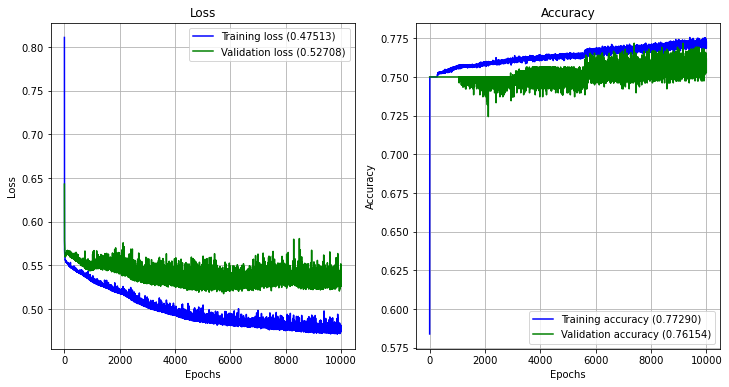

Training time:  968.768s


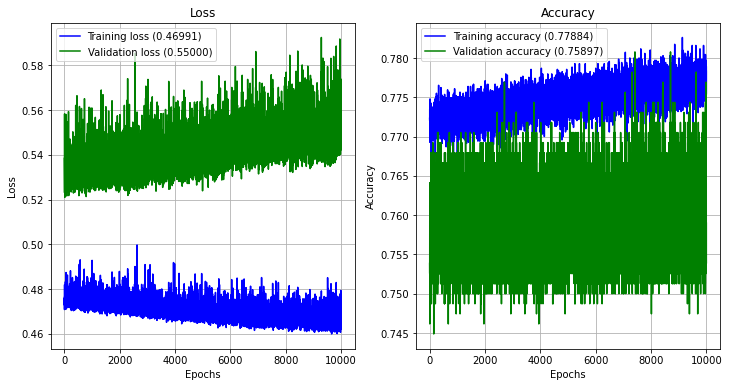

Training time:  1136.804s


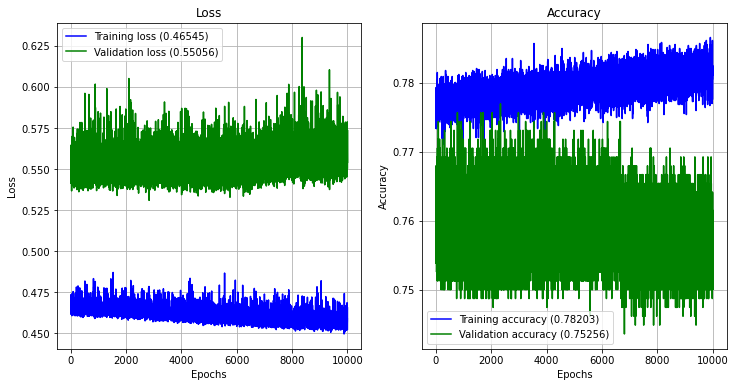

Training time:  907.393s


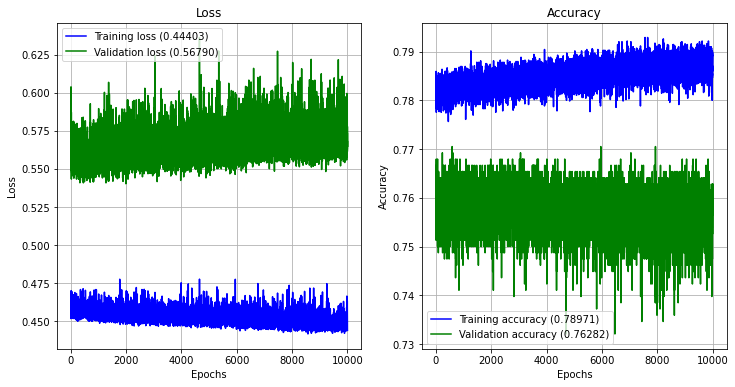

Training time:  865.614s


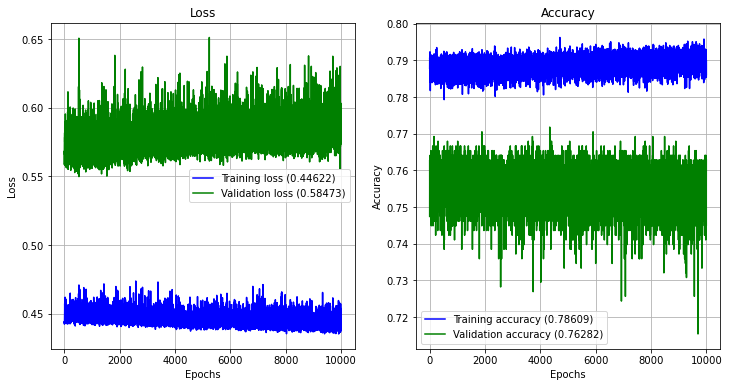

Training time:  803.132s


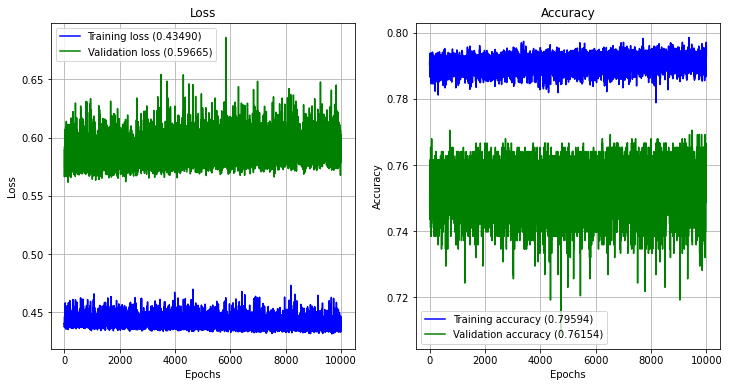

Training time:  752.129s


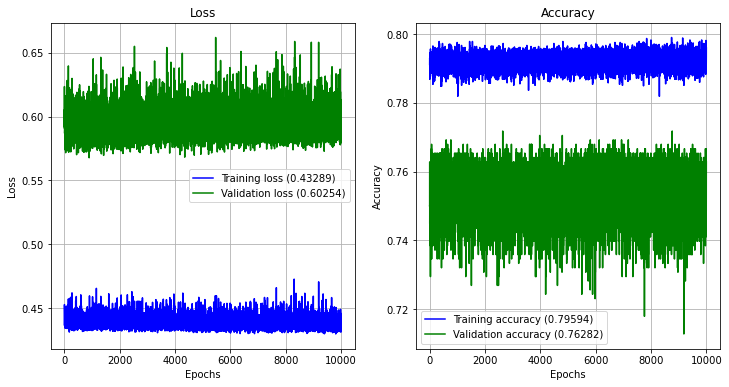

Training time:  747.429s


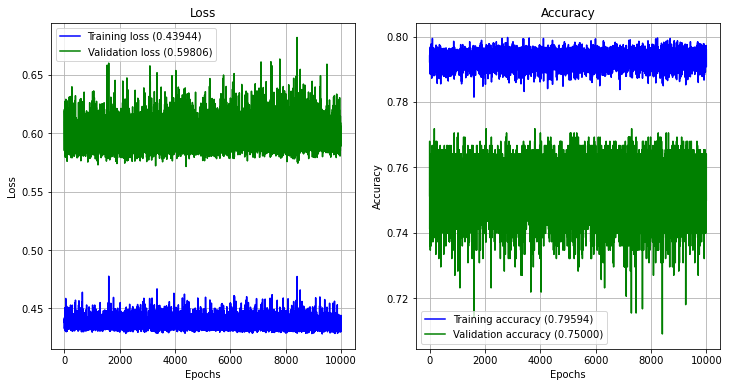

Training time:  757.638s


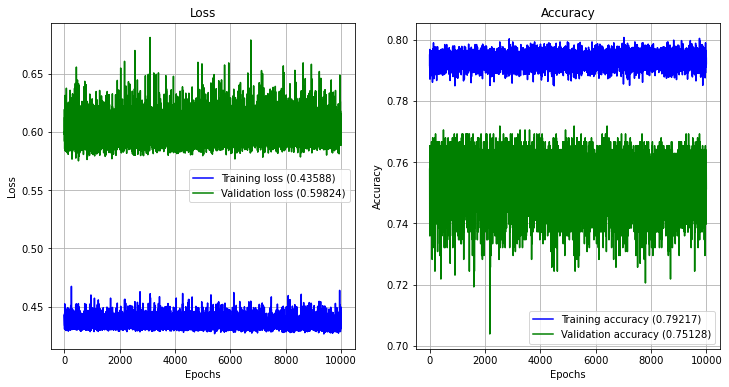

Training time:  888.239s


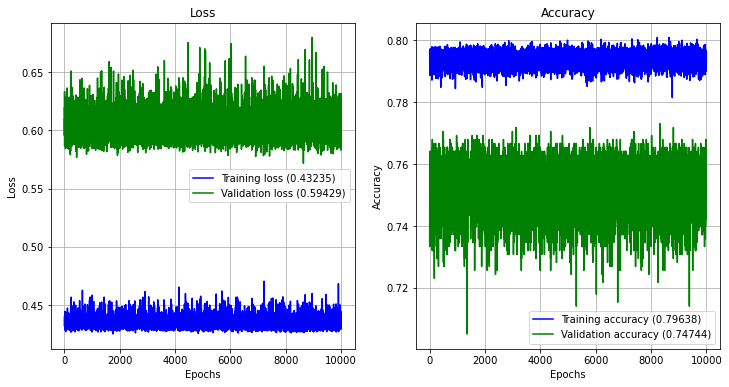

Training time:  757.044s


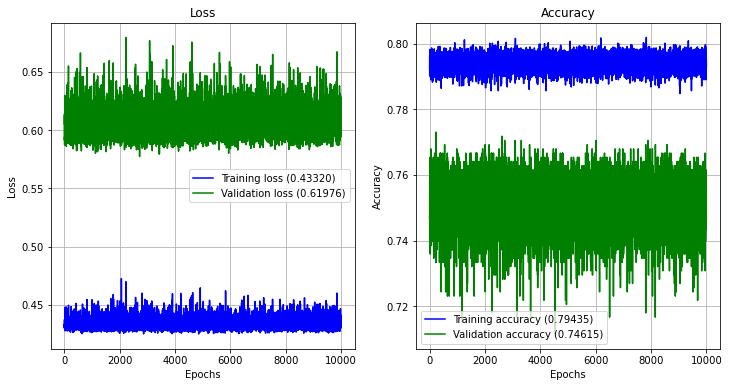

Training time:  750.774s


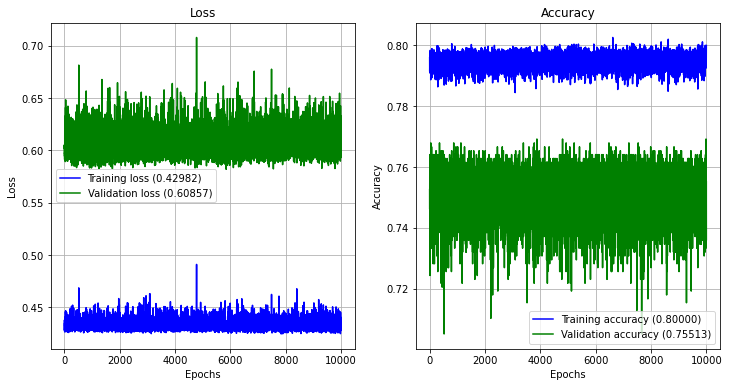

Training time:  849.600s


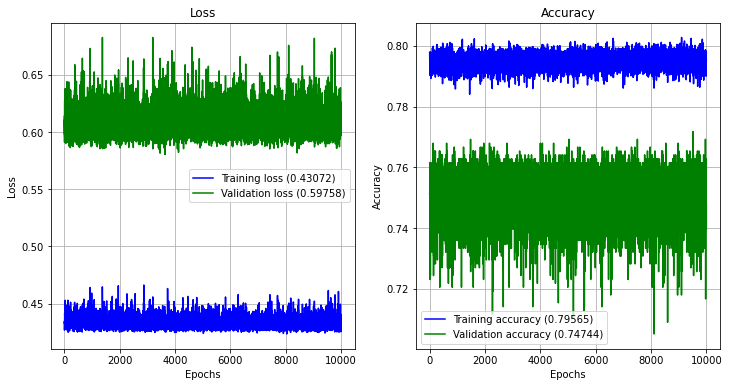

Training time:  904.789s


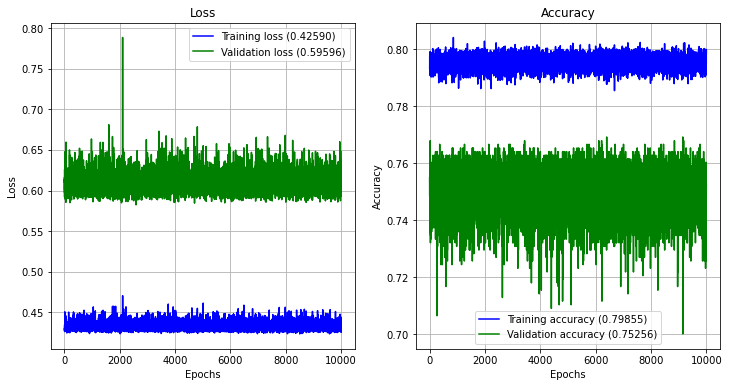

Training time:  943.659s


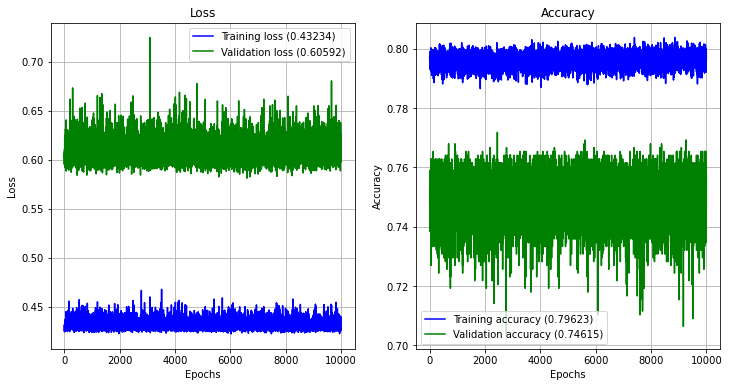

Training time:  863.405s


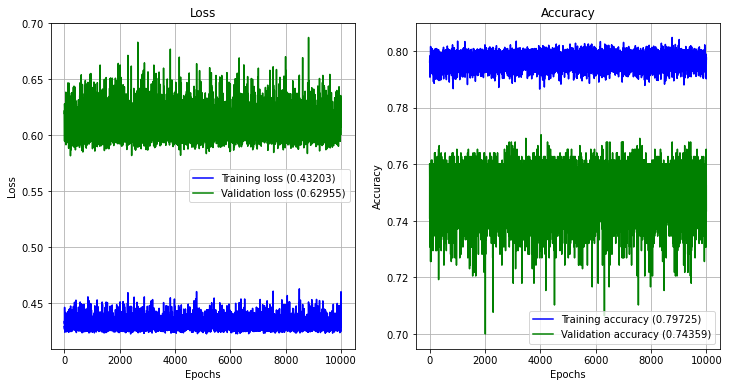

Training time:  791.715s


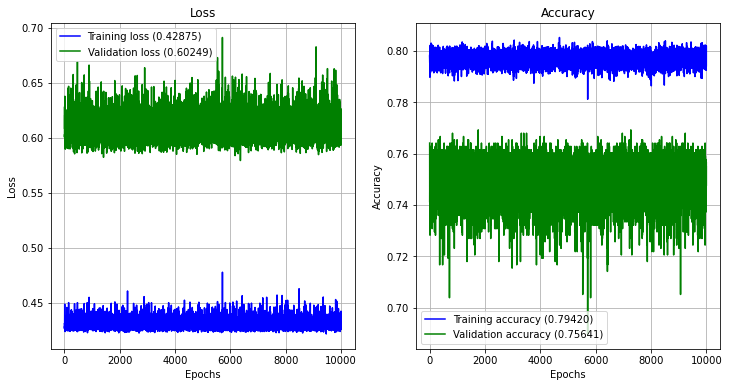

Training time:  929.118s


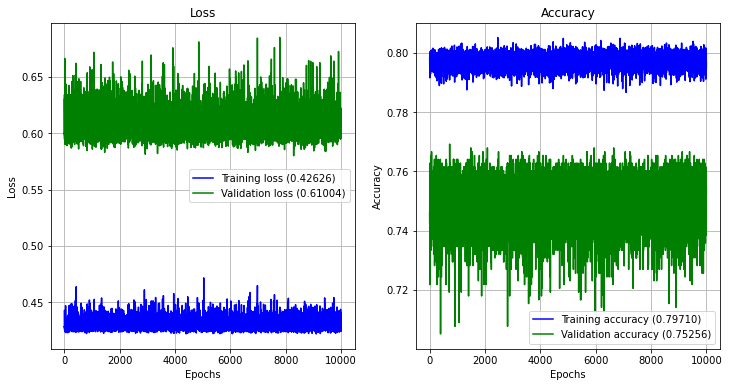

Training time:  953.096s


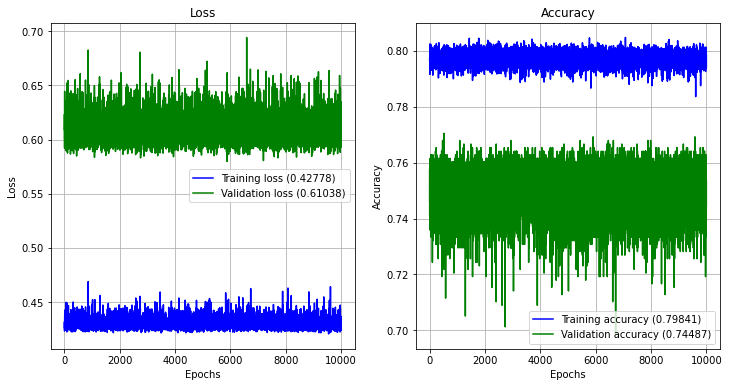

Training time:  1263.509s


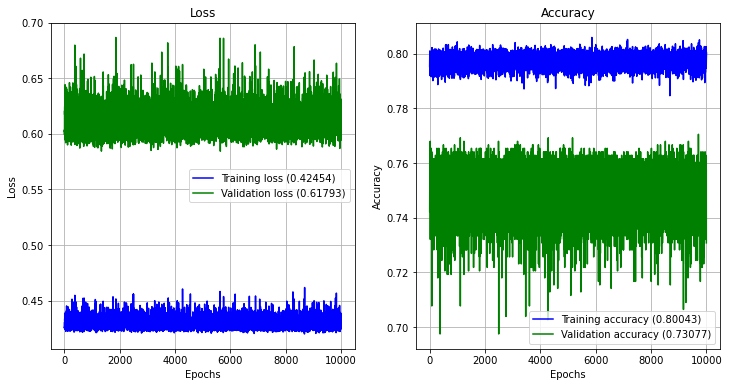

Training time:  945.233s


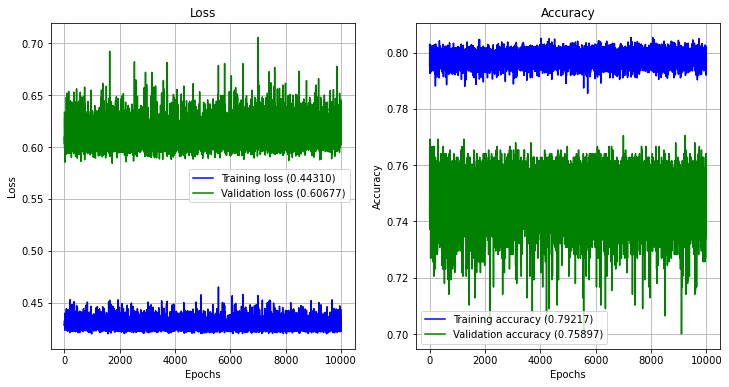

Training time:  1121.255s


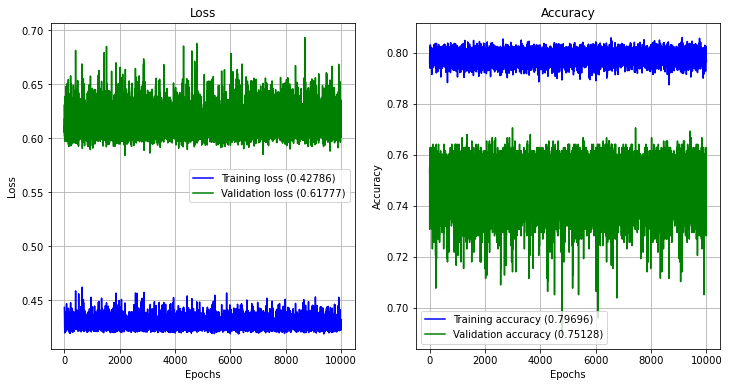

Training time:  1284.951s


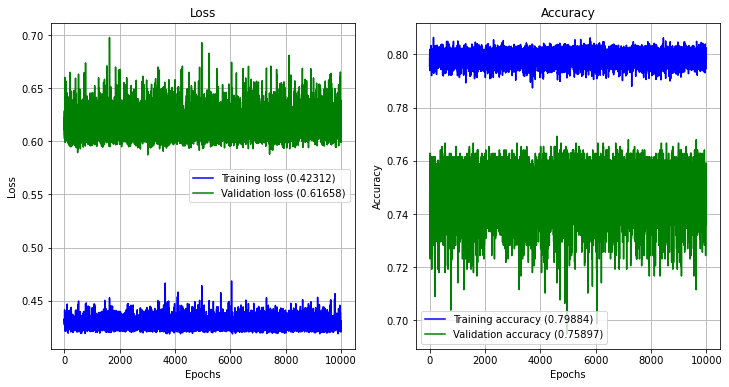

Training time:  979.298s


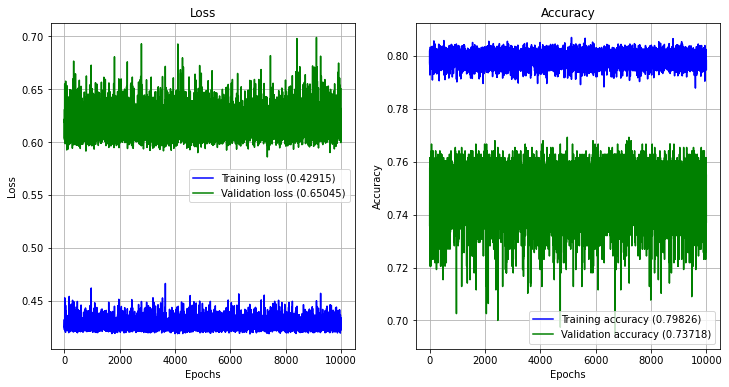

KeyboardInterrupt: 

In [9]:
iteraciones = 1000
epochs = 10000
from keras.callbacks import ModelCheckpoint
for i in range(iteraciones):
    fecha = str(20230131)
    carpeta = 'TemperaturaPrecipitacionRegularizacionFull-' + fecha + '/Pesos-1-reg-' +str(regularizacion) + '-' + str(i+1)
    checkpoint_name =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-binary_accuracy-{binary_accuracy:.5f}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name2 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-recall-{recall:.5f}.hdf5' 
    checkpoint2 = ModelCheckpoint(checkpoint_name2, monitor='recall', verbose = 0, save_best_only = True, mode ='max')
    checkpoint_name3 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_binary_accuracy-{val_binary_accuracy:.5f}.hdf5' 
    checkpoint3 = ModelCheckpoint(checkpoint_name3, monitor='val_binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name4 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_recall-{val_recall:.5f}.hdf5' 
    checkpoint4 = ModelCheckpoint(checkpoint_name4, monitor='val_recall', verbose = 0, save_best_only = True, mode ='max')
    
    callbacks_list = [ checkpoint, checkpoint2, checkpoint3, checkpoint4]
    
    entrenarModelo(model, dataframeTrain, dataframeTest, 800, epochs, callbacks_list)
    model.save_weights(carpeta+ '/my_weights-' + str((i+1) * epochs) + '.h5')

Training time:  644.254s


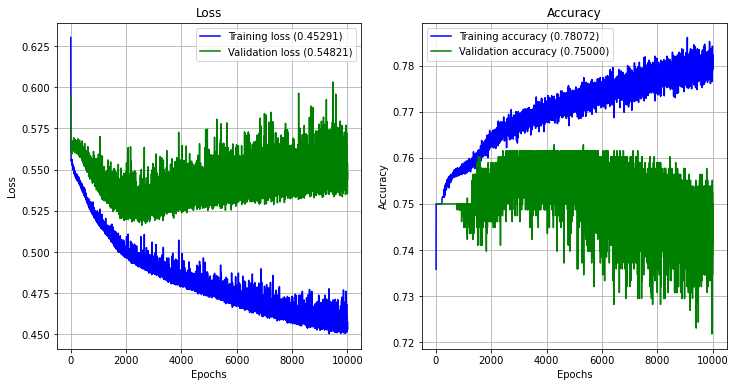

Training time:  707.914s


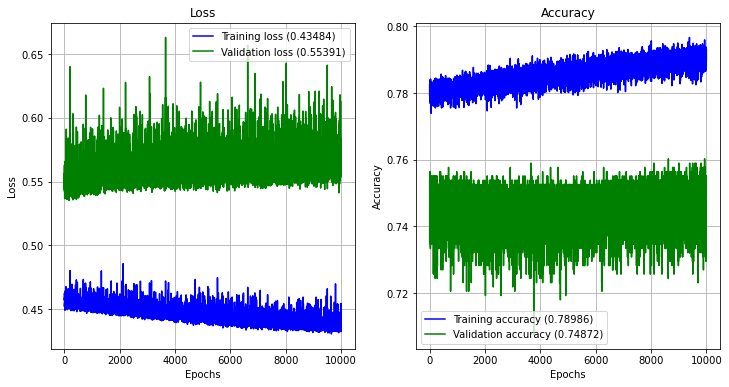

Training time:  737.007s


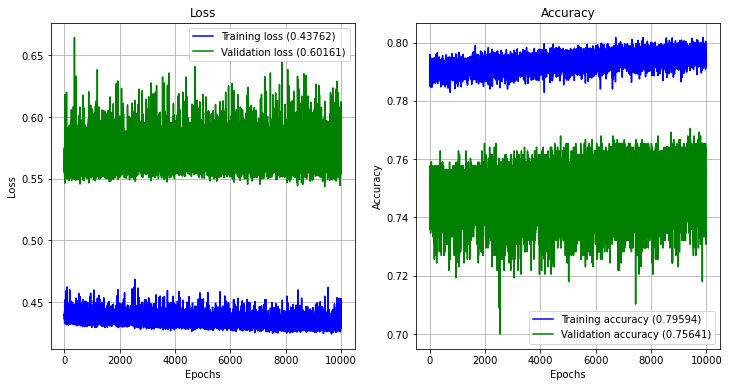

Training time:  752.631s


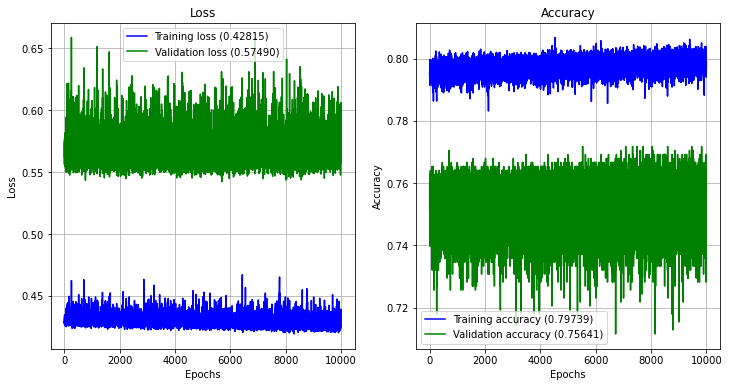

Training time:  766.230s


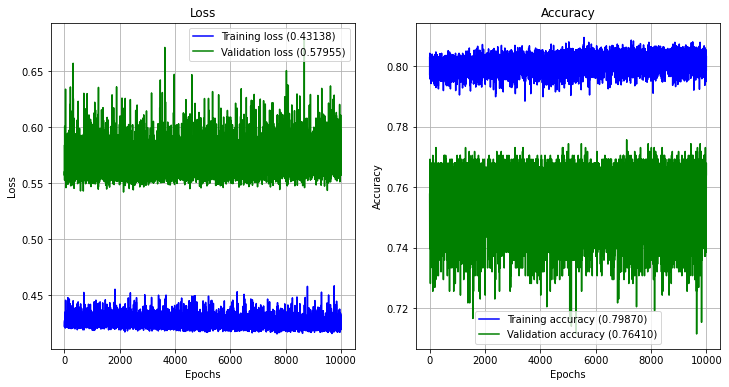

Training time:  772.361s


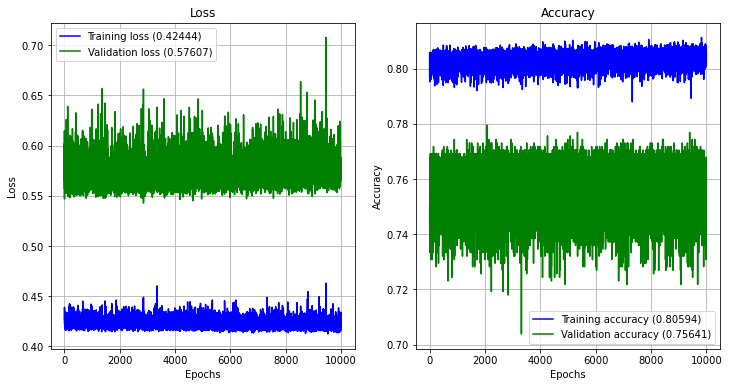

Training time:  777.409s


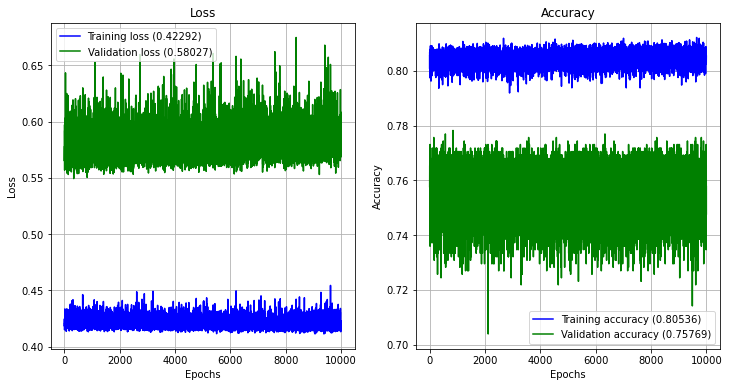

Training time:  778.876s


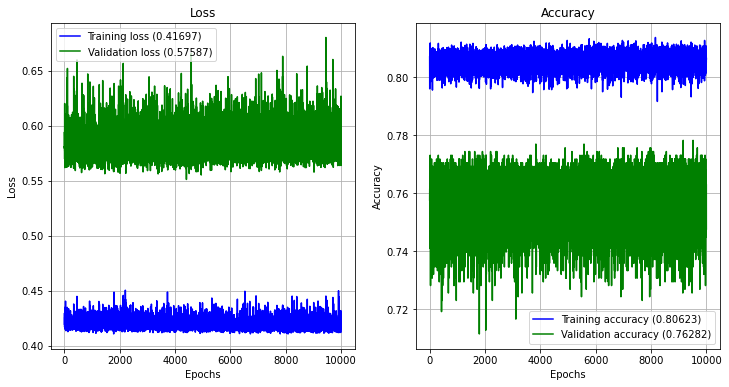

Training time:  779.040s


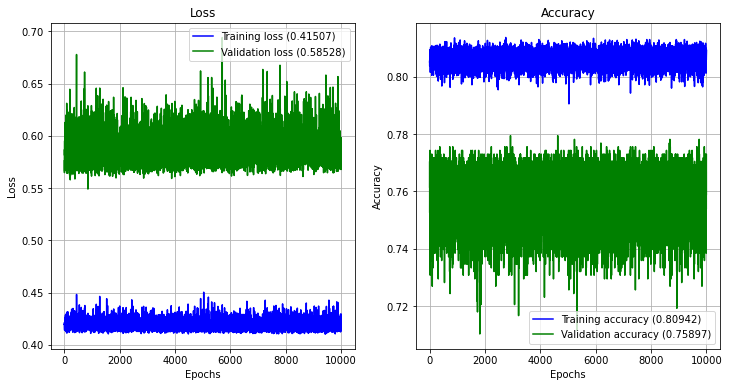

Training time:  784.612s


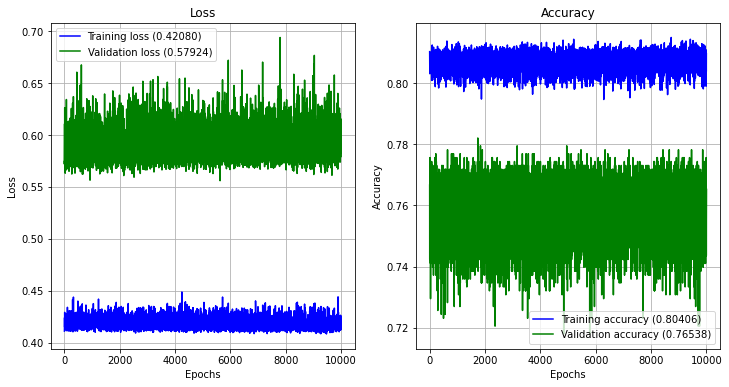

Training time:  788.498s


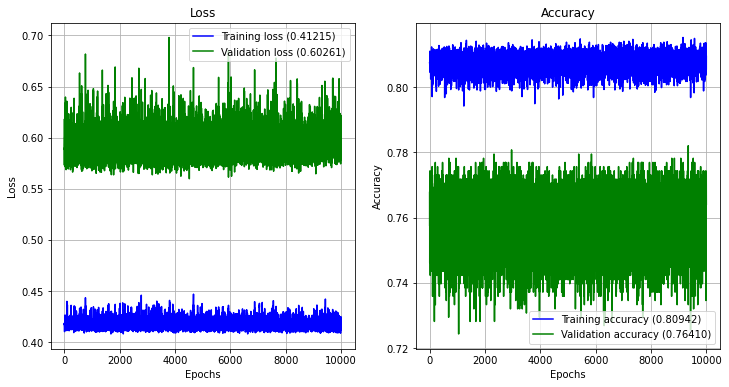

KeyboardInterrupt: 

In [7]:
iteraciones = 1000
epochs = 10000
offset = 26
from keras.callbacks import ModelCheckpoint
for i in range(iteraciones):
    fecha = str(20230131)
    carpeta = 'TemperaturaPrecipitacionRegularizacionFull-' + fecha + '/Pesos-1-reg-' +str(regularizacion) + '-' + str(i+offset)
    checkpoint_name =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-binary_accuracy-{binary_accuracy:.5f}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name2 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-recall-{recall:.5f}.hdf5' 
    checkpoint2 = ModelCheckpoint(checkpoint_name2, monitor='recall', verbose = 0, save_best_only = True, mode ='max')
    checkpoint_name3 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_binary_accuracy-{val_binary_accuracy:.5f}.hdf5' 
    checkpoint3 = ModelCheckpoint(checkpoint_name3, monitor='val_binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name4 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_recall-{val_recall:.5f}.hdf5' 
    checkpoint4 = ModelCheckpoint(checkpoint_name4, monitor='val_recall', verbose = 0, save_best_only = True, mode ='max')
    
    callbacks_list = [ checkpoint, checkpoint2, checkpoint3, checkpoint4]
    
    entrenarModelo(model, dataframeTrain, dataframeTest, 800, epochs, callbacks_list)
    model.save_weights(carpeta+ '/my_weights-' + str((i+offset) * epochs) + '.h5')

In [9]:
obtenerMejorModelo('TemperaturaPrecipitacionRegularizacionFull-20230131')

Mejor binary_accuracy:  0.81565
TemperaturaPrecipitacionRegularizacionFull-20230131\Pesos-1-reg-1e-05-37\Pesos-20230131-8566-binary_accuracy-0.81565.hdf5
Mejor val_binary_accuracy:  0.78205
TemperaturaPrecipitacionRegularizacionFull-20230131\Pesos-1-reg-1e-05-35\Pesos-20230131-1741-val_binary_accuracy-0.78205.hdf5
Mejor recall:  0.80116
TemperaturaPrecipitacionRegularizacionFull-20230131\Pesos-1-reg-1e-05-1\Pesos-20230131-001-recall-0.80116.hdf5
Mejor val_recall:  0.54872
TemperaturaPrecipitacionRegularizacionFull-20230131\Pesos-1-reg-1e-05-33\Pesos-20230131-3337-val_recall-0.54872.hdf5


25/25 [==============================] - 0s 1ms/step


C:\Users\ERNEST~1\AppData\Local\Temp/ipykernel_16040/2029442838.py:739: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X=np.asarray(X).astype(np.float)
C:\Users\ERNEST~1\AppData\Local\Temp/ipykernel_16040/2029442838.py:741: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y=np.asarray(y).astype(np.float)


Accuracy test:   78.21%
Confusion matrix, without normalization


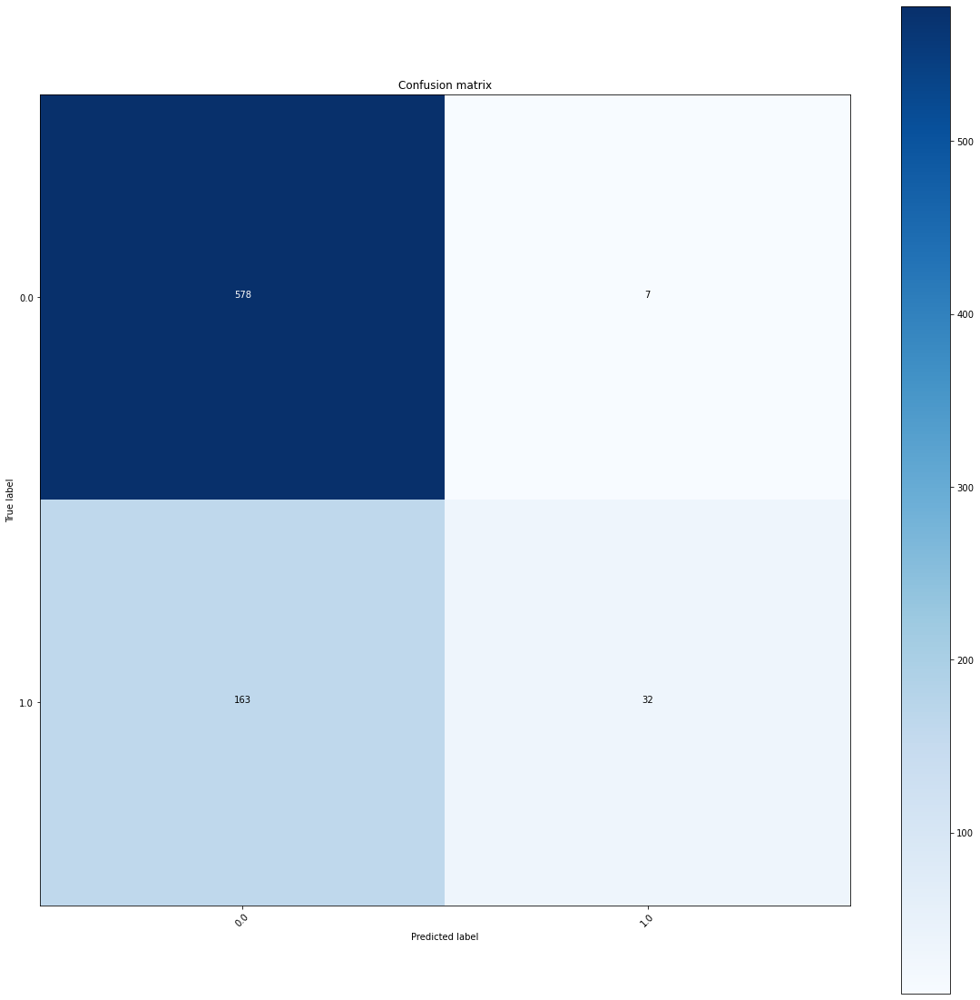

In [12]:
predecirYMostrarMatrizConfusion(dataframeTest,model,
                                "TemperaturaPrecipitacionRegularizacionFull-20230131\Pesos-1-reg-1e-05-35\Pesos-20230131-1741-val_binary_accuracy-0.78205.hdf5", 0.6)

In [22]:
[parcelasAObservar, parcelasSinResultado]  = parcelasConAciertos(dataframeTest, model, 0.6)
dataframeAux = dataframeTest
dataframeDias = dataframeTest.loc[dataframeTest["recogido"] == 1]

39
hay  39  parcelas a observar
------------------
22_27_0_1_503_5019_1 dias que deberia dar 1 la prediccion:
30    302
31    303
32    304
33    305
34    306
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
22_27_0_1_503_5560_8 dias que deberia dar 1 la prediccion:
50    302
51    303
52    304
53    305
54    306
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
50_108_0_0_11_75 dias que deberia dar 1 la prediccion:
110    317
111    318
112    319
113    320
114    321
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
50_108_0_0_2_176 dias que deberia dar 1 la prediccion:
190    317
191    318
192    319
193    320
194    321
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
50_108_0_0_2_250 dias que deberia dar 1 la prediccion:
210    317
211    318
212    319
213    320
214    321
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
dia:  308
------------------
5

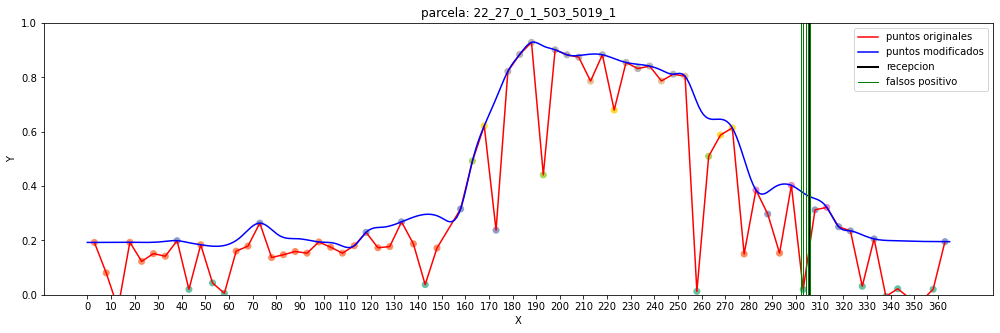

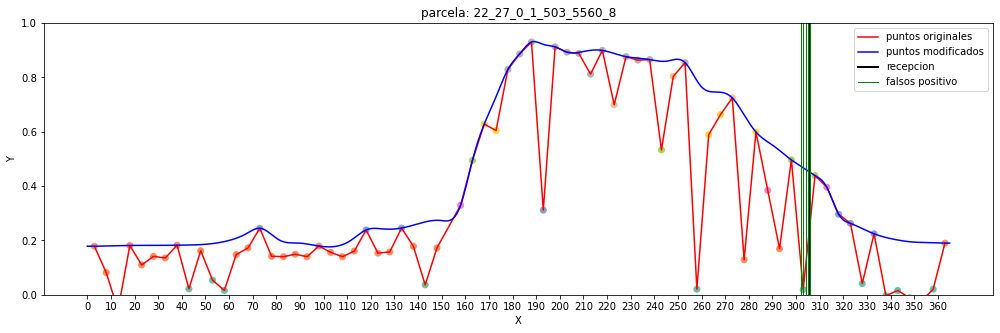

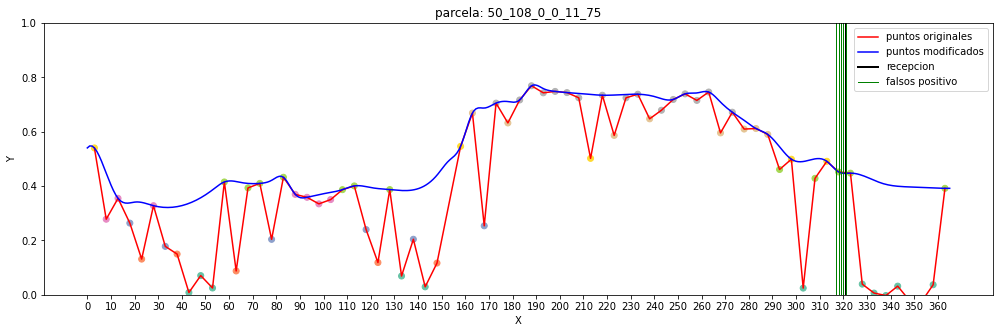

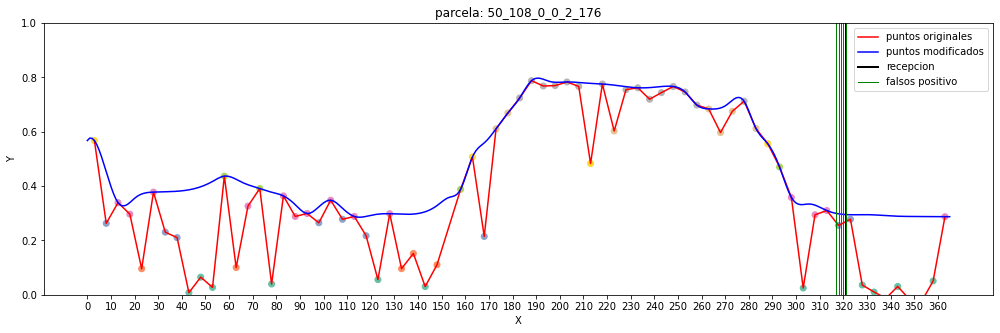

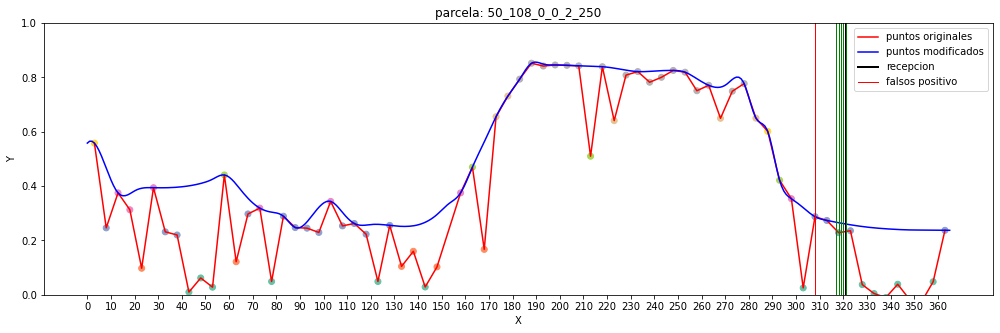

...

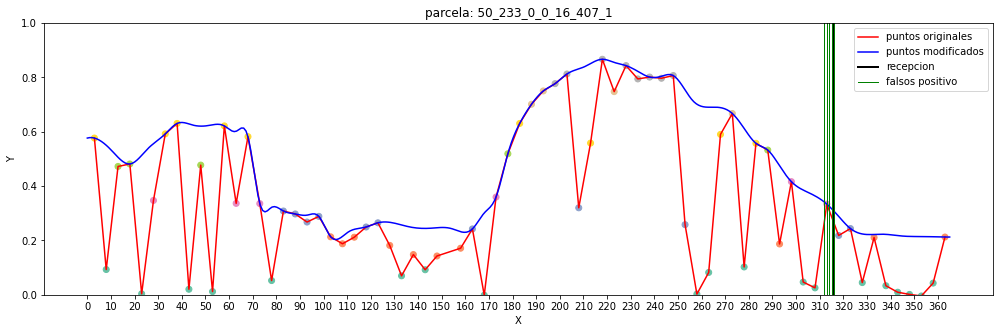

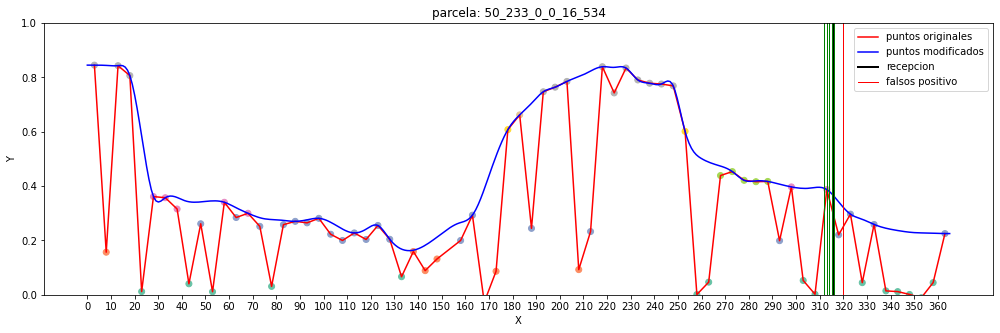

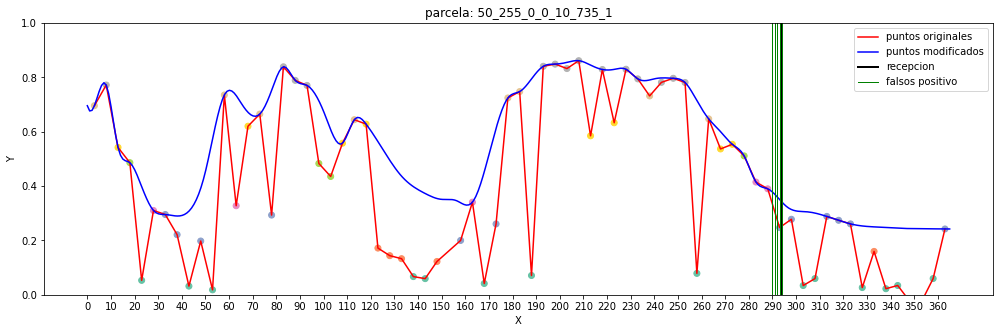

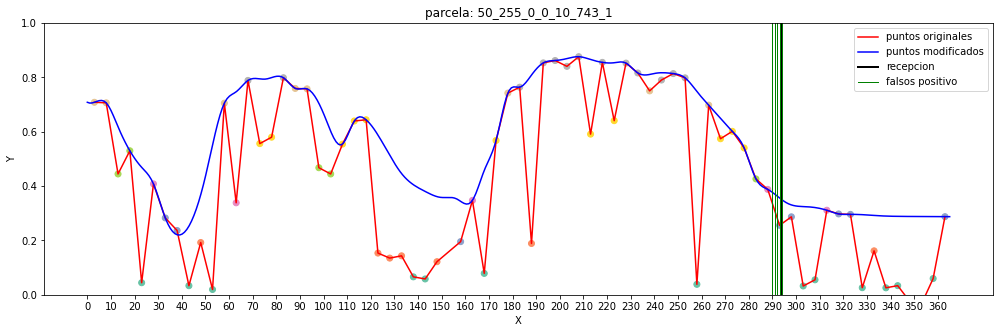

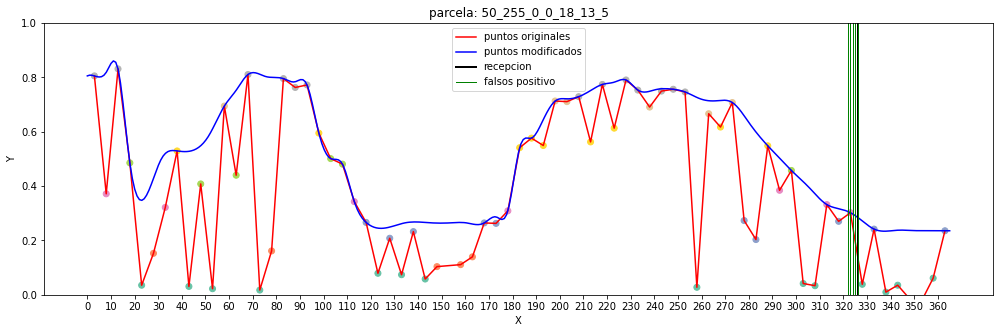

In [23]:
mostrarParcelasSinAciertos(parcelasSinResultado)

dia de recepcion:  295
true positives:  [292, 293, 294, 295]


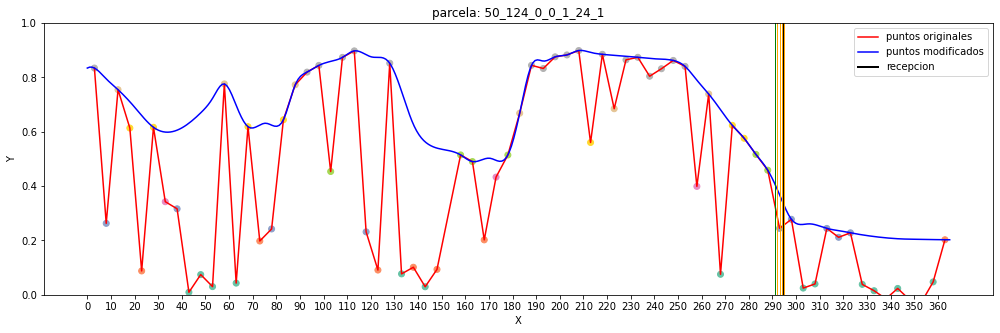

dia de recepcion:  295
true positives:  [293, 294, 295]


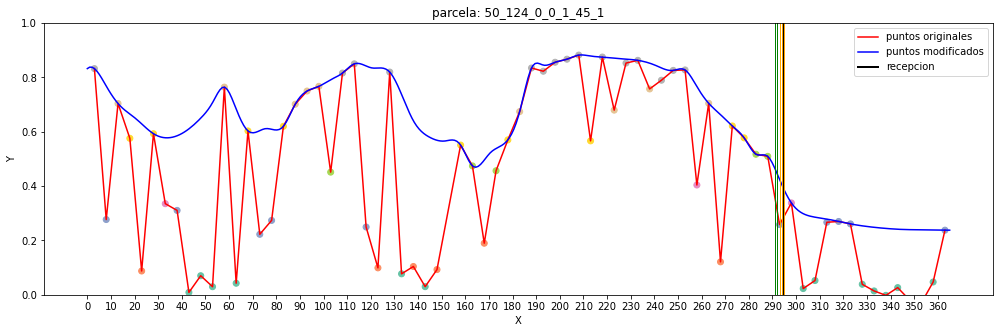

dia de recepcion:  295
true positives:  [293, 294]


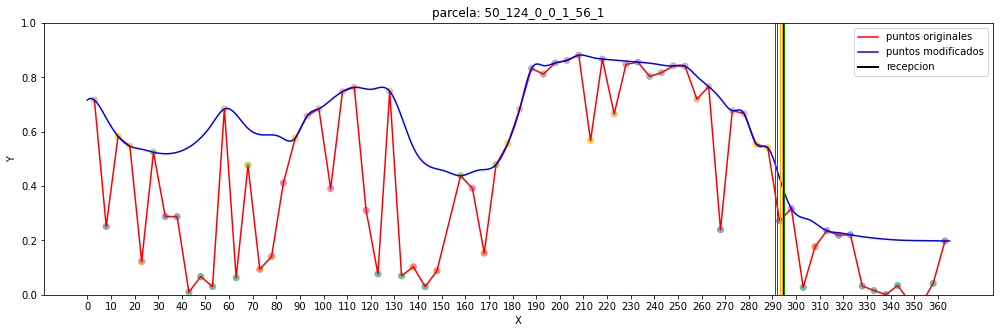

dia de recepcion:  295
true positives:  [294]


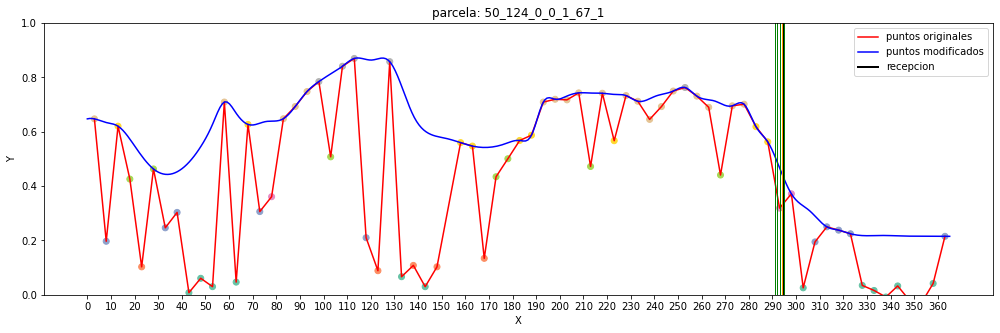

dia de recepcion:  312
true positives:  [310, 311, 312]


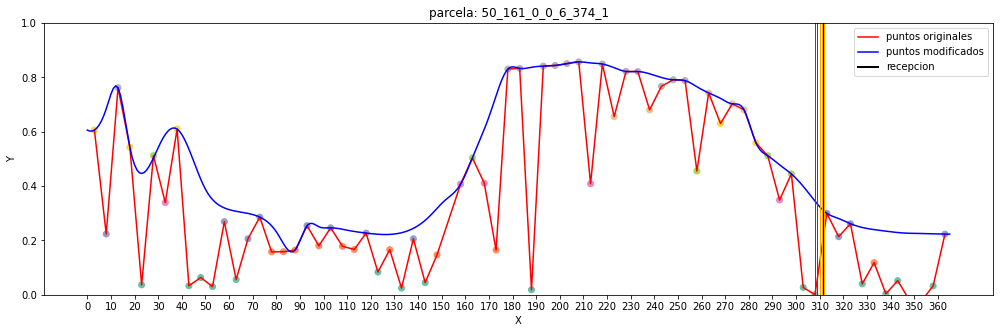

dia de recepcion:  312
true positives:  [308, 310, 311, 312]


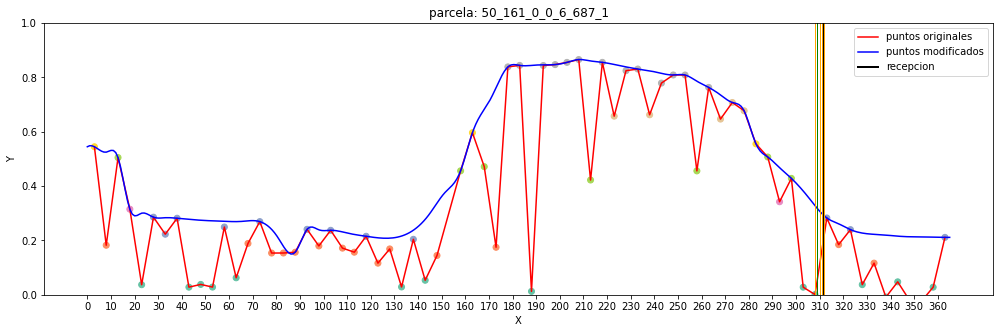

dia de recepcion:  364
true positives:  [361]


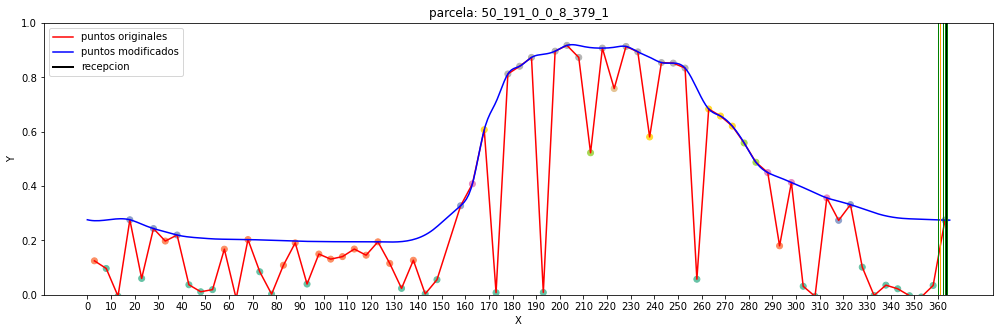

dia de recepcion:  364
true positives:  [361]


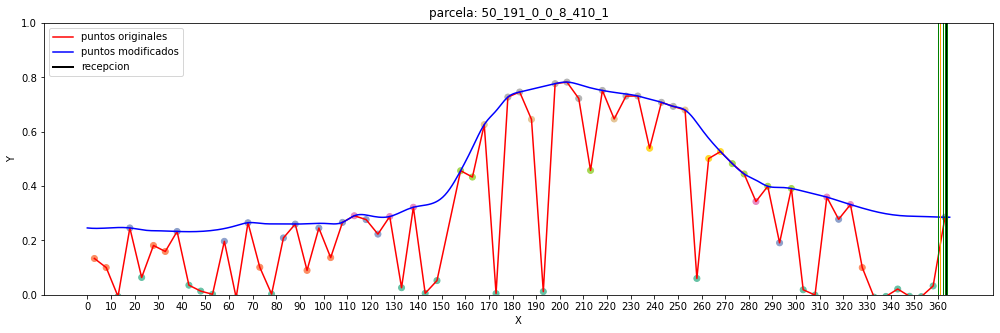

dia de recepcion:  364
true positives:  [361]


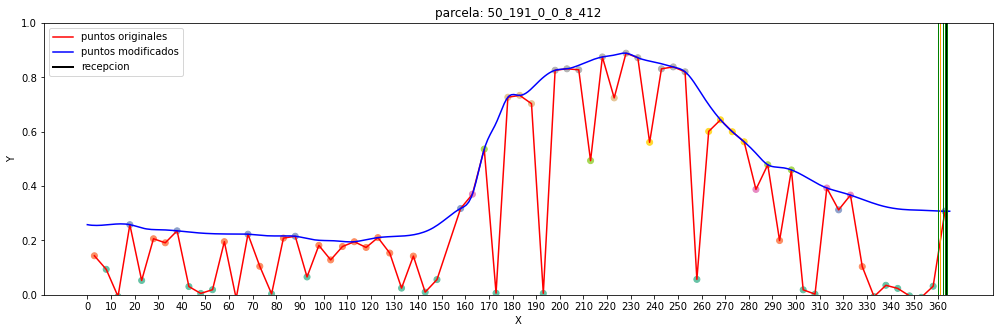

dia de recepcion:  364
true positives:  [361]


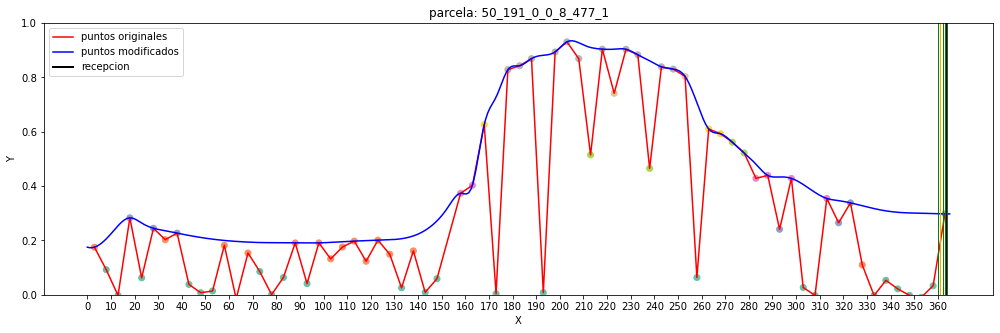

dia de recepcion:  364
true positives:  [361]


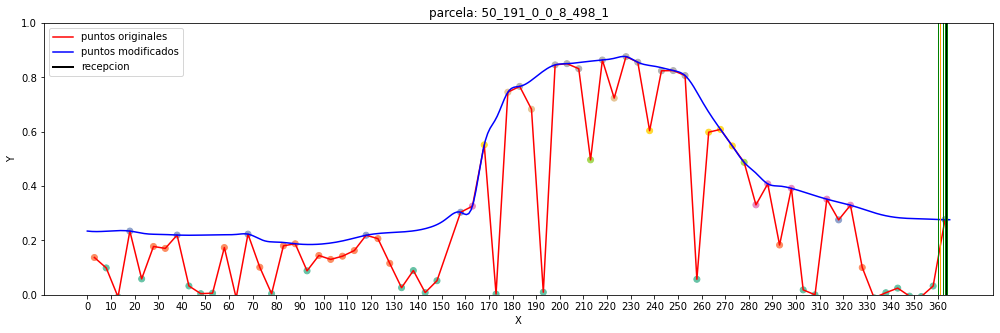

dia de recepcion:  315
true positives:  [315]


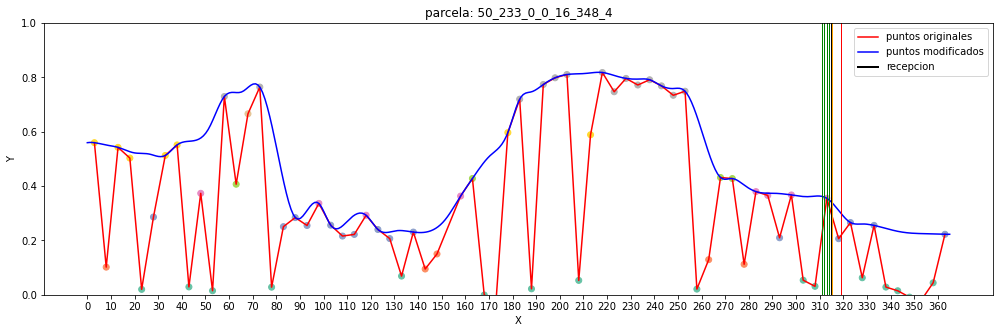

dia de recepcion:  316
true positives:  [312]


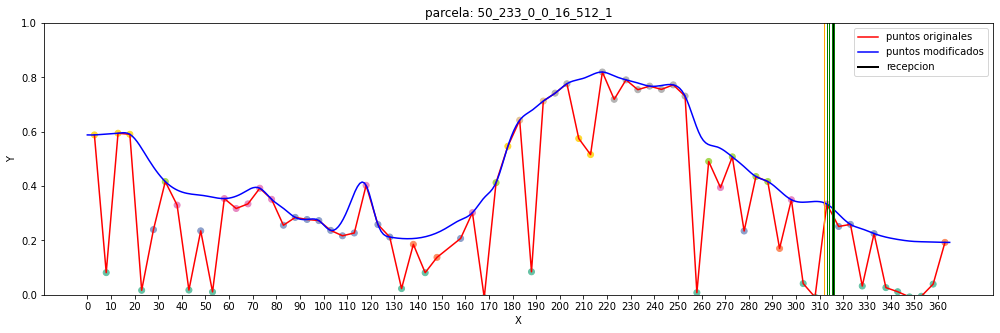

dia de recepcion:  326
true positives:  [325, 326]


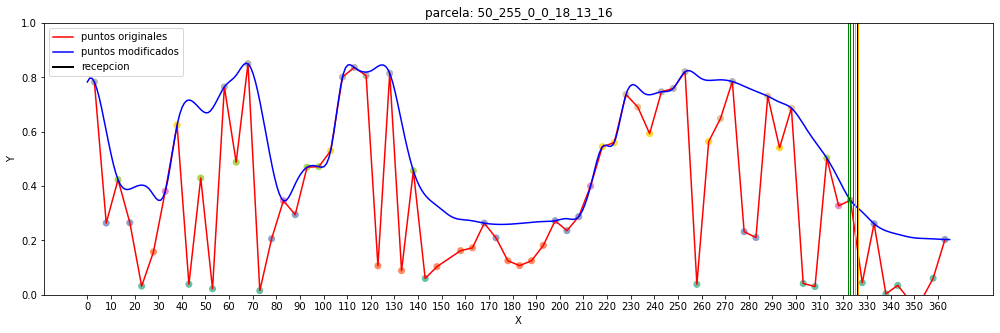

dia de recepcion:  326
true positives:  [323, 325]


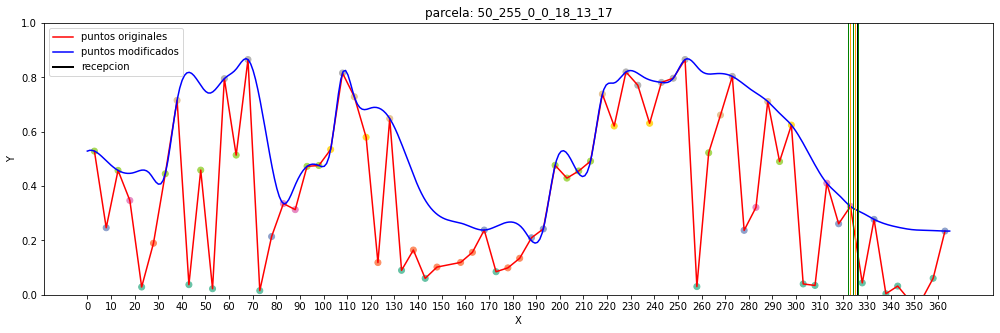

dia de recepcion:  326
true positives:  [325, 326]


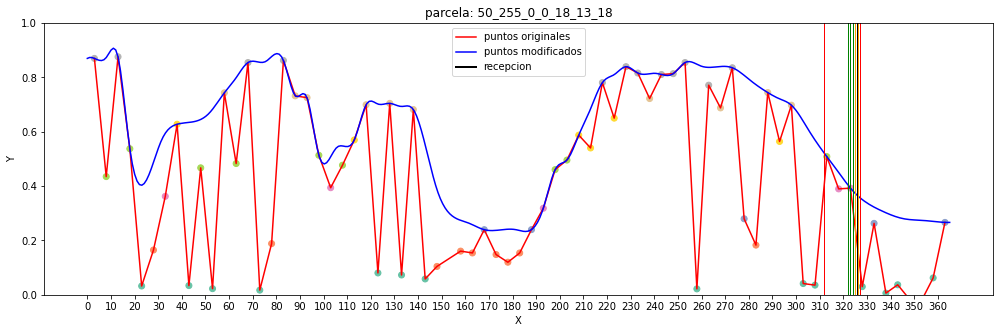

dia de recepcion:  326
true positives:  [325, 326]


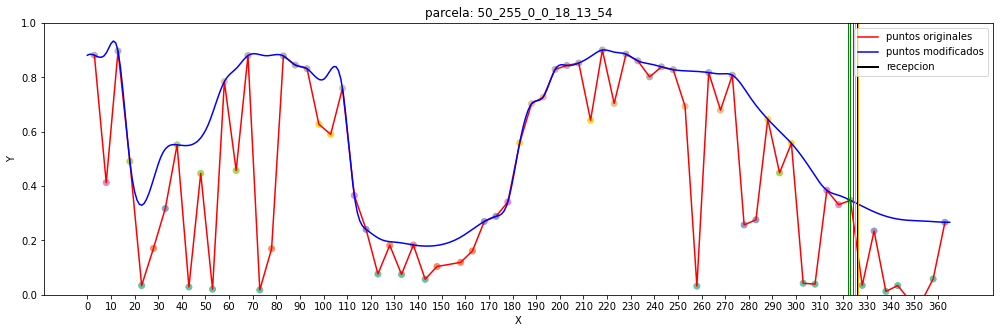

In [26]:
mostrarParcelasConAciertos(parcelasAObservar)

In [27]:
[mini,maxi,promedi] = exito(dataframeTest, funcionExito)

1/1 [==============================] - 0s 19ms/step
22_27_0_1_503_5019_1 [0.0277709] [0.01276183] -14
22_27_0_1_503_5019_1 [0.0783173] [0.03704796] -12
22_27_0_1_503_5019_1 [0.3546513] [0.17057258] -11
22_27_0_1_503_5019_1 [0.32719746] [0.17192958] -7
22_27_0_1_503_5019_1 [0.28936523] [0.2224124] -1
[0.2224124]
1/1 [==============================] - 0s 19ms/step
22_27_0_1_503_5560_8 [0.04167748] [0.01915245] -14
22_27_0_1_503_5560_8 [0.05216197] [0.02430516] -13
22_27_0_1_503_5560_8 [0.07235513] [0.03422756] -12
22_27_0_1_503_5560_8 [0.13464175] [0.0647571] -11
22_27_0_1_503_5560_8 [0.16915442] [0.08457721] -9
22_27_0_1_503_5560_8 [0.14444292] [0.11102197] -1
[0.11102197]
1/1 [==============================] - 0s 18ms/step
50_108_0_0_11_75 [0.0093902] [0.00431517] -14
50_108_0_0_11_75 [0.34362754] [0.16011512] -13
50_108_0_0_11_75 [0.3696049] [0.2003172] -6
50_108_0_0_11_75 [0.40337405] [0.22685024] -5
50_108_0_0_11_75 [0.47276884] [0.27826792] -4
50_108_0_0_11_75 [0.45368472] [0.28318

In [28]:
print(mini,maxi,promedi)

[0.11102197] [0.77518654] [0.46379656]


Los valores del promedio no siguen el sentido esperado ya que:<br>
TPSN -> 23 / 39 -> 0.476, Segundo mayor promedio<br>
TPRSN -> 21 / 39 -> 0.491, Mayor promedio<br>
TP -> 21 / 39 -> 0.473, Tercer mejor promedio<br>
TPR -> 17 / 39 -> 0.463, Peor promedio

-----------------------------------------------------------------------------------------------------------------------------

Ahora voy a probar lo mismo pero con la precipitacion acumulada en vez de la del dia anterior solamente (con todos los datos):

In [4]:
import pandas as pd
import numpy as np
        
df = pd.read_csv('datosEntrenables20230131-full.csv')
parcelasAQuitar = df.loc[df['estacion'] == 'not inialized']['parcela'].unique()
df = df[~df['parcela'].isin(parcelasAQuitar)]
df = df.drop(columns=['Unnamed: 0','prec','estacion'])
df = quitarDatosMalos(df )
df = anyadirRelacionesParametros(df, ['parcela','dia','recogido','tmed','precSum3'])
anyadirUnos(df)
[dataframeTrain, dataframeTest] = separarTrainTest(df)

Vamos a entrenar con los siguientes datos:

In [5]:
dataframeTrain

,pendiente dia -15,pendiente dia -10,pendiente dia -5,ndvi,col 1 * col 2,col 1 * col 3,col 1 * col 4,col 2 * col 3,col 2 * col 4,col 3 * col 4,parcela,dia,recogido,tmed,precSum3,unos
0,0.013078,0.008582,-0.002236,0.456587,0.000112,-0.000029,0.005971,-0.000019,0.003919,-0.001021,22_27_0_1_503_5017_1,292,0,17.4,0.0,1
1,0.011039,0.005081,-0.006042,0.467762,0.000056,-0.000067,0.005164,-0.000031,0.002377,-0.002826,22_27_0_1_503_5017_1,293,0,18.0,0.0,1
2,0.008906,0.001723,-0.008617,0.478748,0.000015,-0.000077,0.004264,-0.000015,0.000825,-0.004126,22_27_0_1_503_5017_1,294,0,17.6,0.0,1
3,0.006757,-0.001304,-0.009899,0.488632,-0.000009,-0.000067,0.003301,0.000013,-0.000637,-0.004837,22_27_0_1_503_5017_1,295,0,15.5,0.0,1
4,0.004652,-0.003832,-0.010032,0.496736,-0.000018,-0.000047,0.002311,0.000038,-0.001903,-0.004983,22_27_0_1_503_5017_1,296,0,13.7,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8155,0.005049,0.004059,0.004025,0.414865,0.000020,0.000020,0.002094,0.000016,0.001684,0.001670,50_224_0_2_18_50_1,289,0,16.8,0.0,1
8156,0.005029,0.004006,0.004614,0.409131,0.000020,0.000023,0.002057,0.000018,0.001639,0.001888,50_224_0_2_18_50_1,290,0,16.4,0.0,1
8157,0.004980,0.004131,0.005174,0.402966,0.000021,0.000026,0.002007,0.000021,0.001665,0.002085,50_224_0_2_18_50_1,291,0,17.8,0.2,1
8158,0.004917,0.004413,0.005670,0.396435,0.000022,0.000028,0.001949,0.000025,0.001750,0.002248,50_224_0_2_18_50_1,292,0,18.8,0.2,1


In [6]:
regularizacion = 0.00001
model = obtenerModelo20230110(dataframeTrain, regularizacion)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 169)               2366      
                                                                 
 dense_1 (Dense)             (None, 13)                2210      
                                                                 
 dense_2 (Dense)             (None, 1)                 14        
                                                                 
Total params: 4,590
Trainable params: 4,590
Non-trainable params: 0
_________________________________________________________________


Training time:  784.767s


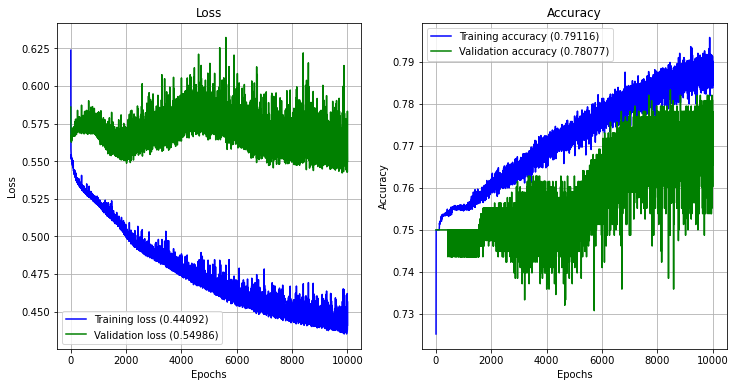

Training time:  866.258s


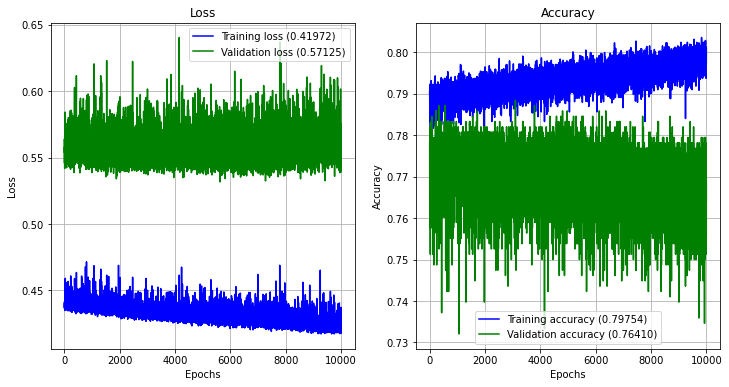

Training time:  1172.877s


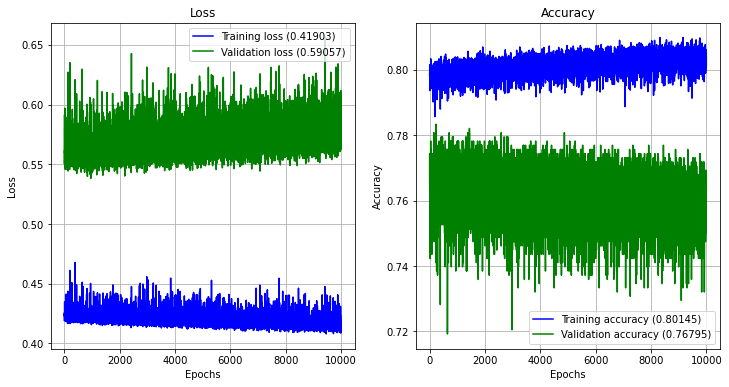

Training time:  1077.215s


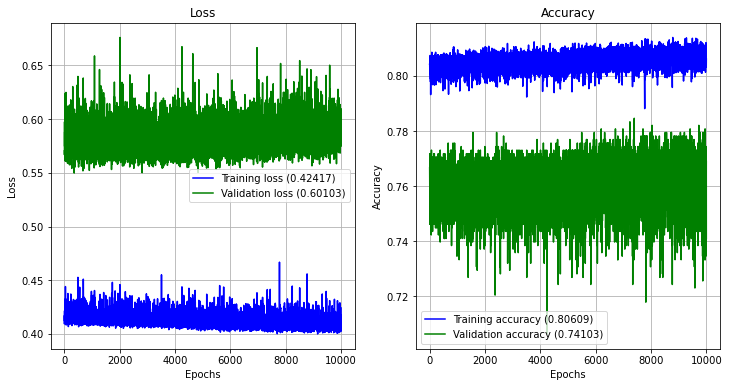

Training time:  1103.366s


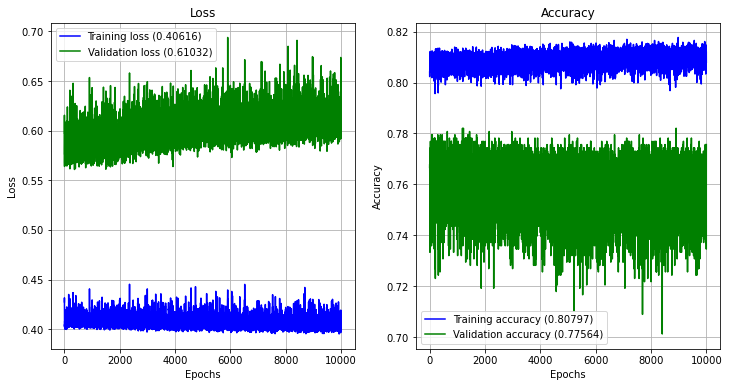

Training time:  1010.549s


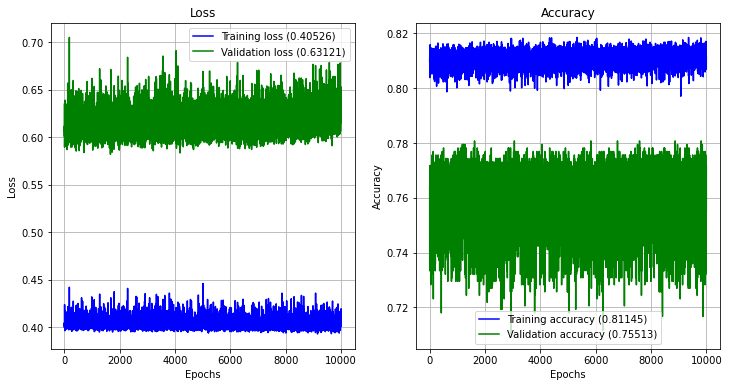

Training time:  1053.468s


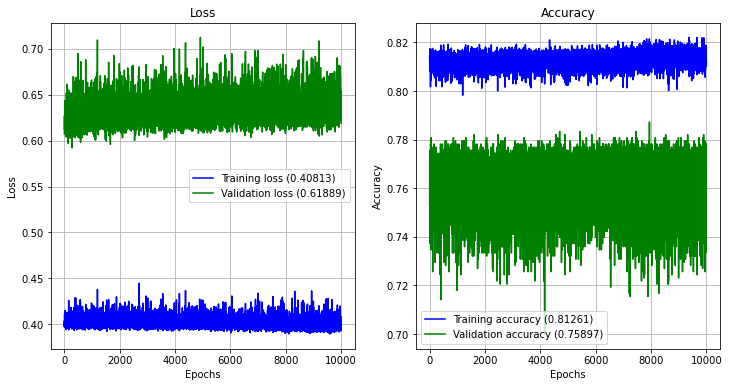

Training time:  1057.487s


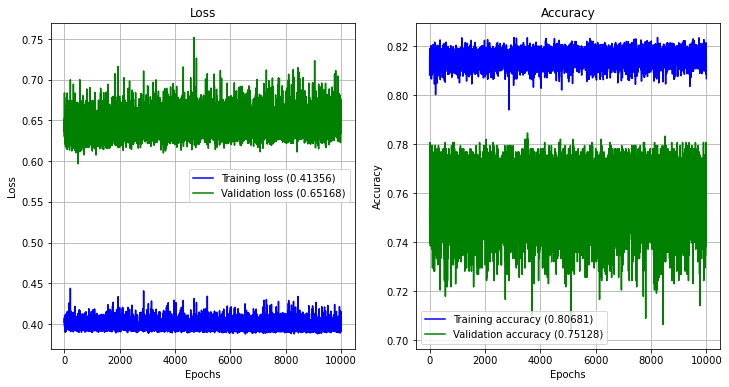

Training time:  983.079s


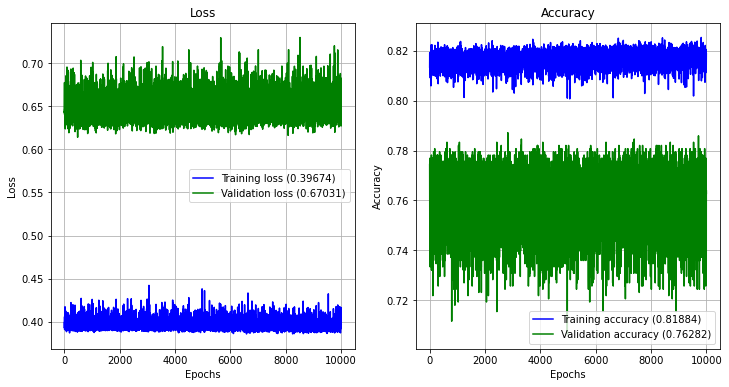

Training time:  1008.356s


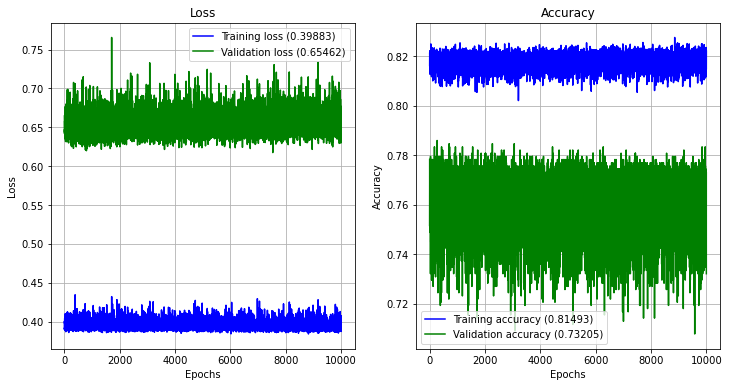

Training time:  1013.667s


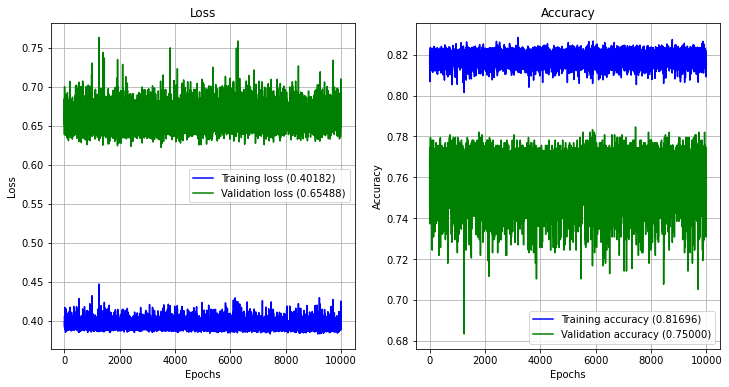

Training time:  1421.185s


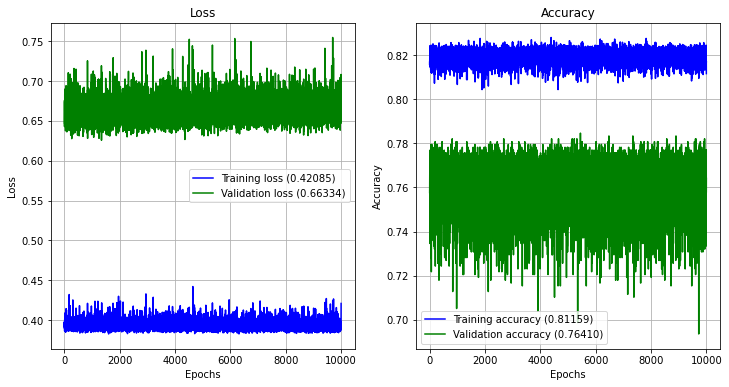

Training time:  1131.208s


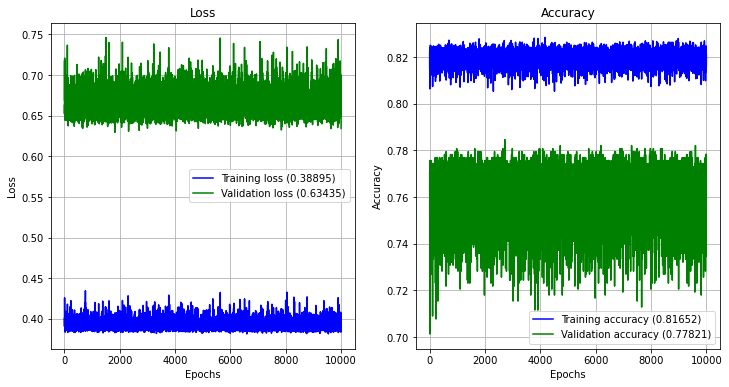

Training time:  971.088s


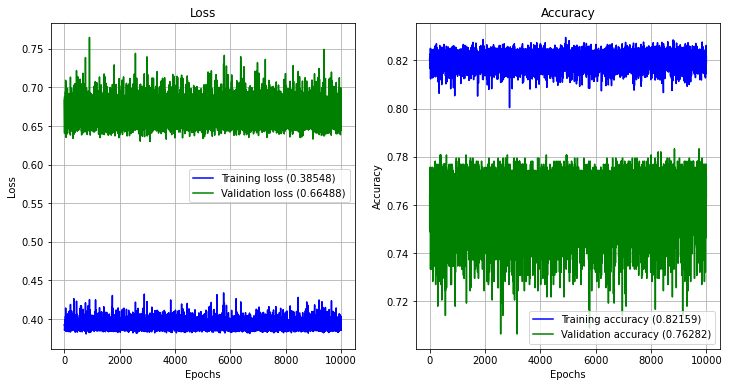

Training time:  818.444s


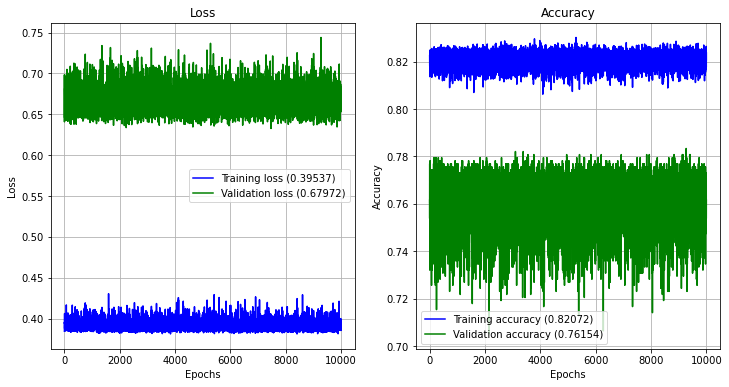

Training time:  861.232s


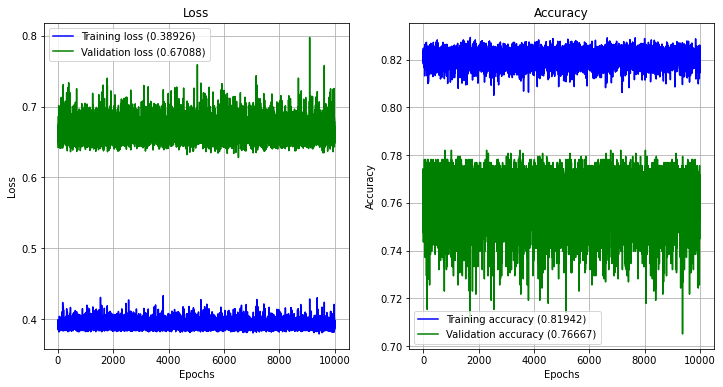

Training time:  814.567s


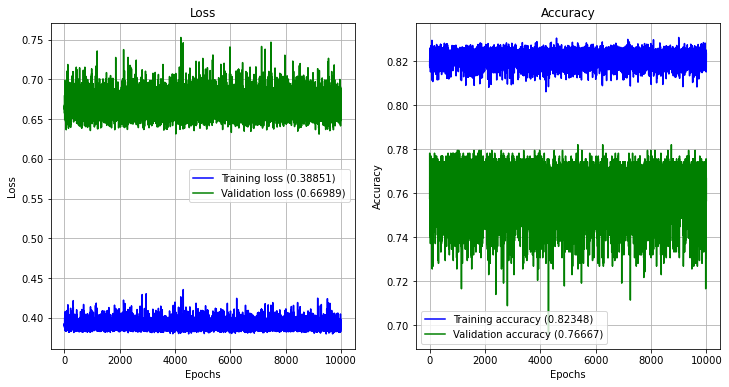

Training time:  858.415s


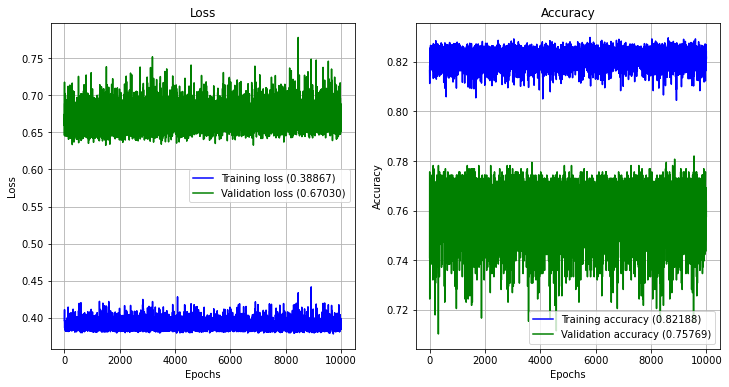

Training time:  875.310s


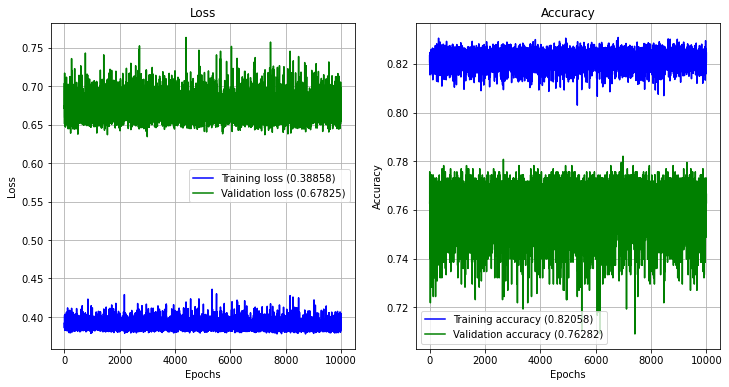

Training time:  874.479s


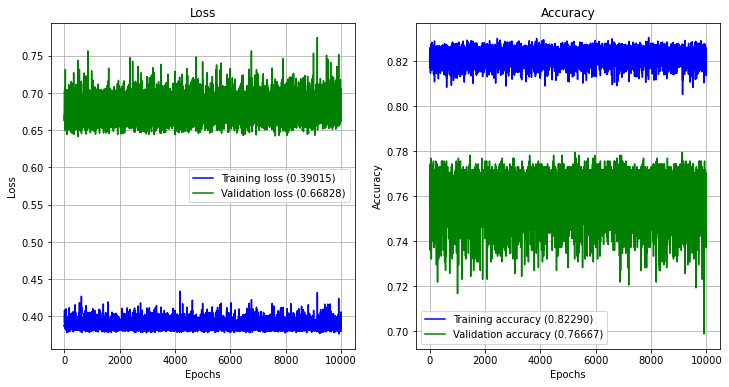

Training time:  886.136s


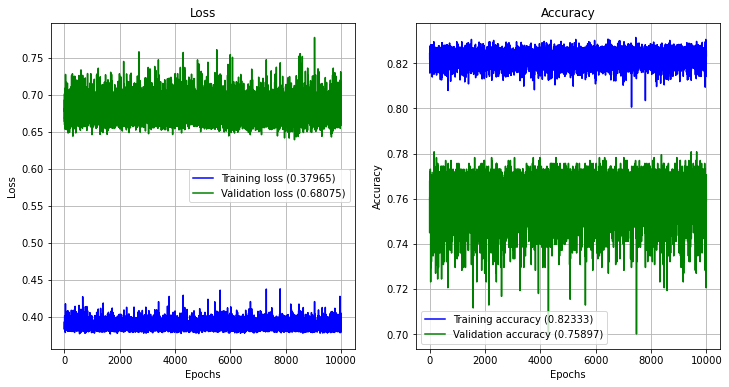

Training time:  871.629s


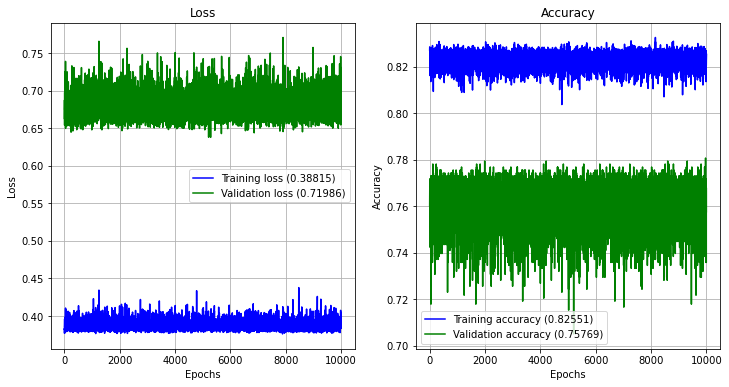

Training time:  822.398s


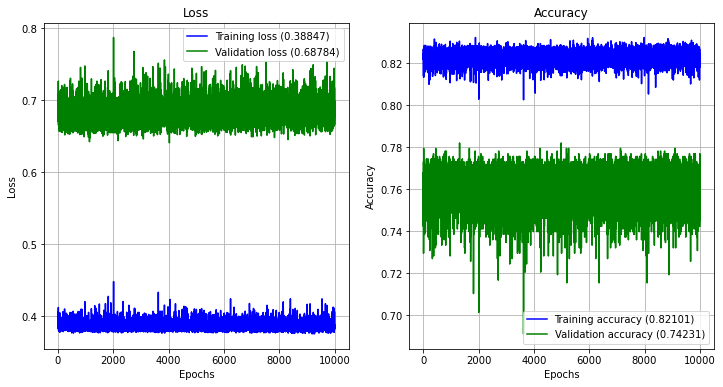

Training time:  818.227s


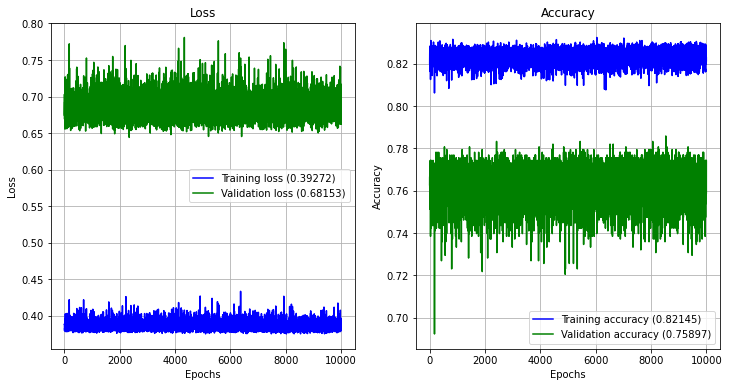

Training time:  815.121s


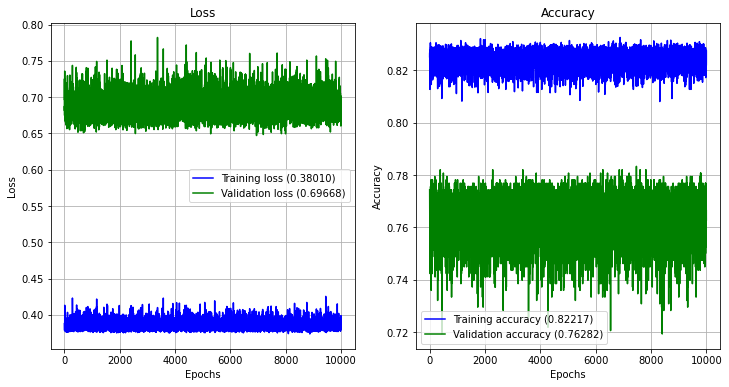

Training time:  799.418s


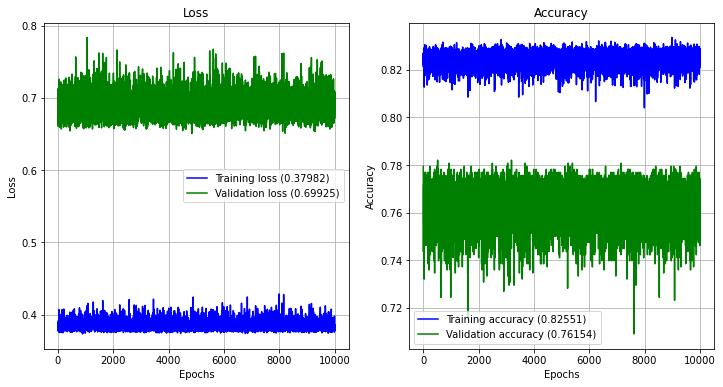

KeyboardInterrupt: 

In [7]:
iteraciones = 1000
epochs = 10000
from keras.callbacks import ModelCheckpoint
for i in range(iteraciones):
    fecha = str(20230131)
    carpeta = 'TemperaturaPrecSum3RegularizacionFull-' + fecha + '/Pesos-1-reg-' +str(regularizacion) + '-' + str(i+1)
    checkpoint_name =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-binary_accuracy-{binary_accuracy:.5f}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name2 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-recall-{recall:.5f}.hdf5' 
    checkpoint2 = ModelCheckpoint(checkpoint_name2, monitor='recall', verbose = 0, save_best_only = True, mode ='max')
    checkpoint_name3 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_binary_accuracy-{val_binary_accuracy:.5f}.hdf5' 
    checkpoint3 = ModelCheckpoint(checkpoint_name3, monitor='val_binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name4 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_recall-{val_recall:.5f}.hdf5' 
    checkpoint4 = ModelCheckpoint(checkpoint_name4, monitor='val_recall', verbose = 0, save_best_only = True, mode ='max')
    
    callbacks_list = [ checkpoint, checkpoint2, checkpoint3, checkpoint4]
    
    entrenarModelo(model, dataframeTrain, dataframeTest, 800, epochs, callbacks_list)
    model.save_weights(carpeta+ '/my_weights-' + str((i+1) * epochs) + '.h5')

In [8]:
obtenerMejorModelo('TemperaturaPrecSum3RegularizacionFull-20230131')

Mejor binary_accuracy:  0.83362
TemperaturaPrecSum3RegularizacionFull-20230131\Pesos-1-reg-1e-05-26\Pesos-20230131-8986-binary_accuracy-0.83362.hdf5
Mejor val_binary_accuracy:  0.78846
TemperaturaPrecSum3RegularizacionFull-20230131\Pesos-1-reg-1e-05-2\Pesos-20230131-3101-val_binary_accuracy-0.78846.hdf5
Mejor recall:  0.57333
TemperaturaPrecSum3RegularizacionFull-20230131\Pesos-1-reg-1e-05-24\Pesos-20230131-3366-recall-0.57333.hdf5
Mejor val_recall:  0.61538
TemperaturaPrecSum3RegularizacionFull-20230131\Pesos-1-reg-1e-05-11\Pesos-20230131-1248-val_recall-0.61538.hdf5


25/25 [==============================] - 0s 1000us/step


C:\Users\ERNEST~1\AppData\Local\Temp/ipykernel_28272/3216056692.py:739: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  X=np.asarray(X).astype(np.float)
C:\Users\ERNEST~1\AppData\Local\Temp/ipykernel_28272/3216056692.py:741: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y=np.asarray(y).astype(np.float)


Accuracy test:   78.85%
Confusion matrix, without normalization


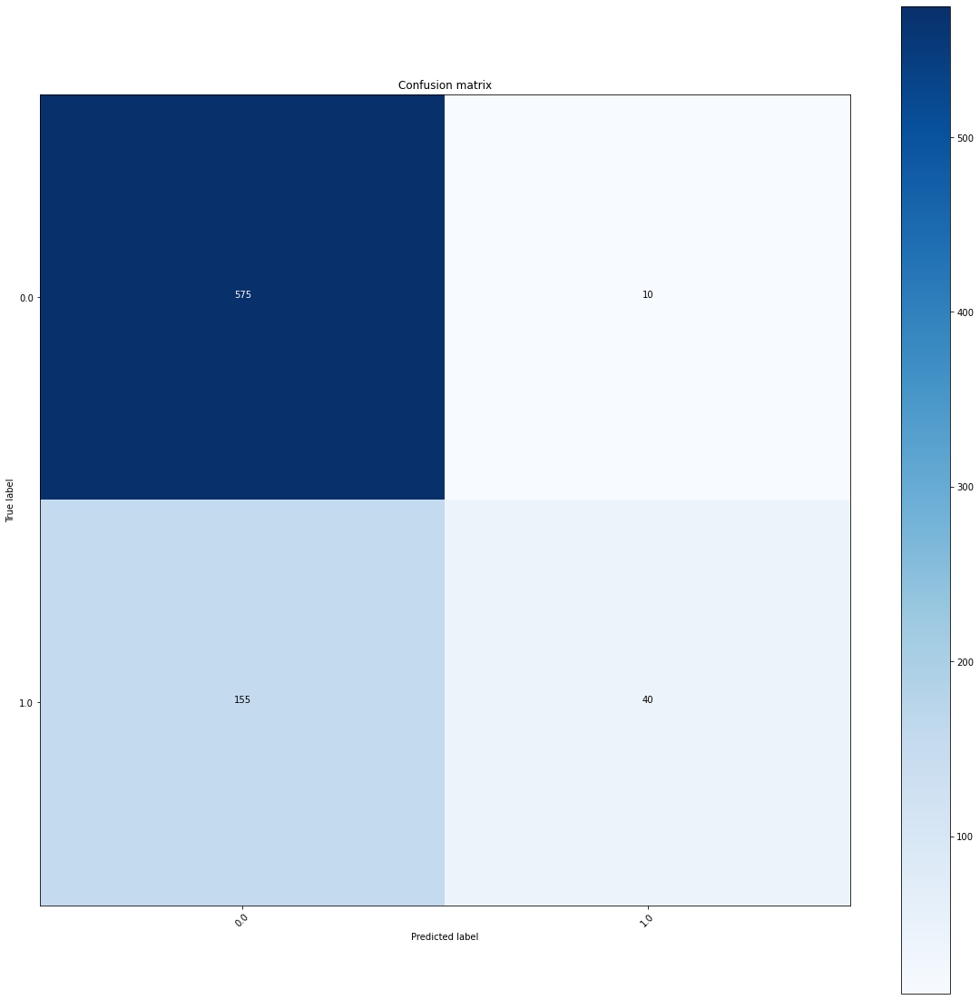

In [9]:
predecirYMostrarMatrizConfusion(dataframeTest,model,
                                "TemperaturaPrecSum3RegularizacionFull-20230131\Pesos-1-reg-1e-05-2\Pesos-20230131-3101-val_binary_accuracy-0.78846.hdf5", 0.6)

In [10]:
[parcelasAObservar, parcelasSinResultado]  = parcelasConAciertos(dataframeTest, model, 0.6)
dataframeAux = dataframeTest
dataframeDias = dataframeTest.loc[dataframeTest["recogido"] == 1]

39
hay  39  parcelas a observar
------------------
22_27_0_1_503_5019_1 dias que deberia dar 1 la prediccion:
30    302
31    303
32    304
33    305
34    306
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
dia:  306
ha acertado por lo menos un 1 de los que deberia
------------------
22_27_0_1_503_5560_8 dias que deberia dar 1 la prediccion:
50    302
51    303
52    304
53    305
54    306
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
dia:  303
ha acertado por lo menos un 1 de los que deberia
------------------
50_108_0_0_11_75 dias que deberia dar 1 la prediccion:
110    317
111    318
112    319
113    320
114    321
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
50_108_0_0_2_176 dias que deberia dar 1 la prediccion:
190    317
191    318
192    319
193    320
194    321
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
50_108_0_0_2_250 dias que deberia dar 1 la prediccion:
210    317
211    318
212 

dias que ha dado 1 la prediccion: 
dia:  314
------------------
50_255_0_0_18_13_5 dias que deberia dar 1 la prediccion:
1321    322
1322    323
1323    324
1324    325
1325    326
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
50_255_0_0_18_13_54 dias que deberia dar 1 la prediccion:
1341    322
1342    323
1343    324
1344    325
1345    326
Name: dia, dtype: int64
dias que ha dado 1 la prediccion: 
------------------
Parcelas con acierto:  16 de 39


C:\Users\ERNEST~1\AppData\Local\Temp/ipykernel_28272/1553106678.py:187: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_1_reception["PAC"] = newPac
C:\Users\ERNEST~1\AppData\Local\Temp/ipykernel_28272/1553106678.py:188: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_1_reception["Fecha de carga"] = newDate
C:\Users\ERNEST~1\AppData\Local\Temp/ipykernel_28272/1553106678.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

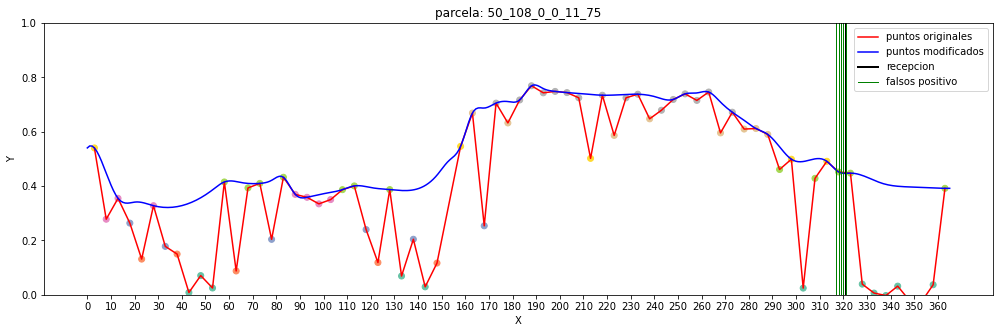

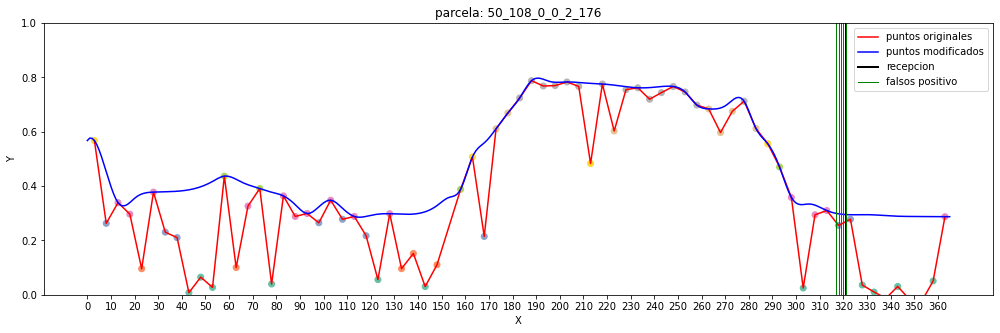

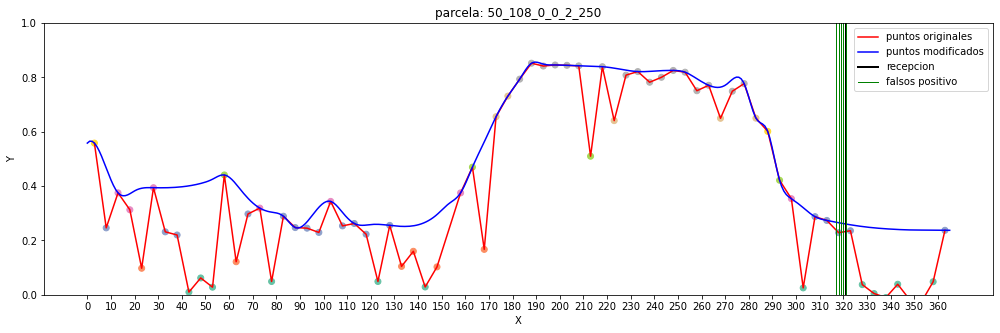

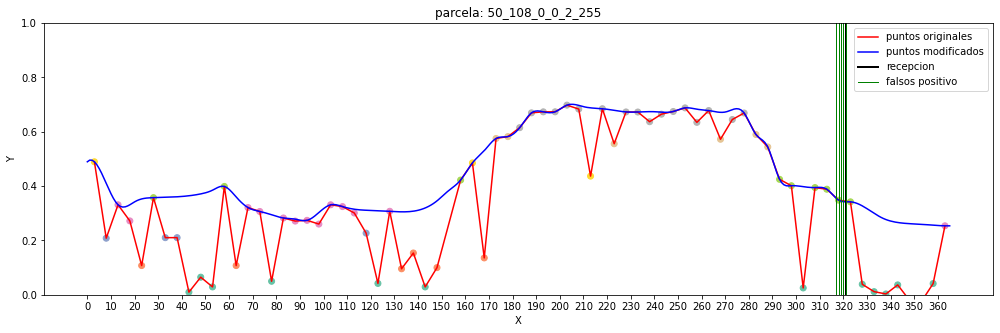

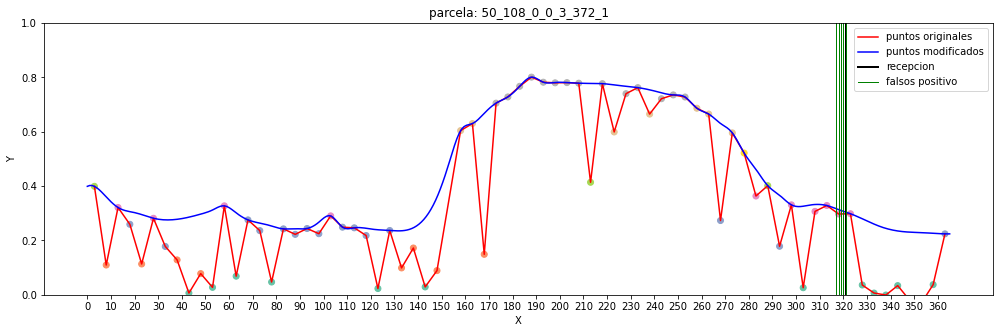

...

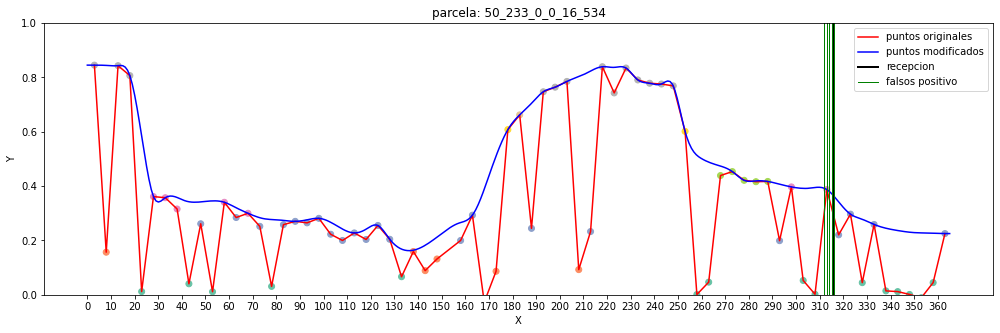

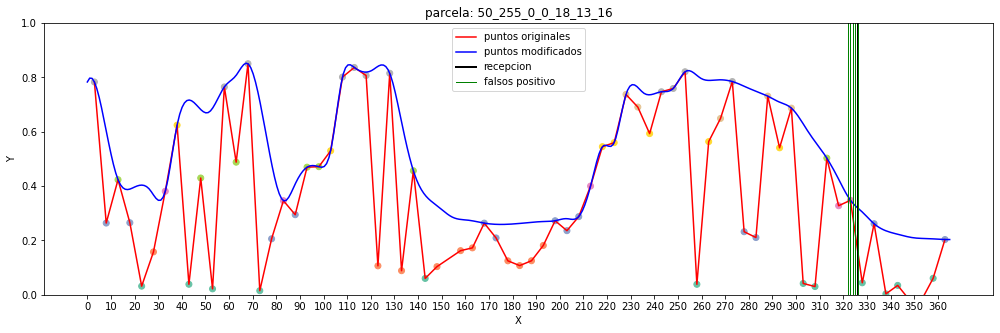

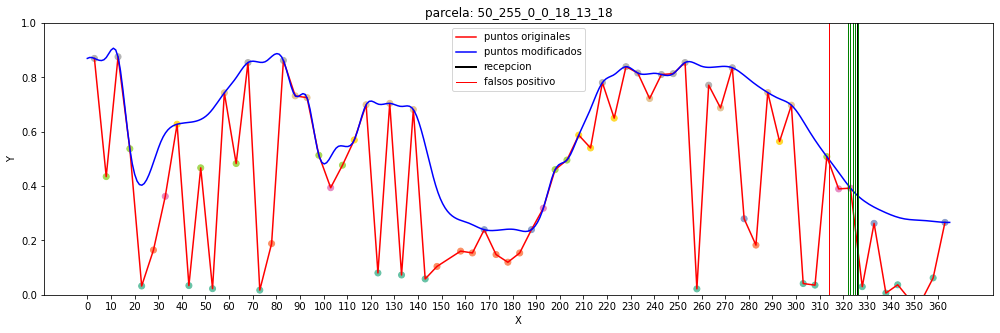

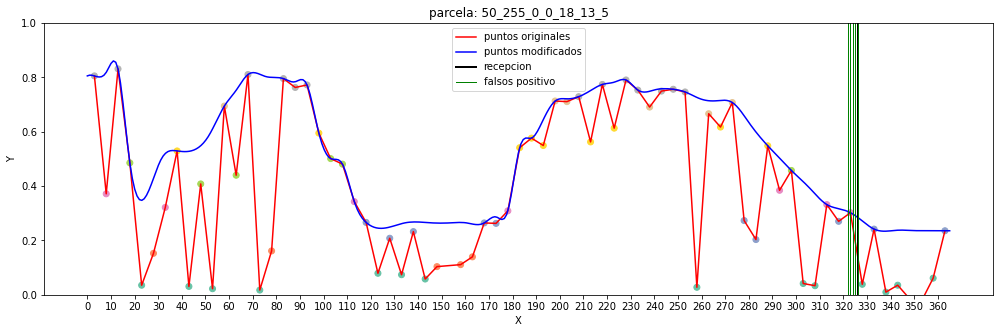

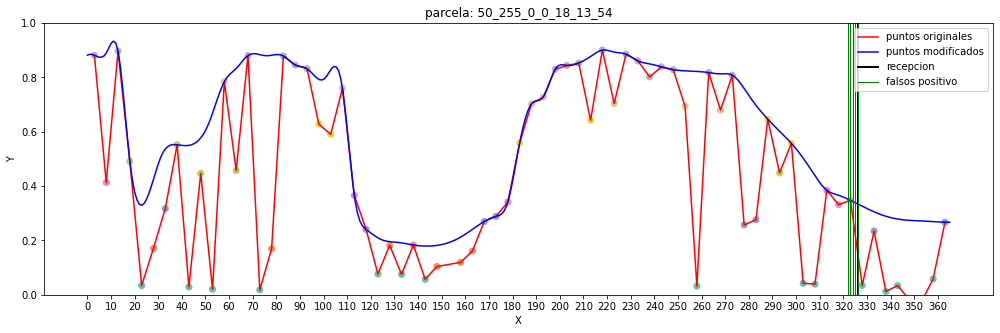

In [11]:
mostrarParcelasSinAciertos(parcelasSinResultado)

dia de recepcion:  306
true positives:  [306]


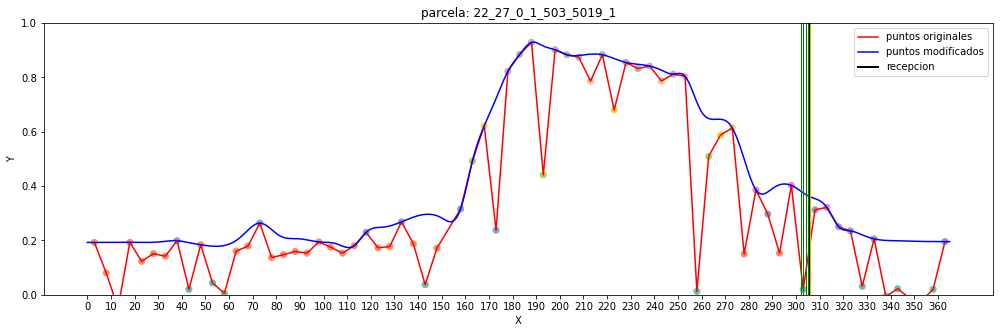

dia de recepcion:  306
true positives:  [303]


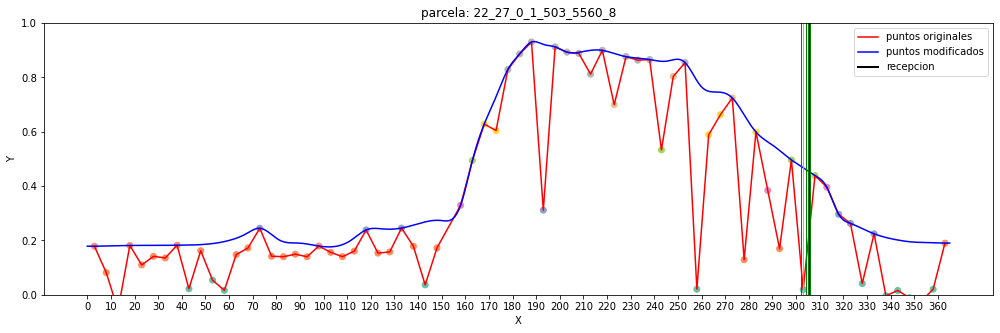

dia de recepcion:  295
true positives:  [291, 292, 293, 294, 295]


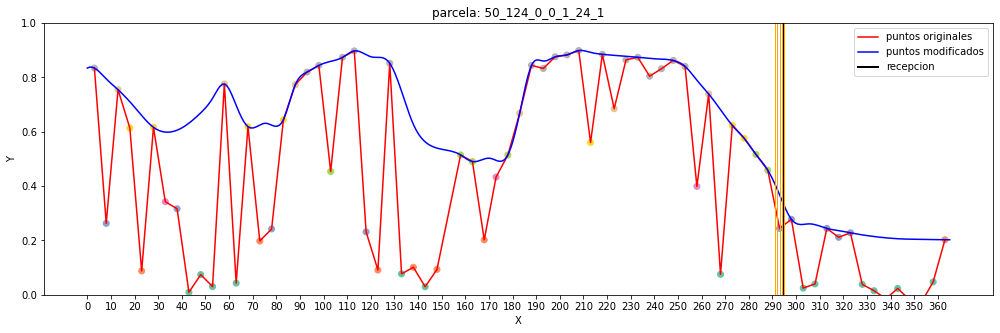

dia de recepcion:  295
true positives:  [291, 292, 293, 294, 295]


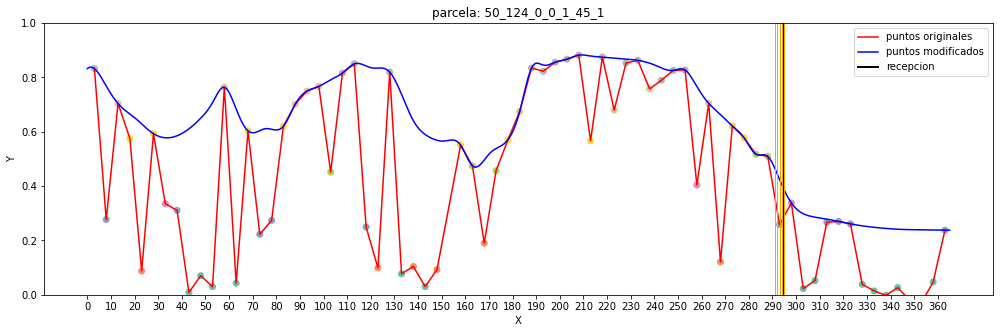

dia de recepcion:  295
true positives:  [292, 293, 294, 295]


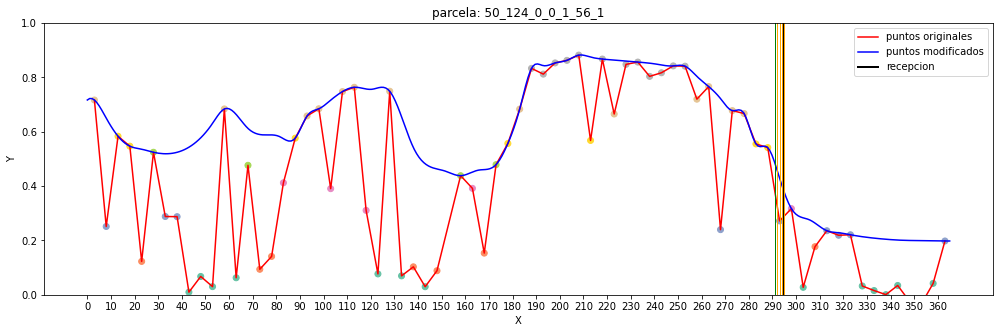

dia de recepcion:  295
true positives:  [293, 294]


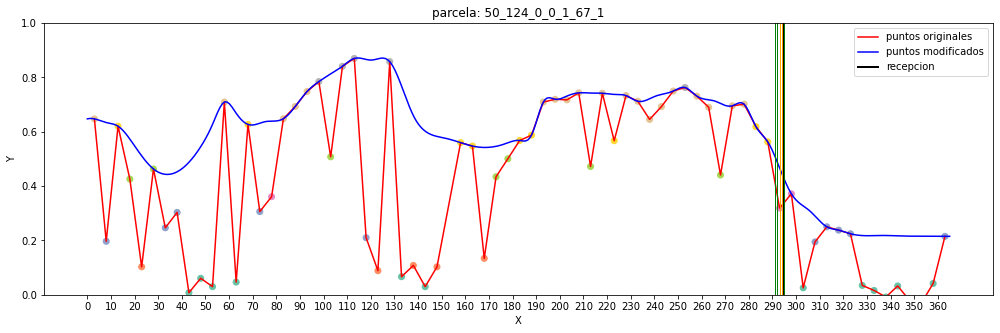

dia de recepcion:  312
true positives:  [311]


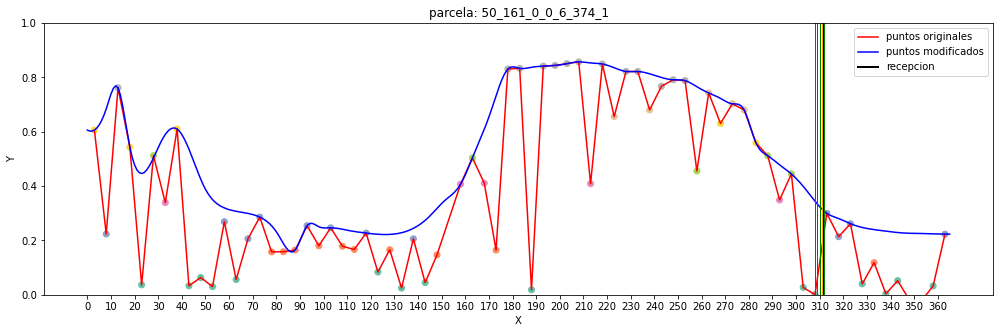

dia de recepcion:  364
true positives:  [361, 362]


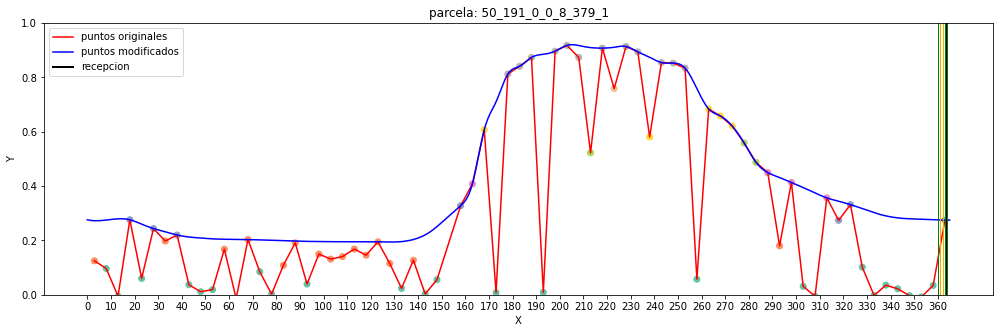

dia de recepcion:  364
true positives:  [361, 362]


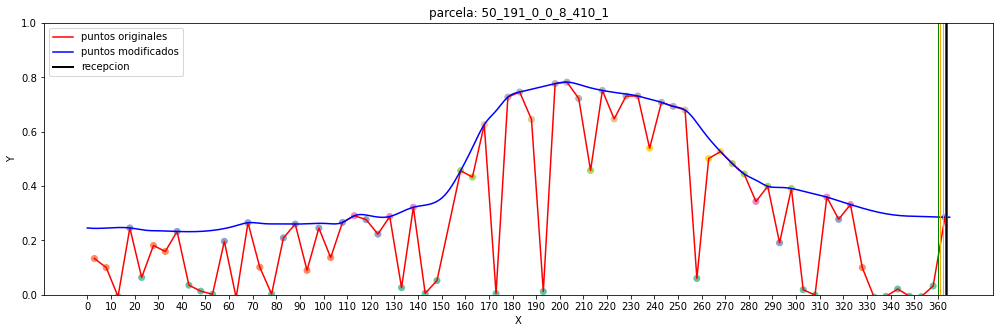

dia de recepcion:  364
true positives:  [361, 362, 363]


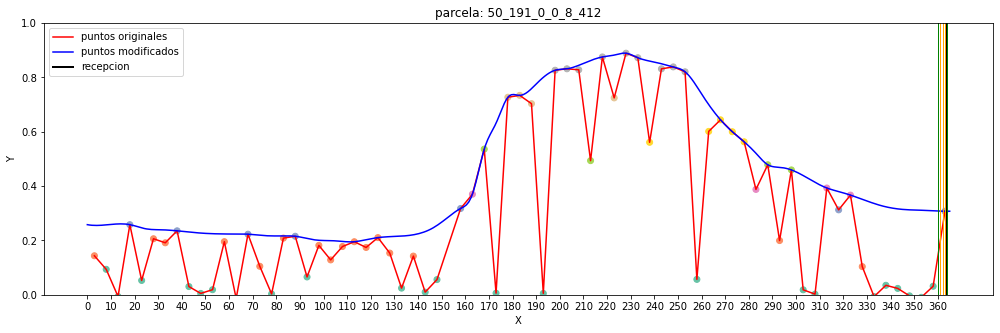

dia de recepcion:  364
true positives:  [361, 362, 363]


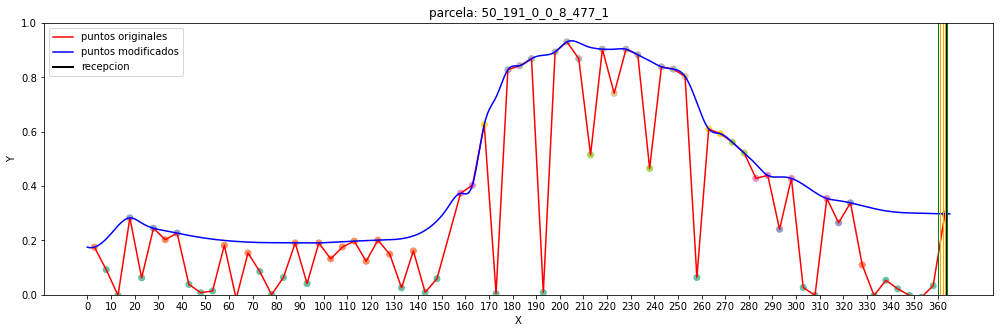

dia de recepcion:  364
true positives:  [361, 362]


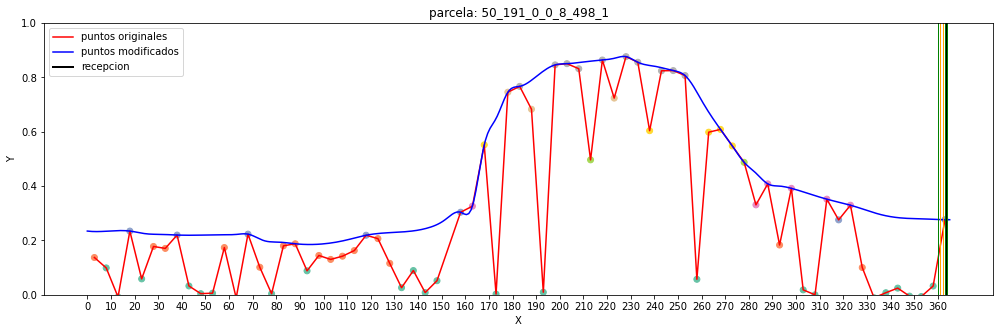

dia de recepcion:  316
true positives:  [316]


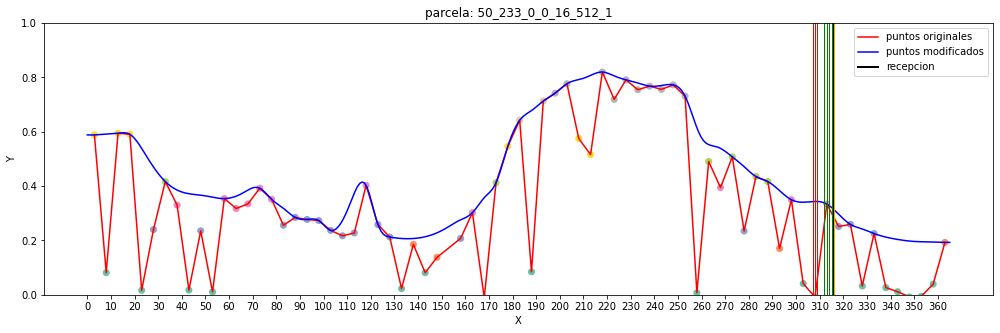

dia de recepcion:  294
true positives:  [291, 292, 293]


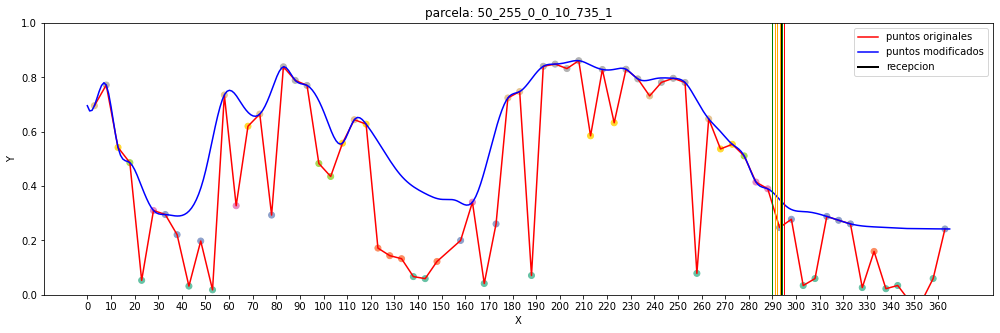

dia de recepcion:  294
true positives:  [291, 292, 293]


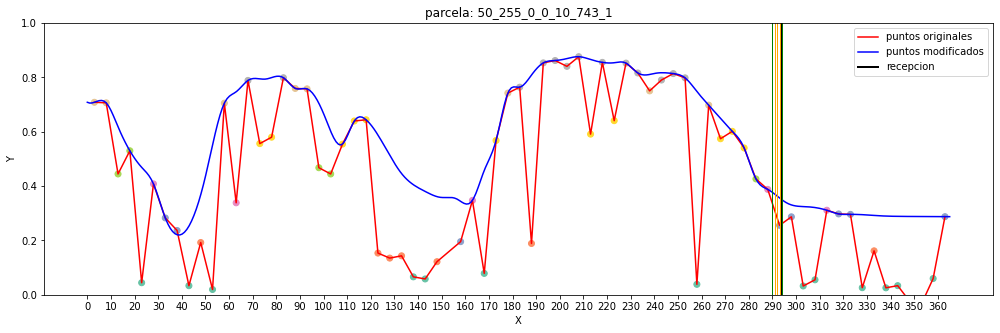

dia de recepcion:  326
true positives:  [322, 323]


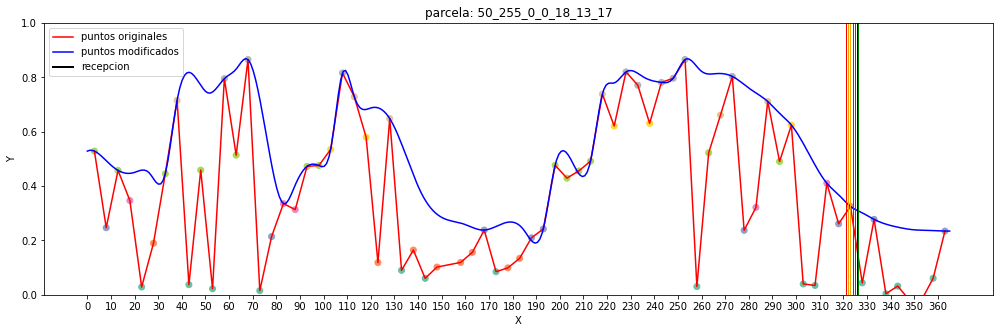

In [12]:
mostrarParcelasConAciertos(parcelasAObservar)

In [14]:
[mini,maxi,promedi] = exito(dataframeTest, funcionExito)

1/1 [==============================] - 0s 18ms/step
22_27_0_1_503_5019_1 [0.13336192] [0.06128508] -14
22_27_0_1_503_5019_1 [0.17369507] [0.08093417] -13
22_27_0_1_503_5019_1 [0.1988958] [0.09408757] -12
22_27_0_1_503_5019_1 [0.44576073] [0.21439244] -11
22_27_0_1_503_5019_1 [0.40002462] [0.216804] -6
22_27_0_1_503_5019_1 [0.42281926] [0.23778588] -5
22_27_0_1_503_5019_1 [0.6397535] [0.6397535] 0
[0.6397535]
1/1 [==============================] - 0s 21ms/step
22_27_0_1_503_5560_8 [0.16059619] [0.0738003] -14
22_27_0_1_503_5560_8 [0.18976486] [0.08842197] -13
22_27_0_1_503_5560_8 [0.20822959] [0.09850292] -12
22_27_0_1_503_5560_8 [0.33749264] [0.16874632] -9
22_27_0_1_503_5560_8 [0.73720014] [0.46015763] -3
22_27_0_1_503_5560_8 [0.525568] [0.525568] 0
[0.525568]
1/1 [==============================] - 0s 19ms/step
50_108_0_0_11_75 [0.01144405] [0.005259] -14
50_108_0_0_11_75 [0.08859321] [0.04128049] -13
50_108_0_0_11_75 [0.24495307] [0.11781228] -11
50_108_0_0_11_75 [0.34638155] [0.1731

1/1 [==============================] - 0s 21ms/step
50_233_0_0_16_1477_5 [0.1618102] [0.07435819] -14
50_233_0_0_16_1477_5 [0.33234242] [0.1628018] -10
50_233_0_0_16_1477_5 [0.90088874] [0.45044437] -9
[0.45044437]
1/1 [==============================] - 0s 18ms/step
50_233_0_0_16_348_1 [0.13629843] [0.06263452] -14
50_233_0_0_16_348_1 [0.22766566] [0.11962948] -7
50_233_0_0_16_348_1 [0.20523047] [0.12810412] -3
50_233_0_0_16_348_1 [0.40485293] [0.40485293] 0
[0.40485293]
1/1 [==============================] - 0s 21ms/step
50_233_0_0_16_348_12 [0.12899452] [0.05927809] -14
50_233_0_0_16_348_12 [0.15323225] [0.0805176] -7
50_233_0_0_16_348_12 [0.20313479] [0.11423932] -5
50_233_0_0_16_348_12 [0.2239025] [0.13975912] -3
50_233_0_0_16_348_12 [0.3897674] [0.3897674] 0
[0.3897674]
1/1 [==============================] - 0s 19ms/step
50_233_0_0_16_348_2 [0.20233291] [0.09297998] -14
50_233_0_0_16_348_2 [0.2786137] [0.15668727] -5
50_233_0_0_16_348_2 [0.43234545] [0.26986846] -3
50_233_0_0_16_3

In [15]:
print(mini,maxi,promedi)

[0.23093456] [0.74368036] [0.4997416]


Los valores del promedio casi siguen el sentido esperado ya que:<br>
TP3 -> 30 / 39 -> 0.62493557, mejor promedio<br>
TP3SN -> 22 / 39 -> 0.5021169, Segundo mayor promedio<br>
TP3RSN -> 20 / 39 -> 0.4934191, Peor promedio<br>
TP3R -> 16 / 39 -> 0.4997416, tercer mejor promedio

-------------------------------------------------------------------------------------------------------------------------------

Voy a repetir las pruebas pero con un modelo que normalize segun los datos de entrenamiento:

In [12]:
def obtenerModelo20230110Normalizado(dataframeTrain, regularizacion=1):
    # Perceptron de un solo nivel
    from keras.layers import Dense
    from keras.regularizers import l2
    import keras
    from keras.datasets import mnist
    from keras.models import Sequential
    from keras.layers import Dense, Dropout, Flatten
    from tensorflow.keras.optimizers import RMSprop, Adam, SGD
    from keras.callbacks import EarlyStopping
    import time
    import numpy as np
    import itertools
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix
    import tensorflow as tf
    from tensorflow.keras import layers

    
    X = np.asarray(dataframeTrain.drop(columns=['parcela','dia','recogido'])).astype(np.float32)
    
    normalizer = layers.Normalization()
    normalizer.adapt(X)
    
    n = dataframeTrain.drop(columns=['parcela','dia','recogido']).shape[1]

    model = Sequential()
    
    model.add(normalizer)
    #,kernel_initializer=initializer
    #model.add(Dense(n**3, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    #añadir capa
    model.add(Dense(n**2, activation='relu', input_shape=(n,), kernel_regularizer=l2(regularizacion)))
    model.add(Dense(n, activation='relu', kernel_regularizer=l2(regularizacion)))
    model.add(Dense(1, activation='sigmoid', kernel_regularizer=l2(regularizacion)))
    #
    model.compile(loss='binary_crossentropy', optimizer=Adam(),  metrics=[tf.keras.metrics.BinaryAccuracy(name='binary_accuracy', threshold=0.6), keras.metrics.Recall(name='recall')])
    model.summary()
    
    return model

Primera prueba: Datos completos con precipitacion del dia anterior solamente:

In [13]:
import pandas as pd
import numpy as np
        
df = pd.read_csv('datosEntrenables20230131-full.csv')
parcelasAQuitar = df.loc[df['estacion'] == 'not inialized']['parcela'].unique()
df = df[~df['parcela'].isin(parcelasAQuitar)]
df = df.drop(columns=['Unnamed: 0','precSum3','estacion'])
df = quitarDatosMalos(df )
df = anyadirRelacionesParametros(df, ['parcela','dia','recogido','tmed','prec'])
anyadirUnos(df)
[dataframeTrain, dataframeTest] = separarTrainTest(df)

In [14]:
regularizacion = 0.00001
model = obtenerModelo20230110Normalizado(dataframeTrain, regularizacion)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 13)               27        
 ion)                                                            
                                                                 
 dense_3 (Dense)             (None, 169)               2366      
                                                                 
 dense_4 (Dense)             (None, 13)                2210      
                                                                 
 dense_5 (Dense)             (None, 1)                 14        
                                                                 
Total params: 4,617
Trainable params: 4,590
Non-trainable params: 27
_________________________________________________________________


Datos con los que voy a entrenar:

In [15]:
dataframeTrain

,pendiente dia -15,pendiente dia -10,pendiente dia -5,ndvi,col 1 * col 2,col 1 * col 3,col 1 * col 4,col 2 * col 3,col 2 * col 4,col 3 * col 4,parcela,dia,recogido,tmed,prec,unos
0,0.013078,0.008582,-0.002236,0.456587,0.000112,-0.000029,0.005971,-0.000019,0.003919,-0.001021,22_27_0_1_503_5017_1,292,0,17.4,0.0,1
1,0.011039,0.005081,-0.006042,0.467762,0.000056,-0.000067,0.005164,-0.000031,0.002377,-0.002826,22_27_0_1_503_5017_1,293,0,18.0,0.0,1
2,0.008906,0.001723,-0.008617,0.478748,0.000015,-0.000077,0.004264,-0.000015,0.000825,-0.004126,22_27_0_1_503_5017_1,294,0,17.6,0.0,1
3,0.006757,-0.001304,-0.009899,0.488632,-0.000009,-0.000067,0.003301,0.000013,-0.000637,-0.004837,22_27_0_1_503_5017_1,295,0,15.5,0.0,1
4,0.004652,-0.003832,-0.010032,0.496736,-0.000018,-0.000047,0.002311,0.000038,-0.001903,-0.004983,22_27_0_1_503_5017_1,296,0,13.7,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8155,0.005049,0.004059,0.004025,0.414865,0.000020,0.000020,0.002094,0.000016,0.001684,0.001670,50_224_0_2_18_50_1,289,0,16.8,0.0,1
8156,0.005029,0.004006,0.004614,0.409131,0.000020,0.000023,0.002057,0.000018,0.001639,0.001888,50_224_0_2_18_50_1,290,0,16.4,0.0,1
8157,0.004980,0.004131,0.005174,0.402966,0.000021,0.000026,0.002007,0.000021,0.001665,0.002085,50_224_0_2_18_50_1,291,0,17.8,0.2,1
8158,0.004917,0.004413,0.005670,0.396435,0.000022,0.000028,0.001949,0.000025,0.001750,0.002248,50_224_0_2_18_50_1,292,0,18.8,0.0,1


In [ ]:
iteraciones = 1000
epochs = 10000
from keras.callbacks import ModelCheckpoint
for i in range(iteraciones):
    fecha = str(20230131)
    carpeta = 'TemperaturaPrecipitacionRegularizacionFullNormalized-' + fecha + '/Pesos-1-reg-' +str(regularizacion) + '-' + str(i+1)
    checkpoint_name =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-binary_accuracy-{binary_accuracy:.5f}.hdf5' 
    checkpoint = ModelCheckpoint(checkpoint_name, monitor='binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name2 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-recall-{recall:.5f}.hdf5' 
    checkpoint2 = ModelCheckpoint(checkpoint_name2, monitor='recall', verbose = 0, save_best_only = True, mode ='max')
    checkpoint_name3 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_binary_accuracy-{val_binary_accuracy:.5f}.hdf5' 
    checkpoint3 = ModelCheckpoint(checkpoint_name3, monitor='val_binary_accuracy', verbose = 0, save_best_only = True, mode ='auto')
    checkpoint_name4 =  carpeta + '/Pesos-'+fecha+'-{epoch:03d}-val_recall-{val_recall:.5f}.hdf5' 
    checkpoint4 = ModelCheckpoint(checkpoint_name4, monitor='val_recall', verbose = 0, save_best_only = True, mode ='max')
    
    callbacks_list = [ checkpoint, checkpoint2, checkpoint3, checkpoint4]
    
    entrenarModelo(model, dataframeTrain, dataframeTest, 800, epochs, callbacks_list)
    model.save_weights(carpeta+ '/my_weights-' + str((i+1) * epochs) + '.h5')